Ομάδα 94: Κριθαρούλα Αναστασία - 03117073, Κριθαρούλας Διονύσης - 03117875

# 3η Εργαστηριακή Άσκηση: Βαθιά Μάθηση - Image Captioning 

Θέμα της συγκεκριμένης εργαστηριακής άσκησης είναι η Βαθία Μάθηση. Θα μελετήσουμε ένα πρόβλημα που συνδυάζει Όραση Υπολογιστών και Επεξεργασία Φυσικής Γλώσσας. Συγκεκριμένα, θα φτιάξουμε ένα νευρωνικό δίκτυο παραγωγής λεκτικών περιγραφών από εικόνες (Image Captioning).

Σημείο εκκίνησης θα είναι το επίσημο tutorial του TensorFlow ["Image captioning with visual attention"](https://www.tensorflow.org/tutorials/text/image_captioning). Θα δουλέψουμε ωστόσο σε άλλο dataset και θα προσπαθήσουμε να βελτιώσουμε το tutorial σε διάφορα σημεία.

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

import collections
import random
import numpy as np
import os
import time
import json
from PIL import Image

## Σύνολο δεδομένων

Τα ευρύτερα χρησιμοποιούμε datasets στο task του Image Captioning είναι τα Flickr8k, Flickr30k και το COCO, με το tutorial του TensorFlow να χρησιμοποιεί το COCO. Στη συγκεκριμένη εργαστηριακή άσκηση θα χρησιμοποιήσουμε το 'flickr30k-images-ecemod', μια παραλλαγή του flick30k κατάλληλη για τη συγκεκριμένη άσκηση. Τα δεδομένα του 'flickr30k-image-ecemod' είναι τα εξής:

- ένας φάκελος "<i>image_dir</i>" με 31.783 εικόνες από το Flickr
- ένα αρχείο "<i>train_captions.csv</i>" με 148.915 captions για τις εικόνες του "<i>image_dir</i>"
- ένα αρχείο "<i>test_images.csv</i>" με 2.000 ονόματα εικόνων από το "<i>image_dir</i>" που δεν έχουν captions εκπαίδευσης 

Αρχικά, για να κατεβάσουμε τις εικόνες του dataset τρέχουμε τις ακόλουθες εντολές:

In [ ]:
if not os.path.exists("./image_dir"):
    image_zip = tf.keras.utils.get_file('flickr30k-images-ecemod.zip',
                                      cache_subdir=os.path.abspath('.'),
                                      origin='https://spartacus.1337.cx/flickr-mod/flickr30k-images-ecemod.zip',
                                      extract=True)
    os.remove(image_zip)

4376395776/4376381805 [==============================] - 280s 0us/step


και στη συνέχεια για τα αρχεία "<i>train_captions.csv</i>" και "<i>test_images.csv</i>" τρέχουμε:

In [ ]:
if not os.path.exists("./train_captions.csv"):
    train_captions_file = tf.keras.utils.get_file('train_captions.csv',
                                               cache_subdir=os.path.abspath('.'),
                                               origin='https://spartacus.1337.cx/flickr-mod/train_captions.csv',
                                               extract=False)

if not os.path.exists("./test_images.csv"):
    test_images_file = tf.keras.utils.get_file('test_images.csv',
                                               cache_subdir=os.path.abspath('.'),
                                               origin='https://spartacus.1337.cx/flickr-mod/test_images.csv',
                                               extract=False)

40960/29242 [==========================================] - 0s 0us/step


To αρχείο "<i>train_captions.csv</i>" περιλαμβάνει τα captions των εικόνων, ένα σε κάθε γραμμή. Πιο αναλυτικά, κάθε γραμμή του αποτελείται από τρία στοιχεία τα οποία χωρίζονται μεταξύ τους με το σύμβολο "|". Το πρώτο στοιχείο περιέχει το όνομα της εικόνας (π.χ. _<<i>image_name</i>>.jpg). Το δεύτερο στοιχείο περιέχει τον αύξοντα αριθμό του caption της εικόνας (κάθε εικόνα διαθέτει 5 captions) και το τρίτο στοιχείο το ίδιο το caption. Φορτώνουμε το αρχείο αυτό σε ένα dataframe οπότε και έχουμε: 

In [ ]:
import pandas as pd

df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)

In [ ]:
df

,0,1,2
0,_1000070808.jpg,0,A little girl holds orange lilies while other...
1,_1000070808.jpg,1,A little girl at a wedding holds a bouquet of...
2,_1000070808.jpg,2,Young girl in orange dress holding orange flo...
3,_1000070808.jpg,3,a girl at a wedding holding some orange flowers
4,_1000070808.jpg,4,A girl holds a bouquet of flowers
...,...,...,...
148910,_99999606.jpg,0,A man in a gray shirt sits with several pairs...
148911,_99999606.jpg,1,A man is sitting down and he is surrounded by...
148912,_99999606.jpg,2,Older man with shoes in front and behind him .
148913,_99999606.jpg,3,This man has worked here for many decades .


In [ ]:
#Train images
print(int((len(df)/5.0)))

29783


In [ ]:
# All images (add 2000 for test images)
print(int((len(df)/5.0) + 2000))

31783


## Το μοντέλο

![](https://drive.google.com/uc?export=view&id=1LY6HoFEBKscEcRDu9QXABi57lTbmnD1r)

Το μοντέλο του tutorial του TensorFlow ακολουθεί τη συνήθη αρχιτεκτονική στη Βαθιά Μάθηση του Encoder - Decoder. Στον Encoder αντιστοιχούν τα βήματα 1 και 2 και στον Decoder τα βήματα 3-5. Πιο αναλυτικά:

<b>Encoder</b>: ένα pretrained συνελικτικό δίκτυο λαμβάνει ως είσοδο την εικόνα (1). Η μεταφορά μάθησης γίνεται χωρίς το classification head. Μας ενδιαφέρει μόνο η έξοδος που δίνουν για την εικόνα τα ανώτερα συνελικτικά επίπεδα του δικτύου. Εφόσον έχει εκπαιδευτεί επιτυχώς σε κάποιο classification task, τα συνελικτικά επίπεδα θα πρέπει να εξάγουν αποτελεσματικά τα σημαντικά χαρακτηριστικά της εικόνας (2). Το CNN λειτουργεί λοιπόν ως feature extractor δημιουργώντας μια "πλούσια" κωδικοποίηση της εικόνας.

<b> Decoder</b>: o decoder λαμβάνει την είσοδο του encoder μέσα από ένα fully conected επίπεδο. Λαμβάνει επίσης μια-μία τις λέξεις της περιγραφής με τη μορφή embeddings (3). Το επίπεδο της προσοχής (Attention Module1) λαμβάνει ως είσοδο το hidden state του προηγούμενου βήματος και την είσοδο από τον encoder. Υπολογίζει την ευθυγράμμιση (alignement) των περιοχών της εικόνας με την κρυφή κατάσταση και περνάει τις τιμές από softmax. Οι τιμές αυτές πολλαπλασιάζονται με την είσοδο του encoder δημιουργώντας το context vector: κάποιες περιοχές της εικόνας θα είναι πιο ενεργές για τη δημιουργία της επόμενης κατάστασης. Το επαναληπτικό δίκτυο λαμβάνει ως είσοδο τα embeddings και το context vector και παράγει την επόμενη κρυφή κατάσταση (4). Τέλος, το δίκτυο εξάγει πιθανότητες για κάθε δυνατή επόμενη λέξη και ο Sentence Generator την επιλέγει με κάποια μεθοδολογία όπως με τυχαία επιλογή που ακολουθεί την κατανομή των πιθανοτήτων των λέξεων.

### Προεπεξεργασία δεδομένων

#### Προεπεξεργασία εικόνων με χρήση του InceptionV3

Ομοίως, με το tutorial του TensorFlow θα χρησιμοποιήσουμε αρχικά το συνελικτικό δίκτυο InceptionV3 (προεκπαιδευμένο πάνω στο Imagenet) προκειμένου να ταξινομήσουμε τις εικόνες οπότε και θα εξάγουμε για κάθε μια από αυτές χαρακτηριστικά από το τελευταίο convolutional layer. Προκειμένου, όμως, να μπορέσουμε να χρησιμοποιήσουμε το δίκτυο αυτό θα πρέπει να προεπεξεργαστούμε κατάλληλα τις εικόνες έτσι ώστε να ταιριάζουν με το 'format' που αυτό απαιτεί στην είσοδό του. Για το λόγο αυτό τροποποιούμε τις διαστάσεις των εικόνων (resize) σε (299, 299), ενώ παράλληλα κανονικοποιούμε τις τιμές των pixel στο διάστημα -1 έως 1. Για το σκοπό αυτό χρησιμοποιούμε τη συνάρτηση `load_image`. 

In [ ]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.keras.layers.Resizing(299, 299)(img)
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path

Ορίζουμε αρχικά ένα tf.keras μοντέλο όπου η έξοδος του αντιστοιχεί στο τελευταίο convolutional layer της αρχιτεκτονικής InceptionV3. 

In [ ]:
image_model = tf.keras.applications.InceptionV3(include_top=False,
                                                weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

2022-03-02 15:40:17.473352: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-02 15:40:17.573391: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-02 15:40:17.574083: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-02 15:40:17.575197: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

87924736/87910968 [==============================] - 2s 0us/step


Στη συνέχεια προκεμένου να εξάγουμε χαρακτηριστικά για όλες τις εικόνες που περιέχονται στο φάκελο <i>image_dir</i>, εφαρμόζουμε σε κάθε μια από αυτές τη συνάρτηση `load_image` και στη συνέχεια την περνάμε μέσα από το δίκτυο που μόλις ορίσαμε. Με τον τρόπο αυτό κατασκευάζουμε για κάθε εικόνα τα αντίστοιχα χαρακτηριστικά της, τα οποία και τελικά αποθηκεύουμε στο <i>image_dir</i> σε αρχεία της μορφής _<<i>image_name</i>>.npy.

In [ ]:
# Group all captions together having the same image ID.
image_path_to_caption = collections.defaultdict(list)
for index, row in df.iterrows():
    caption = '<start>' + row[2] + ' <end>'
    image_path = "./image_dir/" + row[0]
    image_path_to_caption[image_path].append(caption)

In [ ]:
image_paths = list(image_path_to_caption.keys())
random.shuffle(image_paths)

In [ ]:
train_captions = []
img_name_vector = []

for image_path in image_paths:
    caption_list = image_path_to_caption[image_path]
    train_captions.extend(caption_list)
    img_name_vector.extend([image_path] * len(caption_list))

In [ ]:
# Get unique images
encode_train = sorted(set(img_name_vector))

# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.AUTOTUNE).batch(16)
  
for img, path in image_dataset:
    batch_features = image_features_extract_model(img)
    batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

    for bf, p in zip(batch_features, path):
        path_of_feature = p.numpy().decode("utf-8")
        np.save(path_of_feature, bf.numpy())

2022-03-02 15:40:25.679448: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-03-02 15:40:26.550986: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


<i><u>Σχόλιο</u>: Προκειμένου να μην κατεβάζουμε κάθε φορά εκ νέου τα αρχεία δεδομένων και παράλληλα να κατασκευάζουμε τα αντίστοιχα npy αρχεία, τα φορτώνουμε ως dataset με όνομα "create-data-nn-lab3" στο τρέχον kaggle notebook. Το dataset αυτό περιλαμβάνει τα αρχεία "train_captions.csv", "test_images.csv" καθώς και το φάκελο "image_dir" με τις εικόνες (αρχεία τύπου jpg) και τα αντίστοιχα χαρακτηριστικά τους (αρχεία τύπου npy).</i>

#### Προεπεξεργασία των captions

Ακολουθώντας το tutorial του TensοrFLow θα μετατρέψουμε τα captions σε ακολουθίες ακεραίων αριθμών χρησιμοποιώντας το TextVectorization layer της tensorflow, ακολουθώντας τα ακόλουθα βήματα.

In [ ]:
vocabulary_size = 5000
min_length = 0
max_length = 50

Αρχικά, μετατρέπουμε τα κείμενα όλων των captions σε πεζά και αφαιρούμε από αυτά τα σημεία στίξης. Από το σύνολο όλων των επεξεργασμένων captions επιλέγουμε και κρατάμε αυτά που έχουν μήκος (πλήθος λέξεων) μεταξύ <i>min_length</i> και <i>max_length</i>, και στη συνέχεια στην αρχή και στο τέλος κάθε caption προσθέτουμε τις ειδικές λέξεις $<start>$ και $<end>$ αντίστοιχα. Για το σκοπό αυτό χρησιμοποιούμε τη συνάρτηση `preprocessing`, και τελικά κατασκευάζουμε ένα dictionary `image_to_path_caption` το οποίο περιέχει ως keys τα paths των εικόνων (στα .jpg αρχεία) και ως value για κάθε εικόνα μια λίστα με τα αντίστοιχα προεπεξεργασμένα captions σε μορφή string.

In [ ]:
import re

def preprocessing(caption, min_length, max_length):
    
    p_caption = str.lower(re.sub("[^A-Za-z']+", ' ', caption)).split()
    if len(p_caption) < min_length or len(p_caption) > max_length:
        return None
    else:
        return '<start> ' + ' '.join(p_caption) + ' <end>'

In [ ]:
image_path_to_caption = collections.defaultdict(list)
for index, row in df.iterrows():
    caption = preprocessing(row[2], min_length, max_length)
    if caption:
        image_path = "../input/create-data-nn-lab3/image_dir/" + row[0]
        image_path_to_caption[image_path].append(caption)

Στη συνέχεια δημιουργούμε δύο λίστες `img_name_vector` και `train_captions`, με κάθε στοιχείο της πρώτης να περιέχει ένα path προς το .jpg αρχείο μιας εικόνας, και τη δεύτερη να περιέχει στο αντίστοιχο index ένα string ενός προεπεξεργασμένου caption που αντιστοιχεί στην εικόνα αυτή. (Με άλλα λόγια η λίστα `train_captions` αντιστοιχεί στα values του dictionary `image_to_path_captions`, ενώ η `img_name_vector` στα keys του `image_to_path_captions` με κάθε path εικόνας (key) να επαναλαμβάνεται τόσες φορές όσα και τα προεπεξεργασμένα captions αυτής). 

In [ ]:
train_captions = []
img_name_vector = []

for image_path in image_paths:
    caption_list = image_path_to_caption[image_path]
    train_captions.extend(caption_list)
    img_name_vector.extend([image_path] * len(caption_list))

Έπειτα, εφαρμόζουμε tokenize (split με το χαρακτήρα ' ') στα προεπεξεργασμένα captions, και αντιστοιχίζουμε κάθε λέξη στο αντίστοιχο index της από το λεξιλόγιο που δημιουργεί ο tokenizer (με βάση τις top <i>vocabulary_size</i> λέξεις του συνόλου των captions). Με τον τρόπο αυτό κάθε caption που περιέχεται στην `train_captions` αντιστοιχίζεται σε μια ακολουθία από indexes, στην οποία μάλιστα εφαρμόζεται padding μέχρι το μήκος <i>max_length</i>, με τις ακολουθίες αυτές να αποθηκεύονται στην `cap_vector`, ενώ παράλληλα δημιουργούμε και word-to-index και index-to-word mappings για να παρουσιάσουμε τα αποτελέσματα. 

In [ ]:
caption_dataset = tf.data.Dataset.from_tensor_slices(train_captions)

def standardize(inputs):
    inputs = tf.strings.lower(inputs)
    return tf.strings.regex_replace(inputs, r"[^A-Za-z<>]+", " ", replace_global = True)

tokenizer = tf.keras.layers.TextVectorization(
    max_tokens=vocabulary_size,
    standardize=standardize,
    output_sequence_length=max_length)

tokenizer.adapt(caption_dataset)

2022-03-04 13:10:27.435825: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


In [ ]:
cap_vector = caption_dataset.map(lambda x: tokenizer(x))

In [ ]:
word_to_index = tf.keras.layers.StringLookup(
    mask_token="",
    vocabulary=tokenizer.get_vocabulary())

index_to_word = tf.keras.layers.StringLookup(
    mask_token="",
    vocabulary=tokenizer.get_vocabulary(),
    invert=True)

#### Χωρισμός των δεδομένων σε training και validation set

Τέλος, χωρίζουμε τις εικόνες με τα αντίστοιχα captions σε train και validation set με ποσοστό 80%-20%. 

In [ ]:
img_to_cap_vector = collections.defaultdict(list)
for img, cap in zip(img_name_vector, cap_vector):
    img_to_cap_vector[img].append(cap)

# Create training and validation sets using an 80-20 split randomly.
img_keys = list(img_to_cap_vector.keys())
random.shuffle(img_keys)

slice_index = int(len(img_keys)*0.8)
img_name_train_keys, img_name_val_keys = img_keys[:slice_index], img_keys[slice_index:]

img_name_train = []
cap_train = []
for imgt in img_name_train_keys:
    capt_len = len(img_to_cap_vector[imgt])
    img_name_train.extend([imgt] * capt_len)
    cap_train.extend(img_to_cap_vector[imgt])

img_name_val = []
cap_val = []
for imgv in img_name_val_keys:
    capv_len = len(img_to_cap_vector[imgv])
    img_name_val.extend([imgv] * capv_len)
    cap_val.extend(img_to_cap_vector[imgv])

#### Σύνοψη της προεπεξεργασίας των δεδομένων

Οργανώνουμε τη διαδικασία προεπεξεργσίας τω δεδομένων που περιγράψαμε παραπάνω ορίζοντας τις ακόλουθες συναρτήσεις:

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)

In [ ]:
def CreateCaptions(max_length, min_length, df, seed = 20, samples = 6000):
    
    image_path_to_caption = collections.defaultdict(list)
    for index, row in df.iterrows():
        caption = preprocessing(row[2], min_length, max_length)
        if caption:
            image_path = "../input/create-data-nn-lab3/image_dir/" + row[0]
            image_path_to_caption[image_path].append(caption)
            
    seed = 20
    image_paths = list(image_path_to_caption.keys())
    random.seed(seed)
    random.shuffle(image_paths)
    
    train_image_paths = image_paths[:samples]
    train_captions = []
    img_name_vector = []

    for image_path in train_image_paths:
        caption_list = image_path_to_caption[image_path]
        train_captions.extend(caption_list)
        img_name_vector.extend([image_path] * len(caption_list))
     
    return img_name_vector, train_captions

In [ ]:
def TokenizeCaptions(train_captions, max_length, vocabulary_size = 5000):
    
    caption_dataset = tf.data.Dataset.from_tensor_slices(train_captions)
    tokenizer = tf.keras.layers.TextVectorization(
    max_tokens=vocabulary_size,
    standardize=standardize,
    output_sequence_length=max_length)

    tokenizer.adapt(caption_dataset)    
    
    cap_vector = caption_dataset.map(lambda x: tokenizer(x))
    
    word_to_index = tf.keras.layers.StringLookup(mask_token="", vocabulary=tokenizer.get_vocabulary())
    index_to_word = tf.keras.layers.StringLookup(mask_token="",vocabulary=tokenizer.get_vocabulary(),invert=True)
    return cap_vector, word_to_index, index_to_word

In [ ]:
def SplitDataset(img_name_vector, cap_vector):
    
    img_to_cap_vector = collections.defaultdict(list)
    for img, cap in zip(img_name_vector, cap_vector):
        img_to_cap_vector[img].append(cap)

    img_keys = list(img_to_cap_vector.keys())
    random.shuffle(img_keys)

    slice_index = int(len(img_keys)*0.8)
    img_name_train_keys, img_name_val_keys = img_keys[:slice_index], img_keys[slice_index:]

    img_name_train = []
    cap_train = []
    for imgt in img_name_train_keys:
        capt_len = len(img_to_cap_vector[imgt])
        img_name_train.extend([imgt] * capt_len)
        cap_train.extend(img_to_cap_vector[imgt])

    img_name_val = []
    cap_val = []
    for imgv in img_name_val_keys:
        capv_len = len(img_to_cap_vector[imgv])
        img_name_val.extend([imgv] * capv_len)
        cap_val.extend(img_to_cap_vector[imgv])
        
    return img_name_train, cap_train, img_name_val, cap_val

In [ ]:
def CreateDataset(df, max_length = 50, min_length = 0, vocabulary_size = 5000, samples = 10000, seed = 20):
    
    img_name_vector, train_captions = CreateCaptions(max_length, min_length, df, seed, samples)
    cap_vector, word_to_index, index_to_word = TokenizeCaptions(train_captions, max_length, vocabulary_size)
    img_name_train, cap_train, img_name_val, cap_val = SplitDataset(img_name_vector, cap_vector)
    
    return img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word

<I><u>Σχόλιο</u>:Προκειμένου να εξοικονομήσουμε χρόνο κατά τη διαδικασία δοκιμής των μοντέλων και επιλογής κατάλληλων υπερπαραμέτρων, επιλέγουμε να μην εκπαιδεύουμε το εκάστοτε μοντέλο μας πάνω σε όλο το dataset, αλλά σε ένα μέρος αυτού (π.χ. 10000 εικόνες με έως 5 caption η κάθε εικόνα) ορίζοντας κατάλληλα την τιμή της παραμέτρου `samples`. Παράλληλα, για να έχουμε μια πιο δίκαιη σύγκριση των μοντέλων που κατασκευάζουμε, χρησιμοποιούμε το random.seed έτσι ώστε να κρατάμε πάντα το ίδιο υποσύνολο των αρχικών δεδομένων μας κατά την εκπαίδευση.</i>

#### Δημιουργία ενός tf.data dataset για τη διαδικασία του training

Σύμφωνα με τη διαδικασία που περιγράψαμε παραπάνω έχουμε ολοκληρώσει την απαιτούμενη προεπεξεργασία των εικόνων και των captions, οπότε με βάση αυτά θα δημιουργήσουμε το τελικό tf.data dataset, το οποίο και θα χρησιμοποιήσουμε για το training του μοντέλου. Για το σκοπό αυτό ακολουθούμε τη διαδικασία που περιγράφεται στο tutorial του TensorFLow, όπως φαίνεται παρακάτω.

In [ ]:
# Feel free to change these parameters according to your system's configuration

BATCH_SIZE = 64
BUFFER_SIZE = 1000
embedding_dim = 256
units = 512
num_steps = len(img_name_train) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

In [ ]:
# Load the numpy files
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int64]),
          num_parallel_calls=tf.data.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

Ομαδοποιούμε την παραπάνω διαδικασία ορίζοντας τη συνάρτηση `CreateTrainDataset` όπως φαίνεται παρακάτω:

In [ ]:
def CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 256, units = 512, features_shape = 2048, attention_features_shape = 64):
  num_steps = len(img_name_train) // BATCH_SIZE
  
  ## for CNN model InceptionV3 ##
  #features_shape = 2048
  #attention_features_shape = 64

  dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))
  dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int64]),
          num_parallel_calls=tf.data.AUTOTUNE)
  dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
  dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
  return dataset

Οπότε, πλέον, προκειμένου να πάρουμε τα δεδομένα που θα χρησιμοποιήσουμε για την εκπαίδευση και την αξιολόγηση του εκάστοτε μοντέλου που θα κατασκευάσουμε, αρκεί να χρησιμοποιήσουμε τις ακόλουθες εντολές: 

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 50, min_length = 0, vocabulary_size = 5000, samples = 10000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 256, units = 512)

### Ορισμός των επιμέρους μονάδων του μοντέλου

Σύμφωνα με το tutorial του TensorFLow ορίζουμε τις επιμέρους μονάδες του μοντέλου. Πιο συγκεκριμένα, ορίζουμε ως CNN_Encoder την έξοδο του τελευταίου convolutional layer (διαστάσεων 8x8x2048) του συνελικτικού δικτύου InceptionV3, αφού εφαρμόσουμε σε αυτό reshape σε διαστάσεις 64x2048, ως RNN_Decoder GRU cells και ως attention layer ένα BahdanauAttention layer, όπως φαίνεται παρακάτω.   

In [ ]:
class BahdanauAttention(tf.keras.Model):
    def __init__(self, units):
        super(BahdanauAttention, self).__init__()
        self.W1 = tf.keras.layers.Dense(units)
        self.W2 = tf.keras.layers.Dense(units)
        self.V = tf.keras.layers.Dense(1)

    def call(self, features, hidden):
        # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

        # hidden shape == (batch_size, hidden_size)
        # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
        hidden_with_time_axis = tf.expand_dims(hidden, 1)

        # attention_hidden_layer shape == (batch_size, 64, units)
        attention_hidden_layer = (tf.nn.tanh(self.W1(features) +
                                             self.W2(hidden_with_time_axis)))

        # score shape == (batch_size, 64, 1)
        # This gives you an unnormalized score for each image feature.
        score = self.V(attention_hidden_layer)

        # attention_weights shape == (batch_size, 64, 1)
        attention_weights = tf.nn.softmax(score, axis=1)

        # context_vector shape after sum == (batch_size, hidden_size)
        context_vector = attention_weights * features
        context_vector = tf.reduce_sum(context_vector, axis=1)

        return context_vector, attention_weights

In [ ]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [ ]:
class RNN_Decoder(tf.keras.Model):
    def __init__(self, embedding_dim, units, vocab_size):
        super(RNN_Decoder, self).__init__()
        self.units = units

        #self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim,
                                                   embeddings_initializer=tf.keras.initializers.Constant(embedding_matrix), 
                                                   trainable = False)
        self.gru = tf.keras.layers.GRU(self.units,
                                       return_sequences=True,
                                       return_state=True,
                                       recurrent_initializer='glorot_uniform')
        self.fc1 = tf.keras.layers.Dense(self.units)
        self.fc2 = tf.keras.layers.Dense(vocab_size)

        self.attention = BahdanauAttention(self.units)

    def call(self, x, features, hidden):
        # defining attention as a separate model
        context_vector, attention_weights = self.attention(features, hidden)

        # x shape after passing through embedding == (batch_size, 1, embedding_dim)
        x = self.embedding(x)

        # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
        x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

        # passing the concatenated vector to the GRU
        output, state = self.gru(x)

        # shape == (batch_size, max_length, hidden_size)
        x = self.fc1(output)

        # x shape == (batch_size * max_length, hidden_size)
        x = tf.reshape(x, (-1, x.shape[2]))

        # output shape == (batch_size * max_length, vocab)
        x = self.fc2(x)

        return x, state, attention_weights

    def reset_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [ ]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size())

### Εκπαίδευση και αξιολόγηση του μοντέλου

Για την εκπαίδευση του μοντέλου θα ακολουθήσουμε και πάλι τα βήματα που προτείνει το tutorial του TensorFLow. Πιο αναλυτικά, ως optimizer θα χρησιμοποιήσουμε τον Adam, και ως loss function την SparseCategoricalCrossentropy (θεωρεί ως labels τα embeddings που αντιστοιχούν στα πραγματικά δοθέντα captions των εικόνων και ως predictions τα embeddings που αντιστοιχούν στα captions που προβλέπει το μοντέλο).

In [ ]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')


def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask

    return tf.reduce_mean(loss_)

Κατά τη διαδικασία της εκπαίδευσης θα χρησιμοποιήσουμε checkpoints, αντίστοιχα με το tutorial της TensorFLow, προκειμένου να αποθηκεύουμε το μοντέλο μας σε ενδιάμεσα στάδια της εκπαίδευσής του, εξοικονομώντας πολύτιμο χρόνο.

In [ ]:
checkpoint_path = "./checkpoints/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer=optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
    ckpt.restore(ckpt_manager.latest_checkpoint)

Η διαδικασία της εκπαίδευσης ορίζεται στη συνάρτηση `train_step`, όπως φαίνεται παρακάτω:

In [ ]:
loss_plot = []

In [ ]:
@tf.function
def train_step(img_tensor, target):
    loss = 0

    hidden = decoder.reset_state(batch_size = target.shape[0])
    dec_input = tf.expand_dims([word_to_index(['<start>'])[0]] * target.shape[0], 1)
    with tf.GradientTape() as tape:
        features = encoder(img_tensor)

        for i in range(1, target.shape[1]):
            predictions, hidden, _ = decoder(dec_input, features, hidden)

            loss += loss_function(target[:, i], predictions)

            dec_input = tf.expand_dims(target[:, i], 1)

    total_loss = (loss / int(target.shape[1]))

    trainable_variables = encoder.trainable_variables + decoder.trainable_variables

    gradients = tape.gradient(loss, trainable_variables)

    optimizer.apply_gradients(zip(gradients, trainable_variables))

    return loss, total_loss

Η συνάρτηση αυτή δέχεται ως όρισμα ένα batch του train dataset (img_tensor) και τα αντίστοιχα captions των εικόνων που περιέχονται σε αυτό (target), υπολογίζει το loss για αυτό και παράλληλα με βάση αυτό ανανεώνει κατάλληλα τα βάρη του μοντέλου μας. Η συνάρτηση αυτή καλείται διαδοχικά για όλα τα batches του train dataset, για το σύνολο των εποχών EPOCHS, που επιλέγουμε κάθε φορά να εκπαιδεύσουμε το μοτέλο μας, όπως φαίνεται παρακάτω.

In [ ]:
EPOCHS = 40

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')

    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

Η αξιολόγηση του μοντέλου υλοποιείται μέσω της συνάρτησης `evaluate`. Η συνάρτηση αυτή δέχεται ως όρισμα το path μιας εικόνας (προς το αντίστοιχο αρχείο .jpg) και προβλέπει το caption αυτής χρησιμοποιώντας το εκπαιδευμένο μοντέλο που έχουμε υλοποιήσει. Πιο αναλυτικά, η αρχική έκδοση της συνάρτησης αυτής (όπως ορίζεται στο tutorial της TensorFLow και φαίνεται παρακάτω), για την πρόβλεψη της επόμενης λέξης χρησιμοποιεί την tf.random.categorical, δηλαδή επιλέγει τυχαία την επόμενη λέξη μεταξύ των λέξεων που περιέχονται στο λεξιλόγιο που έχει κατασκευάσει ο tokenizer, δίνοντας σε κάθε λέξη την πιθανότητα που έχει υπολογίσει το μοντέλο για αυτήν.  Παράλληλα η συνάρτηση αυτή κατασκευάζει και το attention plot, δηλαδή ένα διάγραμμα εικόνων που απεικονίζει τα σημεία της εικόνας στα οποία κάθε φορά δίνει έμφαση το μοντέλο μας προκειμένου να υπολογίσει την πιθανότητα που έχει κάθε μια από τις λέξεις του λεξιλογίου να αποτελέσει την επόμενη λέξη. προβλέψει την επόμενη λέξη. 

In [ ]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0],
                                                 -1,
                                                 img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([word_to_index(['<start>'])][0], 0)
    result = []
    for i in range(max_length):

        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        predicted_word = tf.compat.as_text(index_to_word([predicted_id])[0].numpy())
        result.append(predicted_word)

        if predicted_word == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

Για τη διαδικασία της αξιολόγησης του μοντέλου ορίζουμε και τη βοηθητική συνάρτηση `show_validation`, η οποία δέχεται ως όρισμα το id μιας εικόνας (δηλαδή το αναγνωριστικό της στη λίστα `img_name_val`), και εκτυπώνει τόσο το προβλεπόμενο caption, όπως αυτό προκύπτει με χρήση της συνάρτησης `evaluate`, όσο και τα πραγματικά caption αυτής που περιέχονται στο `cap_val`, ενώ παράλληλα υπολογίζει και το bleu score μεταξύ αυτών, με χρήση της συνάρτησης sentence_bleu της βιβλιοθήκης nltk.translate.bleu_score.  

In [ ]:
def show_validation(rid):
    
    print('For image with id =', rid)
    image = img_name_val[rid]
    l = [i for i in range(0, len(img_name_val)) if img_name_val[i] == image]
    references = []
    for r in l:
        references.append([tf.compat.as_text(index_to_word(i).numpy()) for i in cap_val[r] if i not in [0]])

    result, attention_plot = greedy_evaluate(image)

    for reference in references:
        print('Real Caption:', ' '.join(reference))
    print('Prediction Caption:', ' '.join(result))
    print('blue score:', sentence_bleu(references, result ,weights = (0.4, 0.3, 0.2, 0.1),smoothing_function=SmoothingFunction().method1))
    plot_attention(image, result, attention_plot)   

Χρησιμοποιούμε την παραπάνω συνάρτηση για να αξιολογήσουμε το μοντέλο μας πάνω σε μεμονωμένες εικόνες και captions. Προκειμένου, να έχουμε μια πιο ολοκληρωμένη αξιολόγηση του μοντέλου μας πάνω στα validation set, ορίζουμε τη συνάρτηση `calculate_sentence_bleu` η οποία δέχεται ως όρισμα μια λίστα από εικόνες (συγκεκριμένα τα ids των εικόνων, όπως αυτά περιέχονται στη λίστα `img_name_val`), προβλέπει για τις εικόνες αυτές τα αντίστοιχα captions με χρήση του εκπαιδευμένου μοντέλου και στη συνέχεια υπολογίζει για τις προβλέψεις αυτές το αντίστοιχο bleu score με χρήση της συνάρτησης corpus_bleu της βιβλιοθήκης nltk.translate.blu_score.

In [ ]:
def calculate_sentence_bleu(imgs, img_name_val):
    hypothesis = []
    list_of_references = []
    for img in imgs:
        image = img_name_val[img]
        result, attention_plot = evaluate(image) 
        hypothesis.append(result)
        l = [i for i in range(0, len(img_name_val)) if img_name_val[i] == image]
        references = []
        for rid in l:
            references.append([tf.compat.as_text(index_to_word(i).numpy())
                             for i in cap_val[rid] if i not in [0]])
        list_of_references.append(references)
        
    return corpus_bleu(list_of_references, hypothesis, weights=(0.4, 0.3, 0.2, 0.1),smoothing_function = SmoothingFunction().method1)

## Αξιολόγηση της ποιότητας του captioning και Βελτιώσεις

Αρχικά, υλοποιούμε το default μοντέλο, όπως αυτό παρουσιάζεται στο tutorial του TensorFLow. Επιλέγουμε, λοιπόν:
- min_length = 0
- max_length = 50
- vocabulary_size = 5000
- default archticture: CNN_Encoder : InceptionV3, RNN_Decoder : 512 GRU units

Εκπαιδεύουμε το δίκτυο μας πάνω σε ένα υποσύνολο <b>10000 εικόνες</b> (samples = 10000) για <b>40 εποχές</b>, οπότε και έχουμε τα ακόλουθα αποτελέσματα. 

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 50, min_length = 0, vocabulary_size = 5000, samples = 10000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 256, units = 512)

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(39992, 39992, 9996, 9996)

In [ ]:
EPOCHS = 40

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 1 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

2022-03-07 12:39:49.537594: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Epoch 1 Batch 0 Loss 2.1183
Epoch 1 Batch 100 Loss 1.4510
Epoch 1 Batch 200 Loss 1.1228
Epoch 1 Batch 300 Loss 1.1556
Epoch 1 Batch 400 Loss 1.0791
Epoch 1 Batch 500 Loss 0.9901
Epoch 1 Batch 600 Loss 1.0569
Epoch 1 Loss 1.159353
Time taken for 1 epoch 243.43 sec

Epoch 2 Batch 0 Loss 1.2596
Epoch 2 Batch 100 Loss 1.0160
Epoch 2 Batch 200 Loss 1.0417
Epoch 2 Batch 300 Loss 1.0023
Epoch 2 Batch 400 Loss 0.9367
Epoch 2 Batch 500 Loss 0.8632
Epoch 2 Batch 600 Loss 1.0506
Epoch 2 Loss 0.942322
Time taken for 1 epoch 103.74 sec

Epoch 3 Batch 0 Loss 0.8823
Epoch 3 Batch 100 Loss 0.9902
Epoch 3 Batch 200 Loss 0.8208
Epoch 3 Batch 300 Loss 0.8075
Epoch 3 Batch 400 Loss 0.8025
Epoch 3 Batch 500 Loss 0.8179
Epoch 3 Batch 600 Loss 0.8929
Epoch 3 Loss 0.871457
Time taken for 1 epoch 103.74 sec

Epoch 4 Batch 0 Loss 0.9298
Epoch 4 Batch 100 Loss 0.9233
Epoch 4 Batch 200 Loss 0.8374
Epoch 4 Batch 300 Loss 0.8585
Epoch 4 Batch 400 Loss 0.9406
Epoch 4 Batch 500 Loss 0.8184
Epoch 4 Batch 600 Loss 0.88

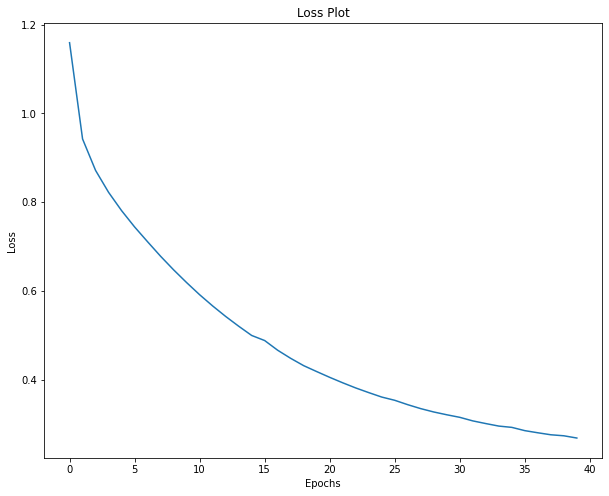

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Παρακάτω παρουσιάζουμε κάποιες ενδεικτικές επιτυχημένες προβλέψεις captioning του μοντέλου αυτού: 

<u>Εικόνα με id = 5174:</u>

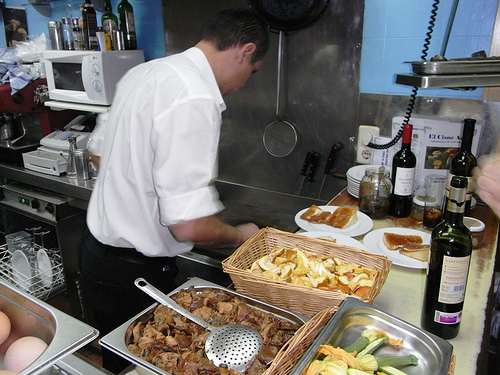

In [ ]:
Image.open(img_name_val[5174])

For image with id = 5174
Real Caption 0: <start> a man wearing black pants and a white shirt busily working in a restaurant kitchen with food and wine bottles on the counter to his right and dishes in the dishwasher to his left <end>
Real Caption 1: <start> a cook in a white shirt and black pants preparing food in a kitchen <end>
Real Caption 2: <start> a guy in a white shirt preparing food in a restaurant <end>
Real Caption 3: <start> in this picture we see a man cooking in a kitchen <end>
Real Caption 4: <start> a man in a white shirt is cooking a big meal <end>
Prediction Caption: a older man cooking food in a kitchen cooking food in a kitchen is cooking food in a kitchen <end>
blue score: 0.32921246066927334


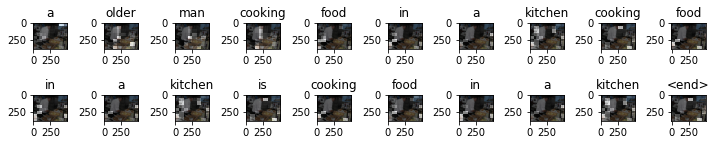

In [ ]:
show_validation(np.random.randint(0, len(img_name_val)))

<u>

<u>Εικόνα με id = 7057:</u>

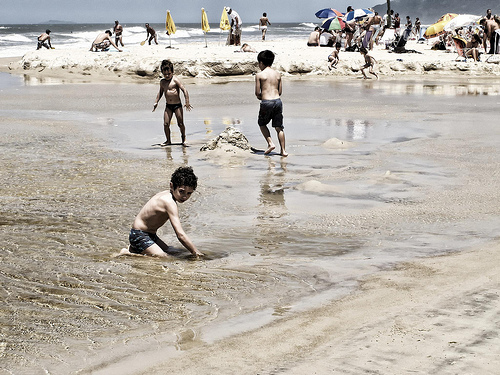

In [ ]:
Image.open(img_name_val[7057])

For image with id = 7057
Real Caption 0: <start> three small children are playing in the water at a beach full of people <end>
Real Caption 1: <start> three young boys are playing in the sand along the beach side <end>
Real Caption 2: <start> three children on the beach playing in the sand <end>
Real Caption 3: <start> young kids play in the shallow water of a beach <end>
Real Caption 4: <start> three little boys are playing at the beach <end>
Prediction Caption: children are running along the beach <end>
blue score: 0.3122293313750971


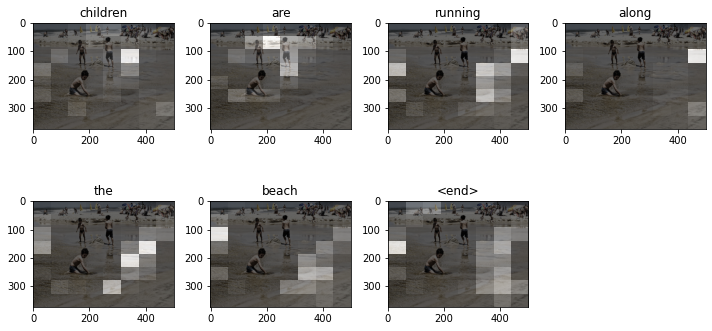

In [ ]:
show_validation(7057)

Έπειτα, υπολογίζουμε το bleu score που πετυχαίνει το μοντέλο μας, πάνω στο πρώτο ένα τέταρτο των δεδομένων του validation set.

In [ ]:
calculate_sentence_bleu(range(0, int(len(img_name_val)/4)), img_name_val)

0.11362401319684802

<u>Παρατήρηση</u>: 

Παρατηρούμε ότι τα παραπάνω captions που προβλέπονται από το μοντέλο είναι αρκετά σχετικά με το θέμα των εικόνων για τις οποίες προορίζονται. Ωστόσο, το πρώτο από αυτά, ενώ πειρέχει σχετικές λέξεις, δεν είναι ορθό γραμματικά και συντακτικά, σε αντίθεση με το δεύτερο το οποίο είναι ευσταθές τόσο νοηματικά όσο και συντακτικά. Το γεγονός αυτό ίσως οφείλεται και στο μικρότερο μήκος του caption αυτού.

Παρακάτω θα προσπαθήσουμε να βελτιώσουμε το μοντέλο αυτό, τροποποιώντας είτε τις τιμές των υπερπαραμέτρων που έχουν να κάνουν με την προεπεξεργασία των captions, είτε γενικότερα την αρχιτεκτονική του δικτύου. 

### Μελέτη της επίδρασης της προεπεξεργασίας των captions

Αρχικά, θα δοκιμάσουμε νσ τροποποιήσουμε το μέγεθος του  λεξιλογίου που κατασκευάζει ο tokenizer, προκειμένου τα captions να "έχουν περισσότερες από 5000 επιλογές" ως προς τις λέξεις που μπορούν περιέχουν και παράλληλα να φιλτράρουμε καλύτερα τα captions, που χρησιμοποιούμε για την εκπαίδευση του δικτύου, ως προς το μήκος τους. Για το σκοπό αυτό κατασκευάζουμε ένα ιστόγραμμα που απεικονίζει το πλήθος των captions που αντιστοιχούν στα συγκεκριμένα bins μηκών.

In [ ]:
def calculate_hist_for_lengths(df):
    maximum = 0 
    minimum = np.inf
    #bins : [2, 5), [5, 10), [10, 15), [15, 20), [20, 25), [25, 30), [30, 35), [35, 40)
    #       [40, 45), [45, 50), [50, 55), [55, 60), [60, 65), [65, 70), [70, 75) 
    n_bins = 15
    bins = [0] * n_bins
    for index, row in df.iterrows():
        l = len(str.lower(re.sub("[^A-Za-z']+", ' ', row[2])).split())
        if l > maximum: 
            maximum = l
        if l < minimum:
            minimum = l
        if l < 5:
            bins[0] += 1
        elif l < 10:
            bins[1] += 1
        elif l < 15:
            bins[2] += 1
        elif l < 20:
            bins[3] += 1
        elif l < 25:
            bins[4] += 1
        elif l < 30:
            bins[5] += 1
        elif l < 35:
            bins[6] += 1
        elif l < 40:
            bins[7] += 1
        elif l < 45:
            bins[8] += 1
        elif l < 50:
            bins[9] += 1
        elif l < 55:
            bins[10] += 1
        elif l < 60:
            bins[11] += 1
        elif l < 65:
            bins[12] += 1
        elif l < 70:
            bins[13] += 1
        else:
            bins[14] += 1
            
    return maximum, minimum, bins

In [ ]:
a, b, hist = calculate_hist_for_lengths(df)

Minimum length: 2
Maximum length: 73


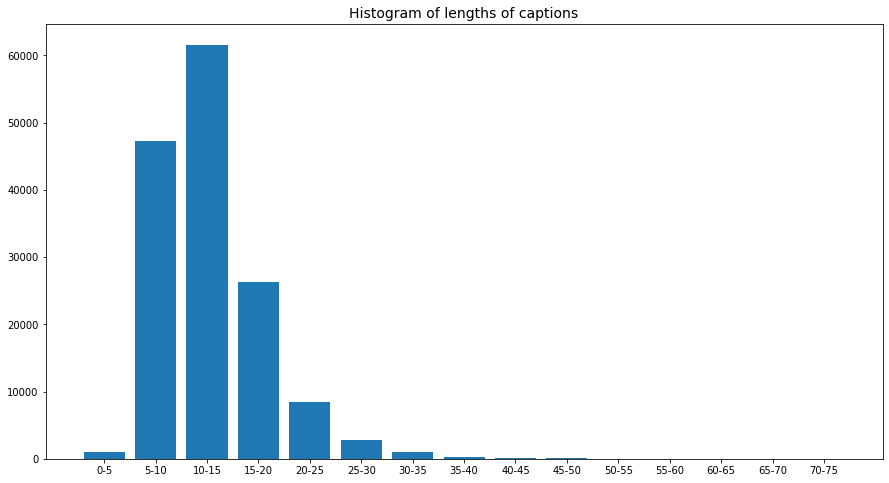

In [ ]:
from matplotlib import pyplot as plt

x = np.arange(15)
plt.figure(figsize = (15, 8))
plt.bar(x, height = hist,
        tick_label = ['0-5', '5-10', '10-15', '15-20', '20-25', '25-30', '30-35', '35-40', '40-45', 
                                       '45-50', '50-55', '55-60', '60-65', '65-70', '70-75'])
plt.title('Histogram of lengths of captions', fontsize = 14)

print('Minimum length:', b)
print('Maximum length:', a)

Παρατηρούμε, λοιπόν, ότι η μεγαλύτερη συγκέντρωση captions παρατηρείται στα μήκη από 5 μέχρι 25, με μήκος πάνω από 40 να έχουν ελάχιστα από τα συνολικ captions. Οπότε, και στη συνέχεια, δεδομένου ότι πολύ σύντομα αλλά αντιστοίχως και πολύ μεγάλα captions δεν είναι ιδαίτερα χρήσιμα για την εκπαίδευση δοκιμάζουμε να φιλτράρουμε τα captions που τελικά θα χρησιμοποιήσουμε, ως προς το μήκος τους στο διάστημα [min_length, max_length]. 

#### Δοκιμή 1: Χρήση max_length = 36, min_length = 3 και vocabulary_size = 10000

Στο τρέχον μοντέλο η αρχιτεκτονική παραμένει η ίδια (default archticture: CNN_Encoder : InceptionV3, RNN_Encoder : 512 GRU units). Εκπαιδεύουμε και πάλι το μοντέλο σε ένα υποσύνολο <b>10000 δεδομένων</b> του training set (πρόκειται για το ίδιο υποσύνολο δεδομένων με την προηγούμενη δοκιμή λόγω του random.seed που χρησιμοποιούμε, προκειμένου να έχουν όσο  δυνατόν πιο δίκαιη σύγκριση μεταξύ των μοντέλων) για <b>30 εποχές</b>. Τα αποτελέσματα της εκπαίδευσης παρουσιάζονται παρακάτω.  

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 36, min_length = 3, vocabulary_size = 10000, samples = 10000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 256, units = 512)

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(39890, 39890, 9964, 9964)

In [ ]:
EPOCHS = 30

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

Epoch 1 Batch 0 Loss 3.1736
Epoch 1 Batch 100 Loss 1.9401
Epoch 1 Batch 200 Loss 1.7410
Epoch 1 Batch 300 Loss 1.6828
Epoch 1 Batch 400 Loss 1.6151
Epoch 1 Batch 500 Loss 1.5502
Epoch 1 Batch 600 Loss 1.5332
Epoch 1 Loss 1.690768
Time taken for 1 epoch 162.09 sec

Epoch 2 Batch 0 Loss 1.3203
Epoch 2 Batch 100 Loss 1.3791
Epoch 2 Batch 200 Loss 1.4998
Epoch 2 Batch 300 Loss 1.4149
Epoch 2 Batch 400 Loss 1.3807
Epoch 2 Batch 500 Loss 1.2796
Epoch 2 Batch 600 Loss 1.1713
Epoch 2 Loss 1.352429
Time taken for 1 epoch 84.84 sec

Epoch 3 Batch 0 Loss 1.2626
Epoch 3 Batch 100 Loss 1.2156
Epoch 3 Batch 200 Loss 1.3439
Epoch 3 Batch 300 Loss 1.1530
Epoch 3 Batch 400 Loss 1.1960
Epoch 3 Batch 500 Loss 1.2082
Epoch 3 Batch 600 Loss 1.4462
Epoch 3 Loss 1.233753
Time taken for 1 epoch 84.77 sec

Epoch 4 Batch 0 Loss 1.1375
Epoch 4 Batch 100 Loss 1.3010
Epoch 4 Batch 200 Loss 1.1131
Epoch 4 Batch 300 Loss 1.1138
Epoch 4 Batch 400 Loss 1.1019
Epoch 4 Batch 500 Loss 1.1226
Epoch 4 Batch 600 Loss 1.1452

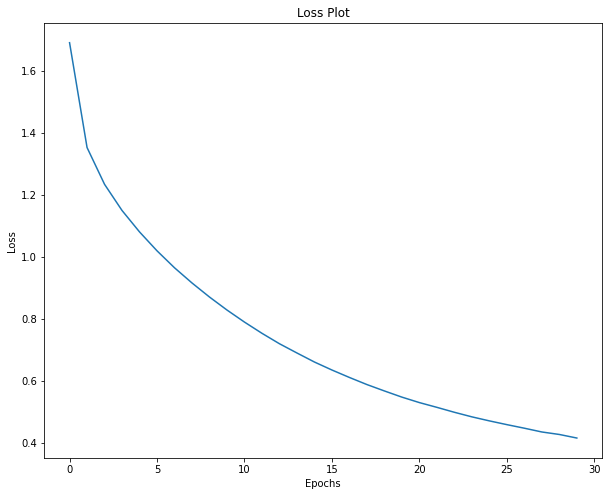

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Στη συνέχεια παρουσιάζουμε κάποια ενδεικτικά αποτελέσματα των προβλέψεων του μοντέλου αυτού.

<u>Εικόνα με id = 8546</u>:

For image with id = 8546
Real Caption 0: <start> a person in an orange helmet climbs up a sheer cliff face <end>
Real Caption 1: <start> a rock climber looks up while traversing a route <end>
Real Caption 2: <start> a man wearing a backpack is climbing a rock <end>
Real Caption 3: <start> a person climbing a large moss covered rock <end>
Real Caption 4: <start> this person is rock climbing <end>
Prediction Caption: a rock wall <end>
blue score: 0.13211778025311377


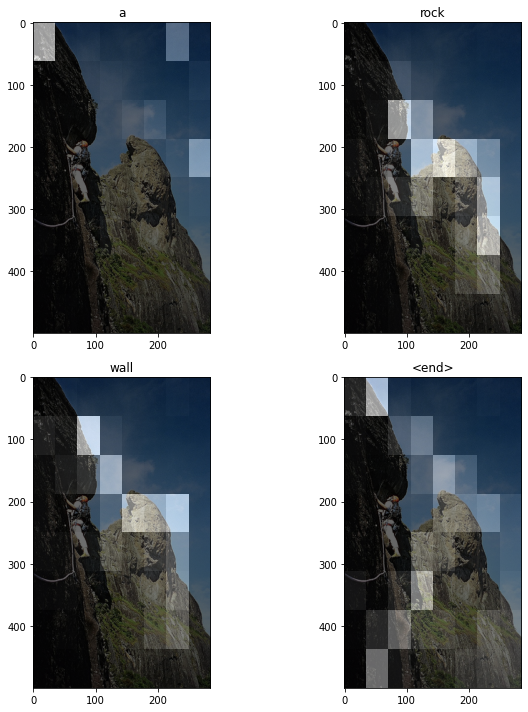

In [ ]:
show_validation(8546)

<u>Εικόνα με id = 7061</u>:

For image with id = 7061
Real Caption 0: <start> a young boy with a red short sleeved shirt and jeans runs by some trees <end>
Real Caption 1: <start> the little boy in the red shirt stops to smile for the camera <end>
Real Caption 2: <start> a boy wearing a red t shirt is running through woodland <end>
Real Caption 3: <start> a young boy is dancing around <end>
Real Caption 4: <start> a child runs near some trees <end>
Prediction Caption: a little boy chases a blanket <end>
blue score: 0.13997850207499035


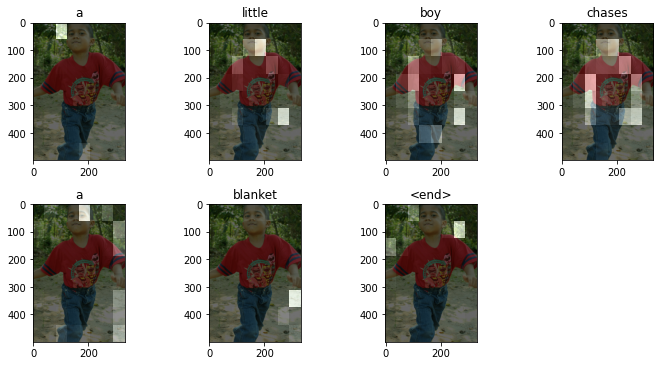

In [ ]:
show_validation(7061)

<u>Εικόνα με id = 769</u>:

For image with id = 769
Real Caption 0: <start> a male athlete is wearing a teal sweatband and a shirt from nike and is holding a tennis racket <end>
Real Caption 1: <start> a tennis player wearing a yellow white and blue shirt carrying a racquet <end>
Real Caption 2: <start> the tennis player is wearing a yellow and blue shirt and a blue headband <end>
Real Caption 3: <start> a tennis player is carrying a tennis racket <end>
Real Caption 4: <start> a man plays tennis <end>
Prediction Caption: a tennis player in a and white <end>
blue score: 0.30764903515228803


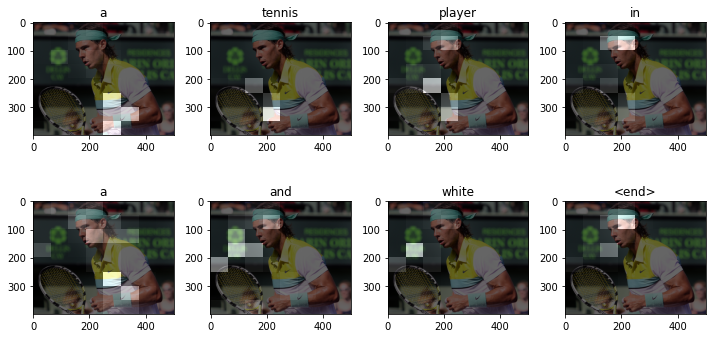

In [ ]:
show_validation(769)

<u>Εικόνα με id = 9694</u>:

For image with id = 9694
Real Caption 0: <start> a person pole vaulting at the beach in a jacket and khakis <end>
Real Caption 1: <start> a man in a jacket jumping around a stick pole on the beach <end>
Real Caption 2: <start> a person hoisted up on a wooden stick next to the beach <end>
Real Caption 3: <start> a man in a black jacket pole vaulting on the beach <end>
Real Caption 4: <start> a man jumping with a pole at the beach <end>
Prediction Caption: a guy jumping in the air on a beach <end>
blue score: 0.14345476919739036


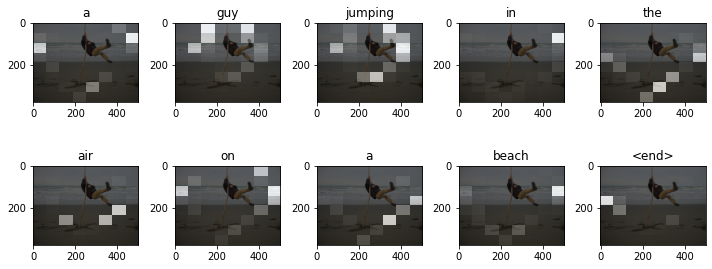

In [ ]:
show_validation(9694)

Τέλος, υπολογίζουμε και πάλι το bleu score που επιτυγχάνει το μοντέλο στο (ίδιο) πρώτο τέταρτο των δεδομένων του validation set. 

In [ ]:
calculate_sentence_bleu(range(0, int(len(img_name_val)/4)), img_name_val)

0.11367635051087854

#### Δοκιμή 2: Χρήση max_length = 30, min_length = 5 και vocabulary_size = 8000

Χρησιμοποιούμε και πάλι την ίδια αρχιτεκτονική και εκπαιδεύουμε το μοντέλο μας το υποσύνολο <b>10000 δειγμάτων</b> του training set για <b>30 εποχές</b>. Τα αποτελέσματα που προκύπτουν φαίνονται παρακάτω.

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 30, min_length = 5, vocabulary_size = 8000, samples = 10000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 256, units = 512)

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(39356, 39356, 9843, 9843)

In [ ]:
EPOCHS = 30

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 1 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

2022-03-07 17:05:01.782400: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Epoch 1 Batch 0 Loss 3.8320
Epoch 1 Batch 100 Loss 2.3538
Epoch 1 Batch 200 Loss 2.1431
Epoch 1 Batch 300 Loss 1.9244
Epoch 1 Batch 400 Loss 1.7852
Epoch 1 Batch 500 Loss 1.6382
Epoch 1 Batch 600 Loss 1.7638
Epoch 1 Loss 1.991098
Time taken for 1 epoch 218.73 sec

Epoch 2 Batch 0 Loss 1.8030
Epoch 2 Batch 100 Loss 1.7950
Epoch 2 Batch 200 Loss 1.6900
Epoch 2 Batch 300 Loss 1.6590
Epoch 2 Batch 400 Loss 1.3909
Epoch 2 Batch 500 Loss 1.5231
Epoch 2 Batch 600 Loss 1.5034
Epoch 2 Loss 1.590979
Time taken for 1 epoch 68.76 sec

Epoch 3 Batch 0 Loss 1.6017
Epoch 3 Batch 100 Loss 1.5941
Epoch 3 Batch 200 Loss 1.5642
Epoch 3 Batch 300 Loss 1.5117
Epoch 3 Batch 400 Loss 1.4798
Epoch 3 Batch 500 Loss 1.4580
Epoch 3 Batch 600 Loss 1.3928
Epoch 3 Loss 1.453580
Time taken for 1 epoch 68.88 sec

Epoch 4 Batch 0 Loss 1.4143
Epoch 4 Batch 100 Loss 1.3995
Epoch 4 Batch 200 Loss 1.3453
Epoch 4 Batch 300 Loss 1.3877
Epoch 4 Batch 400 Loss 1.5193
Epoch 4 Batch 500 Loss 1.4072
Epoch 4 Batch 600 Loss 1.2143

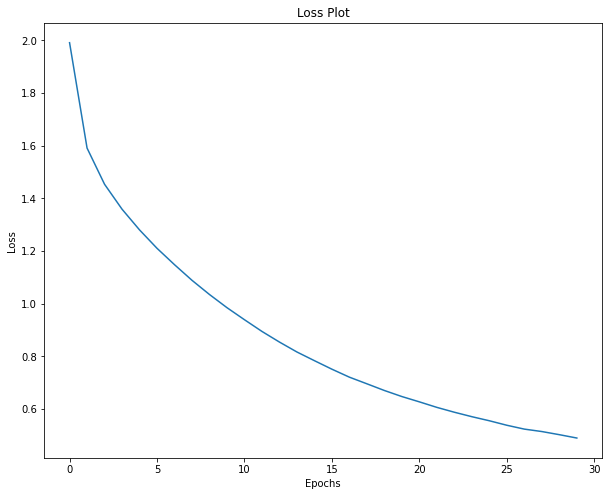

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Στη συνέχεια παρουσιάζουμε ενδεικτικά αποτελέσματα προβλέψεων του παραπάνω μοντέλου.

<u>Εικόνα με id = 9292</u>:

For image with id = 9292
Real Caption 0: <start> a motorcycle rider wearing black and silver does a wheelie on a sandy terrain <end>
Real Caption 1: <start> a man is riding his dirt bike through the air in the desert <end>
Real Caption 2: <start> a man does a jump in the desert on a motorcycle <end>
Real Caption 3: <start> a man is doing a motocross jump into the air <end>
Real Caption 4: <start> a dirt biker in the desert <end>
Prediction Caption: a man riding a bike <end>
blue score: 0.1504596501504379


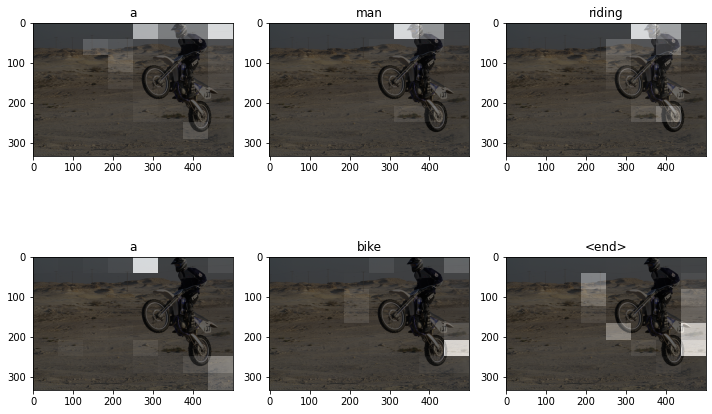

In [ ]:
show_validation(9292)

<u>Εικόνα με id = 3080</u>:

For image with id = 3080
Real Caption 0: <start> an old man with a white haired beard and a blue cap gives a thumbs up sign with his right hand <end>
Real Caption 1: <start> a man with a gray beard and denim hat gives a thumbs up sign with his hand <end>
Real Caption 2: <start> the elderly man wearing the white cap is holding his thumb up <end>
Real Caption 3: <start> a man with a denim hat and white beard gives a thumbs up <end>
Real Caption 4: <start> man with white beard and glasses gives a thumbs up <end>
Prediction Caption: a man with a beard and jacket glasses jacket is smoking <end>
blue score: 0.38283042488925806


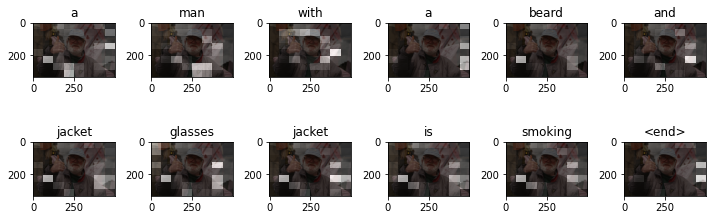

In [ ]:
show_validation(3080)

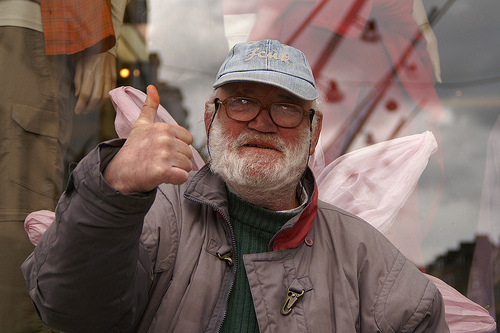

In [ ]:
Image.open(img_name_val[3080])

<u>Εικόνα με id = 1545</u>:

For image with id = 1545
Real Caption 0: <start> a brown dog in snow is biting at a piece of pink cloth <end>
Real Caption 1: <start> the brown dog is [UNK] at something in the snow <end>
Real Caption 2: <start> a dog in the snow [UNK] an object with its teeth <end>
Real Caption 3: <start> a brown dog bites a purple [UNK] in the snow <end>
Real Caption 4: <start> a dog on snow has something in its mouth <end>
Prediction Caption: the brown dog walks along the snowy ground <end>
blue score: 0.18790069335423482


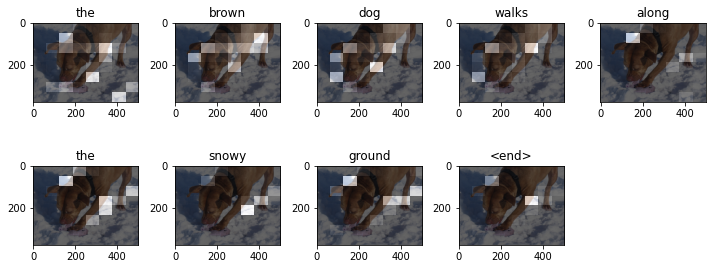

In [ ]:
show_validation(1545)

<u>Εικόνα με id = 8768</u>:

For image with id = 8768
Real Caption 0: <start> tourists look at merchandise on a street vendors display in england [UNK] through cards and [UNK] <end>
Real Caption 1: <start> several individuals look over different items on a english newspaper stand <end>
Real Caption 2: <start> tourists are shopping at a british gift stand <end>
Real Caption 3: <start> a busy outdoor kiosk to sell items <end>
Real Caption 4: <start> a stand sells souvenir items <end>
Prediction Caption: people are shopping at them <end>
blue score: 0.29490012483076405


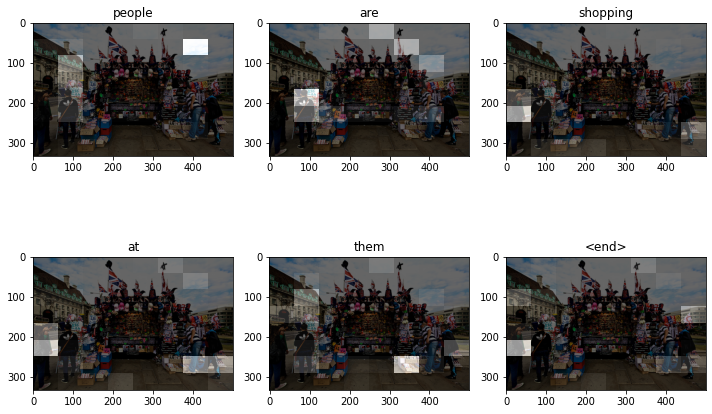

In [ ]:
show_validation(8768)

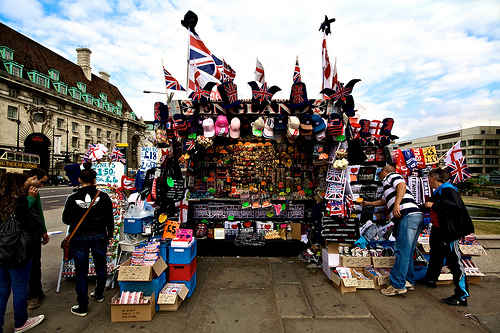

In [ ]:
Image.open(img_name_val[8768])

Τέλος, υπολογίζουμε το bleu score που επιτυγχάνει το μοντέλο πάνω στο πρώτο τέταρτο των δεδομένων του validation set.

In [ ]:
calculate_sentence_blue(range(0, int(len(img_name_val)/4)), img_name_val)

0.11035123633504683

#### Σύνοψη

Στον ακόλουθο πίνακα συνοψίζουμε τα αποτελέσματα που προέκυψαν από τις παραπάνω δοκιμές.

| max_length | min_length | vocab_size | len - train | len - val set |  epochs | time per epoch | final train loss | val bleu score | 
| ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- |
| 50 | 0 | 5000 | 39992 | 9996 | 40 | ~103 sec | 0.268297 (epoch 30: 0.320729) | 0.1136 |
| 36 | 3 | 10000 | 39890 | 9964 | 30 | ~84 sec | 0.415086 | 0.1137 |
| 30 | 5 | 8000 | 39356 | 9843 | 30 | ~ 69 sec | 0.489979 | 0.1103 |

<u>Παρατηρήσεις</u>:

- Παρατηρούμε, λοιπόν, ότι <b>το καλύτερο μοντέλο αντιστοιχεί σε max_length = 36, min_length = 3 και vocabulary_size = 10000</b>, καθώς εξασφαλίζει το καλύτερο δυνατό bleu score στο validation set, ενώ παράλληλα μειώνει το χρόνο που απαιτείται για την εκπαίδευση του μοντέλου συγκριτκά με το default μοντέλο, γεγονός που οφείλεται και στον περιορισμό των captions που απαρτίζουν το train set. 
- Παρατηρούμε ότι στην 30η εποχή το train loss του defalult μοντέλου είναι αρκετά χαμηλότερο σε σύγκριση με το αντίστοιχο loss για το μοντέλο της 2ης δοκιμής, παρότι όμως επιτυγχάνει ελάχιστα χαμηλότερο bleu score στο validation set. Το γεγονός αυτό οφείλεται πιθανόν στην εμφάνιση overfitting κατά την εκπαίδευση του default μοντέλου. 
- Σε κάθε περίπτωση πάντως παρατηρούμε ότι ακόμα και για προβλέψεις φαινομενικά επιτυχημένες, που περιέχουν λέξεις σχετικές με το θέμα ή τα χαρακτηριστικά της φωτογραφίας, συχνά και ιδίως σε αυτές με μεγαλύτερο μήκος δεν έχουμε συντακτική και γραμματική συνοχή. 

### Μελέτη της επίδρασης των embeddings

Στη συνέχεια, για τις βέλτιστες τιμές στις οποίες καταλήξαμε παραπάνω max_length = 36, min_length = 3 και vocabulary_size = 10000, δοκιμάζουμε αντί να αφήνουμε τα embeddings να μαθαίνονται κατά την εκπαίδευση του μοντέλου να χρησιμοποιήσουμε έτοιμα embeddings με μεταφορά μάθησης. Με τον τρόπο αυτό θα μειωθεί το πλήθος των βαρών προς εκπαίδευση, ενώ παράλληλα το δίκτυό θα αποκτήσει μεγαλύτετρη γνώση για τις λέξεις και τους συνδυασμούς αυτών προερχόμενη από αλλά tasks, η οποία μπορεί να βοηθήσει στην πρόβλεψη ορθότερων νοηματικά και συντακτικά captions. Για το σκοπό αυτό θα χρησιμοποιήσουμε τα embeddings glove-wiki του Gensim διαστάσεων 50, 100, 200 και 300.

Προκειμένου να χρησιμοποιήσουμε τα προεκπαιδευμένα embeddings, κατασκευάζουμε μέσω της συνάρτησης `CreateEmbeddingMatrix` τον πίνακα embedding_matrix, ο οποίος αντιστοιχίζει κάθε λέξη του λεξιλογίου, με index idx, που κατασκευάζει ο tokenizer, στο embedding διάνυσμα που την αναπαριστά, τοποθετώντας αυτό στην αντίστοιχη θέση idx του embeddding_matrix.

In [ ]:
def CreateEmbeddingMatrix(glove_embeddings, embedding_dim, vocabulary_size, index_to_word):
  num_tokens = vocabulary_size
  hits = 0
  misses = 0
  embedding_matrix = np.zeros((num_tokens, embedding_dim))

  for i in range(vocabulary_size):
      if tf.compat.as_text(index_to_word(i).numpy()) not in glove_embeddings:
          misses += 1
          continue
      else:
          w2v = glove_embeddings[tf.compat.as_text(index_to_word(i).numpy())]
          embedding_matrix[i] = w2v
          hits += 1
    
  print("Converted %d words (%d misses)" % (hits, misses))
  return embedding_matrix

Παράλληλα, τροποποιούμε την κλάση του RNN-Encoder όπως φαίνεται παρακάτω, έτσι ώστε να του δίνεται η δυνατότητα να χρησιμοποιεί το ζητούμενο κάθε φορά embedding layer (είτε να χρησιμοποιεί κάποιον ήδη υπολογισμένο embedding_matrix, είτε να το συμπεριλαμβάνει κανονικά στα προς εκπαίδευση βάρη του δικτύου).

In [ ]:
class RNN_Decoder(tf.keras.Model):
    def __init__(self, embedding_dim, units, vocab_size, embedding_flag = False, embedding_matrix = None):
        super(RNN_Decoder, self).__init__()
        self.units = units

        if embedding_flag:
          self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim,
                                                    embeddings_initializer=tf.keras.initializers.Constant(embedding_matrix), 
                                                    trainable = False)
        else:
          self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        
        self.gru = tf.keras.layers.GRU(self.units,
                                       return_sequences=True,
                                       return_state=True,
                                       recurrent_initializer='glorot_uniform')
        self.fc1 = tf.keras.layers.Dense(self.units)
        self.fc2 = tf.keras.layers.Dense(vocab_size)

        self.attention = BahdanauAttention(self.units)
        
 
    def call(self, x, features, hidden):
        context_vector, attention_weights = self.attention(features, hidden)

        x = self.embedding(x)
        x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

        output, state = self.gru(x)
        x = self.fc1(output)
        x = tf.reshape(x, (-1, x.shape[2]))
        x = self.fc2(x)

        return x, state, attention_weights
    
    def reset_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

#### Δοκιμή 1: Χρήση των glove-wiki-gigaword-50 embeddings του Gensim

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 36, min_length = 3, vocabulary_size = 10000, samples = 10000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 50, units = 512)

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(39890, 39890, 9964, 9964)

In [ ]:
import gensim.downloader

glove_embeddings = gensim.downloader.load("glove-wiki-gigaword-50")

[==================================================] 100.0% 66.0/66.0MB downloaded


In [ ]:
embedding_matrix = CreateEmbeddingMatrix(glove_embeddings, embedding_dim = 50, vocabulary_size = 10000, index_to_word)

Converted 9736 words (264 misses)


In [ ]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size(), embedding_flag = True, embedding_matrix = embedding_matrix)

Εκπαιδεύουμε και πάλι το μοντέλο σε ένα υποσύνολο <b>10000 δεδομένων</b> για <b>30 εποχές</b>, οπότε και έχουμε:

In [ ]:
EPOCHS = 30

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

2022-03-07 19:15:22.068787: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Epoch 1 Batch 0 Loss 3.1390
Epoch 1 Batch 100 Loss 1.9658
Epoch 1 Batch 200 Loss 1.8478
Epoch 1 Batch 300 Loss 1.6898
Epoch 1 Batch 400 Loss 1.6670
Epoch 1 Batch 500 Loss 1.4167
Epoch 1 Batch 600 Loss 1.3091
Epoch 1 Loss 1.685437
Time taken for 1 epoch 206.50 sec

Epoch 2 Batch 0 Loss 1.3641
Epoch 2 Batch 100 Loss 1.5387
Epoch 2 Batch 200 Loss 1.4304
Epoch 2 Batch 300 Loss 1.5143
Epoch 2 Batch 400 Loss 1.3666
Epoch 2 Batch 500 Loss 1.3040
Epoch 2 Batch 600 Loss 1.4003
Epoch 2 Loss 1.395621
Time taken for 1 epoch 73.01 sec

Epoch 3 Batch 0 Loss 1.4489
Epoch 3 Batch 100 Loss 1.3723
Epoch 3 Batch 200 Loss 1.3052
Epoch 3 Batch 300 Loss 1.3580
Epoch 3 Batch 400 Loss 1.1971
Epoch 3 Batch 500 Loss 1.1504
Epoch 3 Batch 600 Loss 1.2584
Epoch 3 Loss 1.293471
Time taken for 1 epoch 72.67 sec

Epoch 4 Batch 0 Loss 1.2198
Epoch 4 Batch 100 Loss 1.3252
Epoch 4 Batch 200 Loss 1.2522
Epoch 4 Batch 300 Loss 1.2084
Epoch 4 Batch 400 Loss 1.1778
Epoch 4 Batch 500 Loss 1.1517
Epoch 4 Batch 600 Loss 1.2212

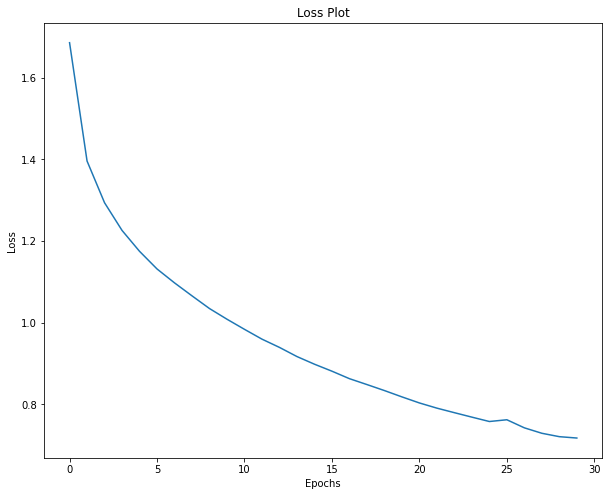

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Στη συνέχεια παραθέτουμε κάποια ενδεικτικά παραδείγματα προβλέψεων του μοντέλου αυτού.

<u>Εικόνα με id = 8580</u>:

For image with id = 8580
Real Caption 0: <start> a flight crew member is leaning out of the plane s cockpit window trying to clean the windshield <end>
Real Caption 1: <start> a pilot leans out the open window the cockpit to clean the window of his plane <end>
Real Caption 2: <start> a man washes the windscreen on a jet by hanging out of a side window <end>
Real Caption 3: <start> pilot dropping cloth while cleaning airplane windows <end>
Real Caption 4: <start> a pilot is cleaning a window of the airplane <end>
Prediction Caption: a man in a black shirt hanging in the train <end>
blue score: 0.10316821713567395


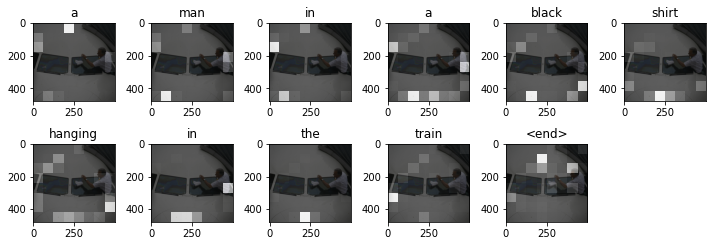

In [ ]:
show_validation(8580)

<u>Εικόνα με id = 8931</u>:

For image with id = 8931
Real Caption 0: <start> an all men volleyball game is full action with a tall man in shades is ready to block an oncoming volley <end>
Real Caption 1: <start> several young men are playing volleyball one is jumping <end>
Real Caption 2: <start> young men play beach volleyball in urban city <end>
Real Caption 3: <start> shirtless men are playing volleyball <end>
Real Caption 4: <start> a few men play volleyball <end>
Prediction Caption: three men playing beach volleyball <end>
blue score: 0.20344122469881


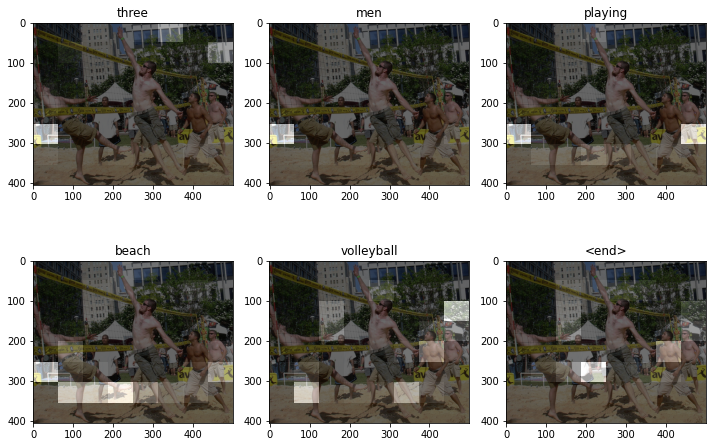

In [ ]:
show_validation(8931)

<u>Εικόνα με id = 1545</u>:

For image with id = 1545
Real Caption 0: <start> a brown dog in snow is biting at a piece of pink cloth <end>
Real Caption 1: <start> the brown dog is [UNK] at something in the snow <end>
Real Caption 2: <start> a dog in the snow [UNK] an object with its teeth <end>
Real Caption 3: <start> a brown dog bites a purple [UNK] in the snow <end>
Real Caption 4: <start> a dog on snow has something in its mouth <end>
Prediction Caption: the brown dog walks along the snowy ground <end>
blue score: 0.18790069335423482


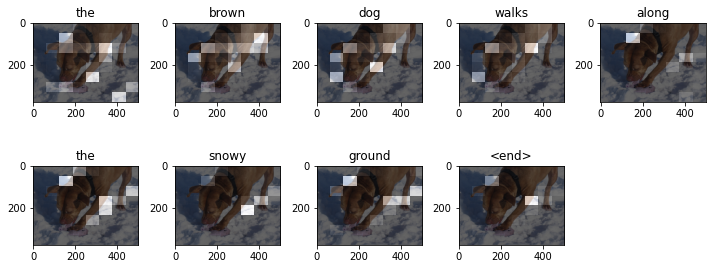

In [ ]:
show_validation(1545)

Τέλος, υπολογίζουμε το bleu score που επιτυγχάνει το μοντέλο πάνω στο πρώτο τέταρτο των δεδομένων του validation set.

In [ ]:
calculate_sentence_bleu(range(0, int(len(img_name_val)/4)), img_name_val)

0.09866811825699509

#### Δοκιμή 2: Χρήση των glove-wiki-gigaword-100 embeddings του Gensim

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 36, min_length = 3, vocabulary_size = 10000, samples = 10000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 100, units = 512)

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(39890, 39890, 9964, 9964)

In [ ]:
import gensim.downloader

glove_embeddings = gensim.downloader.load("glove-wiki-gigaword-100")

[==================================================] 100.0% 128.1/128.1MB downloaded


In [ ]:
embedding_matrix = CreateEmbeddingMatrix(glove_embeddings, embedding_dim = 100, vocabulary_size = 10000, index_to_word)

Converted 9736 words (264 misses)


In [ ]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size(), embedding_flag = True, embedding_matrix = embedding_matrix)

Εκπαιδεύουμε και πάλι το μοντέλο σε ένα υποσύνολο <b>10000 δεδομένων</b> για <b>30 εποχές</b>, οπότε και έχουμε:

In [ ]:
EPOCHS = 30

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 1 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

2022-03-08 00:57:47.116507: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Epoch 1 Batch 0 Loss 3.4504
Epoch 1 Batch 100 Loss 1.7805
Epoch 1 Batch 200 Loss 1.6863
Epoch 1 Batch 300 Loss 1.5377
Epoch 1 Batch 400 Loss 1.6417
Epoch 1 Batch 500 Loss 1.4515
Epoch 1 Batch 600 Loss 1.5681
Epoch 1 Loss 1.655515
Time taken for 1 epoch 227.85 sec

Epoch 2 Batch 0 Loss 1.4715
Epoch 2 Batch 100 Loss 1.3477
Epoch 2 Batch 200 Loss 1.3932
Epoch 2 Batch 300 Loss 1.3773
Epoch 2 Batch 400 Loss 1.2454
Epoch 2 Batch 500 Loss 1.3944
Epoch 2 Batch 600 Loss 1.3207
Epoch 2 Loss 1.356883
Time taken for 1 epoch 72.55 sec

Epoch 3 Batch 0 Loss 1.3648
Epoch 3 Batch 100 Loss 1.1952
Epoch 3 Batch 200 Loss 1.2977
Epoch 3 Batch 300 Loss 1.1215
Epoch 3 Batch 400 Loss 1.2194
Epoch 3 Batch 500 Loss 1.1953
Epoch 3 Batch 600 Loss 1.1972
Epoch 3 Loss 1.256176
Time taken for 1 epoch 71.61 sec

Epoch 4 Batch 0 Loss 1.3074
Epoch 4 Batch 100 Loss 1.1840
Epoch 4 Batch 200 Loss 1.2646
Epoch 4 Batch 300 Loss 1.2259
Epoch 4 Batch 400 Loss 1.0833
Epoch 4 Batch 500 Loss 1.1888
Epoch 4 Batch 600 Loss 1.0580

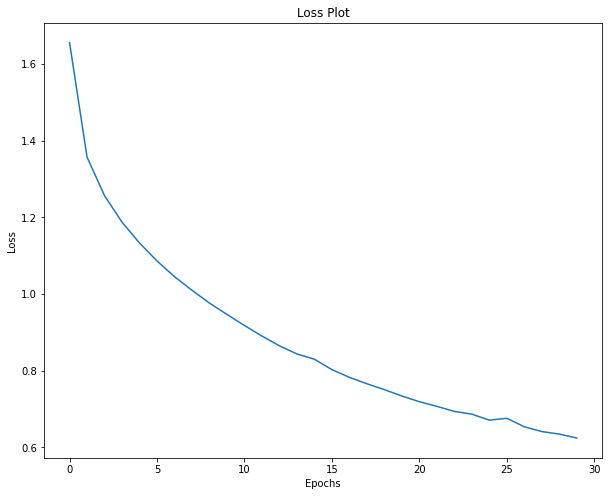

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Στη συνέχεια παραθέτουμε κάποια ενδεικτικά παραδείγματα προβλέψεων του μοντέλου αυτού.

<u>Εικόνα με id = 3648</u>:

For image with id = 3648
Real Caption 0: <start> a woman with brown hair is sitting with a little girl with short brown hair outside next to some red flowers <end>
Real Caption 1: <start> a woman and a young girl smiling for the camera in front of some flowers <end>
Real Caption 2: <start> a woman poses with a small girl on her lap in front of a flower bush <end>
Real Caption 3: <start> a woman and a young girl pose and smile for a photo <end>
Real Caption 4: <start> a woman and girl pose together in a garden <end>
Prediction Caption: a little girl dressed in pink laughing <end>
bleu score: 0.18481784942609136


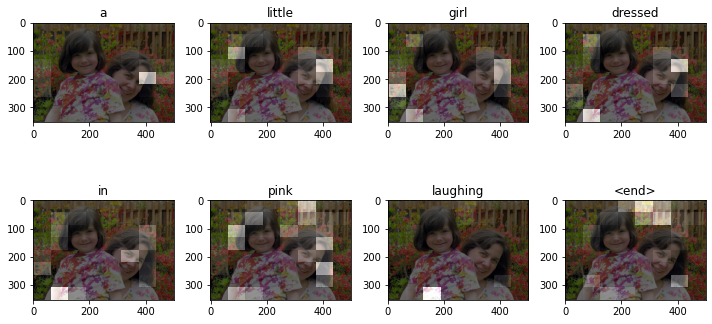

In [ ]:
show_validation(3648)

<u>Εικόνα με id = 5995</u>:

For image with id = 5995
Real Caption 0: <start> a woman in an orange dress walking across a stone bridge with a very blue sky behind her <end>
Real Caption 1: <start> woman in an orange skirt walking on concrete bridge <end>
Real Caption 2: <start> a woman in a dress is crossing a suspended bridge <end>
Real Caption 3: <start> a woman is carrying a child across a stone bridge <end>
Real Caption 4: <start> woman in a dress walking across a bridge <end>
Prediction Caption: a man on a large rock bridge <end>
bleu score: 0.1073301469441633


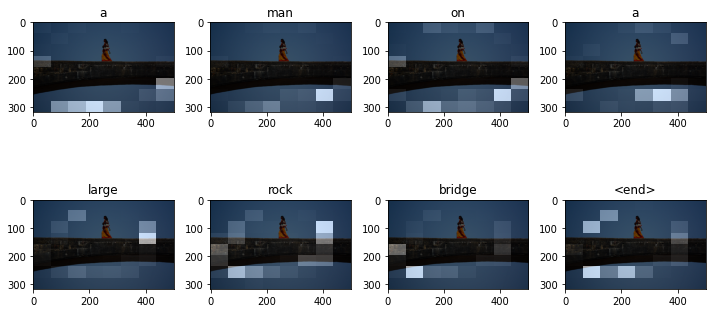

In [ ]:
show_validation(5995)

Τέλος, υπολογίζουμε το bleu score που επιτυγχάνει το μοντέλο πάνω στο πρώτο τέταρτο των δεδομένων του validation set.

In [ ]:
calculate_sentence_bleu(range(0, int(len(img_name_val)/4)), img_name_val)

0.10676015859117964

#### Δοκιμή 3: Χρήση των glove-wiki-gigaword-200 embeddings του Gensim

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 36, min_length = 3, vocabulary_size = 10000, samples = 10000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 200, units = 512)

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(39890, 39890, 9964, 9964)

In [ ]:
import gensim.downloader

glove_embeddings = gensim.downloader.load("glove-wiki-gigaword-200")

[==================================================] 100.0% 252.1/252.1MB downloaded


In [ ]:
embedding_matrix = CreateEmbeddingMatrix(glove_embeddings, embedding_dim = 200, vocabulary_size = 10000, index_to_word)

Converted 9736 words (264 misses)


In [ ]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size(), embedding_flag = True, embedding_matrix = embedding_matrix)

Εκπαιδεύουμε και πάλι το μοντέλο σε ένα υποσύνολο <b>10000 δεδομένων</b> για <b>30 εποχές</b>, οπότε και έχουμε:

In [ ]:
EPOCHS = 30

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

2022-03-08 14:00:24.520887: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Epoch 1 Batch 0 Loss 3.3623
Epoch 1 Batch 100 Loss 2.0484
Epoch 1 Batch 200 Loss 1.7166
Epoch 1 Batch 300 Loss 1.8035
Epoch 1 Batch 400 Loss 1.4009
Epoch 1 Batch 500 Loss 1.4683
Epoch 1 Batch 600 Loss 1.3794
Epoch 1 Loss 1.663881
Time taken for 1 epoch 235.27 sec

Epoch 2 Batch 0 Loss 1.5071
Epoch 2 Batch 100 Loss 1.6283
Epoch 2 Batch 200 Loss 1.3702
Epoch 2 Batch 300 Loss 1.3242
Epoch 2 Batch 400 Loss 1.4387
Epoch 2 Batch 500 Loss 1.1365
Epoch 2 Batch 600 Loss 1.3442
Epoch 2 Loss 1.346088
Time taken for 1 epoch 90.48 sec

Epoch 3 Batch 0 Loss 1.3903
Epoch 3 Batch 100 Loss 1.2906
Epoch 3 Batch 200 Loss 1.3932
Epoch 3 Batch 300 Loss 1.3231
Epoch 3 Batch 400 Loss 1.1818
Epoch 3 Batch 500 Loss 1.2017
Epoch 3 Batch 600 Loss 1.1801
Epoch 3 Loss 1.235714
Time taken for 1 epoch 90.60 sec

Epoch 4 Batch 0 Loss 1.1094
Epoch 4 Batch 100 Loss 1.1738
Epoch 4 Batch 200 Loss 1.1155
Epoch 4 Batch 300 Loss 1.2532
Epoch 4 Batch 400 Loss 1.1856
Epoch 4 Batch 500 Loss 1.1240
Epoch 4 Batch 600 Loss 1.1554

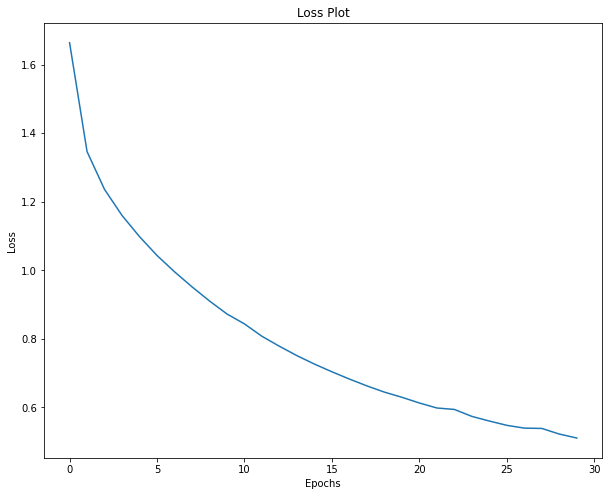

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Στη συνέχεια παραθέτουμε κάποια ενδεικτικά παραδείγματα προβλέψεων του μοντέλου αυτού.

<u>Εικόνα με id = 6340</u>:

For image with id = 6340
Real Caption 0: <start> a man wearing a white shirt with a black vest strums his orange guitar on the [UNK] stage <end>
Real Caption 1: <start> older gentlemen is playing guitar while wearing vans shoes <end>
Real Caption 2: <start> man with orange dyed hair playing an electric guitar <end>
Real Caption 3: <start> a man in a black and white dress is playing guitar <end>
Real Caption 4: <start> a man performing on a guitar <end>
Prediction Caption: man playing a white guitar video with a guitar on stage <end>
bleu score: 0.1862843824395212


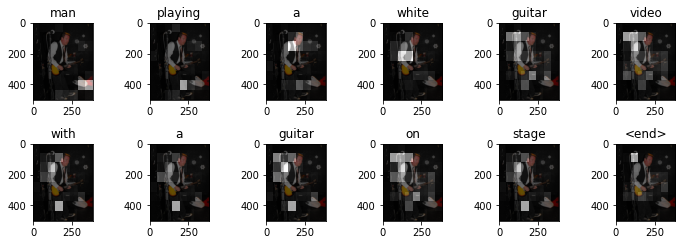

In [ ]:
show_validation(6340)

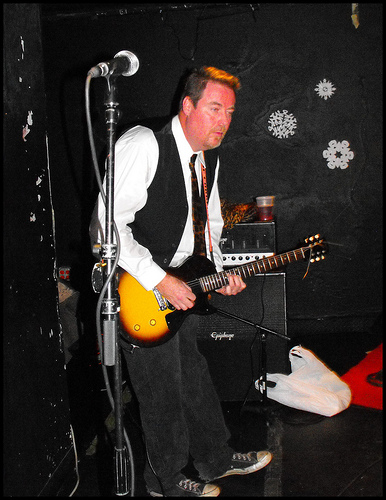

In [ ]:
Image.open(img_name_val[6340])

<u>Εικόνα με id = 7447</u>:

For image with id = 7447
Real Caption 0: <start> at what appears to be a rodeo a man tackles an animal to the ground while being watched by a dozen people <end>
Real Caption 1: <start> the horse and rider are both on the ground at the rodeo <end>
Real Caption 2: <start> a group of men with cowboy hats are watching a rodeo <end>
Real Caption 3: <start> a rodeo player is being taken down by a bull <end>
Real Caption 4: <start> a man is tying up cattle in a rodeo <end>
Prediction Caption: variety group of spectators watch a rodeo <end>
bleu score: 0.2087234718670828


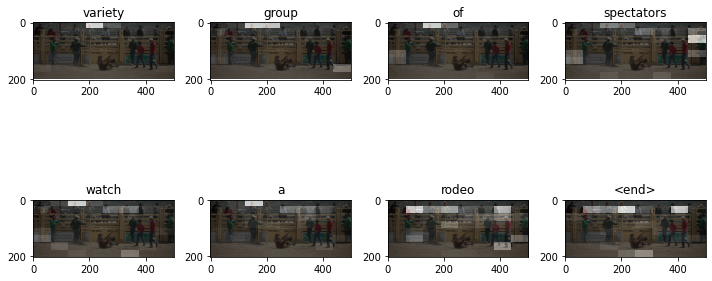

In [ ]:
show_validation(7447)

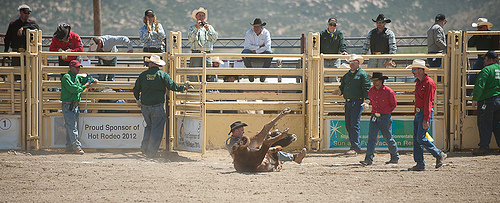

In [ ]:
Image.open(img_name_val[7447])

Τέλος, υπολογίζουμε το bleu score που επιτυγχάνει το μοντέλο πάνω στο πρώτο τέταρτο των δεδομένων του validation set.

In [ ]:
calculate_sentense_bleu(range(0, int(len(img_name_val)/4)), img_name_val)

0.09930096917303084

#### Δοκιμή 4: Χρήση των glove-wiki-gigaword-300 embeddings του Gensim

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 36, min_length = 3, vocabulary_size = 10000, samples = 10000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 300, units = 512)

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(39890, 39890, 9964, 9964)

In [ ]:
import gensim.downloader

glove_embeddings = gensim.downloader.load("glove-wiki-gigaword-300")

[===============================================---] 95.7% 360.0/376.1MB downloaded

In [ ]:
embedding_matrix = CreateEmbeddingMatrix(glove_embeddings, embedding_dim = 300, vocabulary_size = 10000, index_to_word)

Converted 9736 words (264 misses)


In [ ]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size(), embedding_flag = True, embedding_matrix = embedding_matrix)

Εκπαιδεύουμε και πάλι το μοντέλο σε ένα υποσύνολο <b>10000 δεδομένων</b> για <b>30 εποχές</b>, οπότε και έχουμε:

In [ ]:
EPOCHS = 30

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 1 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

2022-03-08 16:18:57.678061: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Epoch 1 Batch 0 Loss 3.3632
Epoch 1 Batch 100 Loss 1.8344
Epoch 1 Batch 200 Loss 1.5178
Epoch 1 Batch 300 Loss 1.3183
Epoch 1 Batch 400 Loss 1.3746
Epoch 1 Batch 500 Loss 1.5023
Epoch 1 Batch 600 Loss 1.4409
Epoch 1 Loss 1.616792
Time taken for 1 epoch 206.34 sec

Epoch 2 Batch 0 Loss 1.4572
Epoch 2 Batch 100 Loss 1.2822
Epoch 2 Batch 200 Loss 1.3489
Epoch 2 Batch 300 Loss 1.2867
Epoch 2 Batch 400 Loss 1.2317
Epoch 2 Batch 500 Loss 1.2932
Epoch 2 Batch 600 Loss 1.2050
Epoch 2 Loss 1.303908
Time taken for 1 epoch 86.92 sec

Epoch 3 Batch 0 Loss 1.2746
Epoch 3 Batch 100 Loss 1.2581
Epoch 3 Batch 200 Loss 1.2066
Epoch 3 Batch 300 Loss 1.2936
Epoch 3 Batch 400 Loss 1.1554
Epoch 3 Batch 500 Loss 1.1931
Epoch 3 Batch 600 Loss 1.0543
Epoch 3 Loss 1.195434
Time taken for 1 epoch 87.03 sec

Epoch 4 Batch 0 Loss 1.0739
Epoch 4 Batch 100 Loss 1.0358
Epoch 4 Batch 200 Loss 1.1118
Epoch 4 Batch 300 Loss 1.1621
Epoch 4 Batch 400 Loss 1.1377
Epoch 4 Batch 500 Loss 1.0699
Epoch 4 Batch 600 Loss 0.9655

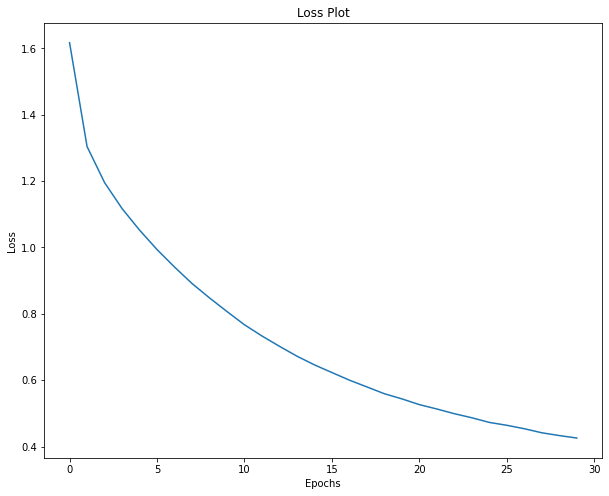

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Στη συνέχεια παραθέτουμε κάποια ενδεικτικά παραδείγματα προβλέψεων του μοντέλου αυτού.

<u>Εικόνα με id = 3648</u>:

For image with id = 3648
Real Caption 0: <start> a woman with brown hair is sitting with a little girl with short brown hair outside next to some red flowers <end>
Real Caption 1: <start> a woman and a young girl smiling for the camera in front of some flowers <end>
Real Caption 2: <start> a woman poses with a small girl on her lap in front of a flower bush <end>
Real Caption 3: <start> a woman and a young girl pose and smile for a photo <end>
Real Caption 4: <start> a woman and girl pose together in a garden <end>
Prediction Caption: a little girl in front of the camera <end>
bleu score: 0.35943915650422215


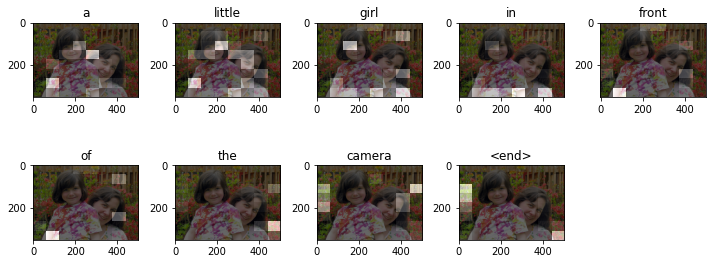

In [ ]:
show_validation(3648)

<u>Εικόνα με id = 4847</u>:

For image with id = 4847
Real Caption 0: <start> a young asian woman wearing tan boots a floral skirt and a black jacket is walking down the street holding a camera a brown purse a gray bag and pink scarf <end>
Real Caption 1: <start> a woman in a black jacket and tan boots is walking on the street in front of a group of people <end>
Real Caption 2: <start> man walking behind distracted looking woman carrying bags and camera <end>
Real Caption 3: <start> a woman with a very serious expression swiftly walks down a sidewalk <end>
Real Caption 4: <start> a asian model walking down the street <end>
Prediction Caption: people crossing the street <end>
bleu score: 0.19859310226283974


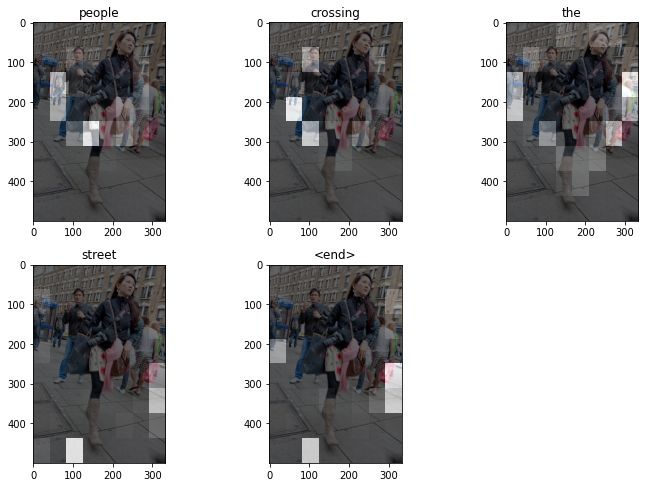

In [ ]:
show_validation(4847)

<u>Εικόνα με id = 236</u>:

For image with id = 236
Real Caption 0: <start> a steer throws off a rider while a rodeo clown rushes to his aid <end>
Real Caption 1: <start> a man falling off a bull as the animal jumps into the air <end>
Real Caption 2: <start> a man is kicked off a bull as a rodeo clown runs up <end>
Real Caption 3: <start> at a rodeo a rider gets thrown off the bull <end>
Real Caption 4: <start> a cowboy falling off a bull at a rodeo <end>
Prediction Caption: cowboys is coming over a bull <end>
bleu score: 0.10267864496962884


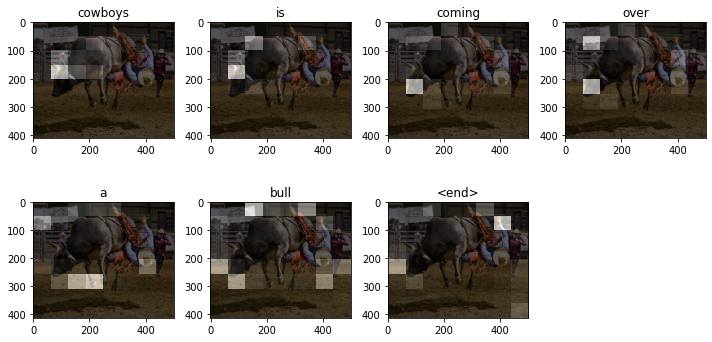

In [ ]:
show_validation(236)

Τέλος, υπολογίζουμε το bleu score που επιτυγχάνει το μοντέλο πάνω στο πρώτο τέταρτο των δεδομένων του validation set.

In [ ]:
calculate_sentense_bleu(range(0, int(len(img_name_val)/4)), img_name_val)

0.11165085955505566

#### Σύνοψη

Στον ακόλουθο πίνακα συνοψίζουμε τα αποτελέσματα που προέκυψαν από τις παραπάνω δοκιμές.

| embedding_dim | epochs | time per epoch | final train loss | val bleu score | 
| ----------- | ----------- | ----------- | ----------- | ----------- | 
| 50 | 30 | ~73 sec | 0.717277 | 0.0987 |
| 100 | 30 | ~71 sec | 0.623981 | 0.1067 |
| 200 | 30 | ~88 sec | 0.510406 | 0.0993 |
| 300 | 30 | ~87 sec | 0.425707 | 0.1165 | 

<u>Παρατηρήσεις</u>:
- Παρατηρούμε, ότι <b>το καλύτερο μοντέλο αντιστοιχεί στη χρήση των wiki-gigaword-300 embeddings</b>, που παρότι απαιτεί σχετικά μεγάλο χρόνο εκπαίδευσης συγκριτικά τουλάχιστον με τη χρήση wiki-gigaword-50 και wiki-gigaword-100 embeddings, καταφέρνει να μειώσει αρκετά το train loss, ενώ ταυτόχρονα επιτυγχάνει και το μεγαλύτερο bleu score (με αρκετή διαφορά) στο validation set.
- Παράλληλα, παρατηρούμε ότι συγκριτκά με τα μοντέλα χωρίς χρήση προεκπαιδευμένων embeddings, οι επισημειώσεις που προβλέπονται για τις εικόνες παρουσιάζουν μεγαλύτερη συντακτική και γραμματική συνοχή. Σε αυτό συμβάλλει και το γεγονός ότι σε αρκετές περιπτώσεις οι επισημειώσεις που προβλέπονται έχουν μικρότερο μήκος, οπότε και μπορούν ευκολότερα να διατηρήσουν τη νοηματική συνοχή τους. 

### Μελέτη της επίδρασης της αρχιτεκτονικής

Στη συνέχεια κρατάμε σταθερές τις υπερπαραμέτρους προεπεξεργασίας των captions σε max_length = 36, min_length = 3 και vocabulary_size = 10000, και δοκιμάζουμε να τροποποιήσουμε την αρχιτεκτονική του δικτύου που χρησιμοποιούμε, προκειμένου να μελετήσουμε την επίδραση πυο έχουν να διάφορα μέρη αυτής στην πρόβλεψη των captions.

#### Δοκιμή 1: architecture: CNN-Encoder : InceptionV3 - RNN-Decoder : 512 LSTM Cells

Αρχικά, θα δοκιμάσουμε να αντικαταστήσουμε τα GRU cells από τα οποία αποτελείται ο τρέχων decoder, από LSTM cells. Για το λόγο αυτό τροποποιούμε τον κώδικα υλοποίησης της κλάσης του RNN-Encoder προκειμένου να έχουμε τη δυνατότητα επιλογής του είδους του cell (LSTM ή GRU) που θα χρησιμοποιηθεί σε αυτόν. (<i>Σχόλιο</i>: Σύμφωνα με την τιμή της παραμέτρου lstm_flag επιλέγουμε μεταξύ tf.keras.layers.GRU και tf.keras.layers.LSTM. Στη δεύτερη περίπτωση το LSTM επιστρέφει ως τιμές τις εξής: output, hidden_state, cell_state, οπότε και στη forward αυτού επιστρέφουμε τα outputs και το hidden_state το οποίο θα χρησιμοποιηθεί ως είσοδος στο επόμενο cell).

In [ ]:
class RNN_Decoder(tf.keras.Model):
    def __init__(self, embedding_dim, units, vocab_size, embedding_flag = False, embedding_matrix = None, lstm_flag = False):
        super(RNN_Decoder, self).__init__()
        self.units = units
        self.lstm_flag = lstm_flag

        if embedding_flag:
          self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim,
                                                    embeddings_initializer=tf.keras.initializers.Constant(embedding_matrix), 
                                                    trainable = False)
        else:
          self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        
        if lstm_flag:
          self.gru_lstm = tf.keras.layers.LSTM(self.units, return_sequences=True, return_state=True, recurrent_initializer='glorot_uniform')
        else:
          self.gru_lstm = tf.keras.layers.GRU(self.units, return_sequences=True, return_state=True, recurrent_initializer='glorot_uniform')
        
        self.fc1 = tf.keras.layers.Dense(self.units)
        self.fc2 = tf.keras.layers.Dense(vocab_size)

        self.attention = BahdanauAttention(self.units)
        
 
    def call(self, x, features, hidden):
        context_vector, attention_weights = self.attention(features, hidden)

        x = self.embedding(x)
        x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

        if self.lstm_flag:
          output, state, _ = self.gru_lstm(x)
        else:
          output,state = self.gru_lstm(x)
        
        x = self.fc1(output)
        x = tf.reshape(x, (-1, x.shape[2]))
        x = self.fc2(x)

        return x, state, attention_weights
    
    def reset_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

Εκπαιδεύουμε το μοντέλο αυτό, που αποτελείται από LSTM cells, στο υποσύνολο των <b>10000 δεδομένων</b> του training set, για <b>30 εποχές</b>, οπότε προκύπτουν τα ακόλουθα αποτελέσματα. 

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 36, min_length = 3, vocabulary_size = 10000, samples = 10000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 50, units = 512, features_shape = 2048, attention_features_shape = 100))

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(39890, 39890, 9964, 9964)

In [ ]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size(), lstm_flag = True)

In [ ]:
EPOCHS = 30

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 1 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

2022-03-09 10:38:54.512057: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Epoch 1 Batch 0 Loss 3.4172
Epoch 1 Batch 100 Loss 2.0345
Epoch 1 Batch 200 Loss 1.7555
Epoch 1 Batch 300 Loss 1.6723
Epoch 1 Batch 400 Loss 1.3624
Epoch 1 Batch 500 Loss 1.4985
Epoch 1 Batch 600 Loss 1.4971
Epoch 1 Loss 1.704471
Time taken for 1 epoch 215.56 sec

Epoch 2 Batch 0 Loss 1.5260
Epoch 2 Batch 100 Loss 1.3799
Epoch 2 Batch 200 Loss 1.3559
Epoch 2 Batch 300 Loss 1.2176
Epoch 2 Batch 400 Loss 1.1403
Epoch 2 Batch 500 Loss 1.3517
Epoch 2 Batch 600 Loss 1.1537
Epoch 2 Loss 1.351651
Time taken for 1 epoch 86.52 sec

Epoch 3 Batch 0 Loss 1.3781
Epoch 3 Batch 100 Loss 1.2620
Epoch 3 Batch 200 Loss 1.2674
Epoch 3 Batch 300 Loss 1.1755
Epoch 3 Batch 400 Loss 1.1774
Epoch 3 Batch 500 Loss 1.2667
Epoch 3 Batch 600 Loss 1.1360
Epoch 3 Loss 1.232706
Time taken for 1 epoch 86.99 sec

Epoch 4 Batch 0 Loss 1.1922
Epoch 4 Batch 100 Loss 1.1317
Epoch 4 Batch 200 Loss 1.2819
Epoch 4 Batch 300 Loss 1.1075
Epoch 4 Batch 400 Loss 1.2032
Epoch 4 Batch 500 Loss 1.1571
Epoch 4 Batch 600 Loss 1.1409

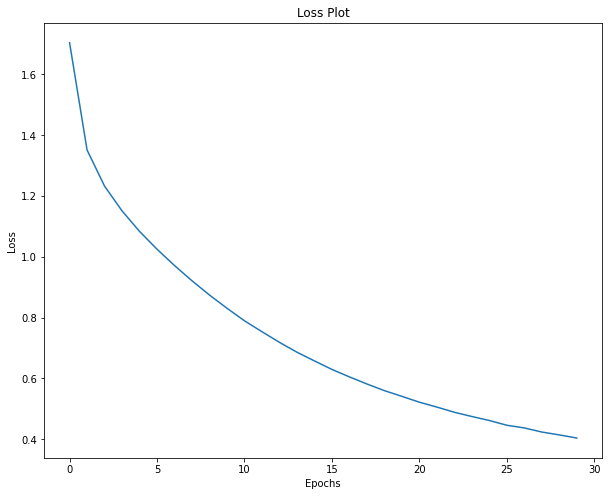

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Στη συνέχεια, παρουσιάζουμε κάποια ενδεικτικά παραδείγματα προβλέψεων του μοντέλου αυτού.

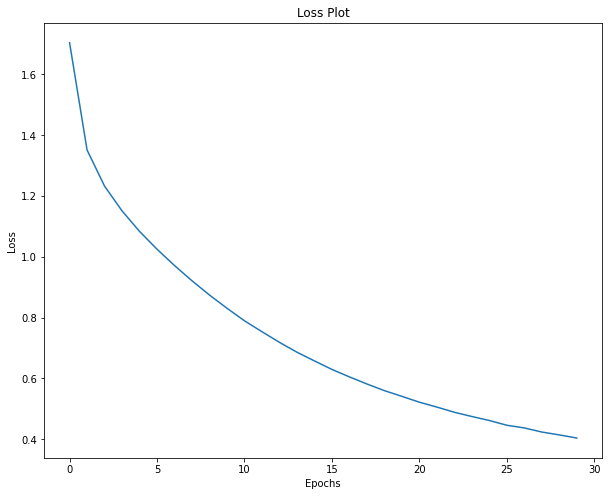

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

<u>Εικόνα με id = 6186</u>:

For image with id = 6186
Real Caption 0: <start> a basketball player in blue is attempting to block a player in white during a game <end>
Real Caption 1: <start> two men from opposite teams play basketball together <end>
Real Caption 2: <start> two black men playing basketball in a gym <end>
Real Caption 3: <start> two basketball players play in a game <end>
Real Caption 4: <start> the men are playing basketball <end>
Prediction Caption: two men playing around the court <end>
bleu score: 0.19879818238263727


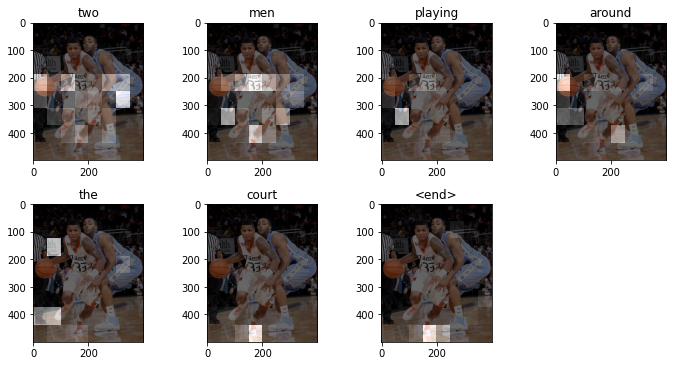

In [ ]:
show_validation(6186)

<u>Εικόνα με id = 1687</u>:

For image with id = 1687
Real Caption 0: <start> a man on stage holds a hello kitty guitar and looks to the right of the picture <end>
Real Caption 1: <start> a long haired man stands at a microphone playing a pink hello kitty guitar <end>
Real Caption 2: <start> a guitarist playing an electric guitar with hello kitty on the front <end>
Real Caption 3: <start> a musician plays a hello kitty electric guitar <end>
Real Caption 4: <start> a man is about to play his guitar <end>
Prediction Caption: a man playing an electric guitar <end>
bleu score: 0.4847788572433261


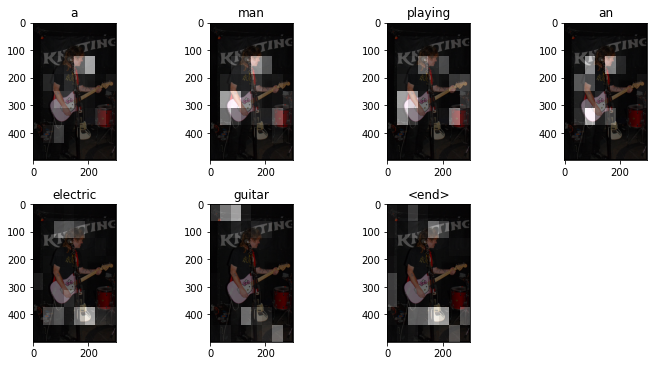

In [ ]:
show_validation(1687)

Τέλος, υπολογίζουμε το bleu score που επιτυγχάνει το μοντέλο στο πρώτο τέταρτο των δεδομένων του validation set.

In [ ]:
calculate_sentence_bleu(range(int(len(img_name_val)/4)), img_name_val)

0.11712328809272184

#### Δοκιμή 2: architecture: CNN-Encoder: InceptionV3 - RNN-Decoder: 512 Bidirectional GRU Cells

Στην περίπτωση αυτή θα δοκιμάσουμε να χρησιμοποιήσουμε Bidirectional GRU cells.Για το λόγο αυτό τροποποιούμε τον κώδικα υλοποίησης της κλάσης του RNN-Encoder προκειμένου να έχουμε τη δυνατότητα επιλογής bidirectional υλοποίησης (στην περίπτωση bidirectional υλοποίησης θεωρούμε ως state το concatenation του forward και backward state).

In [ ]:
class RNN_Decoder(tf.keras.Model):
    def __init__(self, embedding_dim, units, vocab_size, embedding_flag = False, embedding_matrix = None, lstm_flag = False, bidirectional = False):
        super(RNN_Decoder, self).__init__()
        self.units = units
        self.lstm_flag = lstm_flag
        self.bidirectional = bidirectional

        if embedding_flag:
          self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim,
                                                    embeddings_initializer=tf.keras.initializers.Constant(embedding_matrix), 
                                                    trainable = False)
        else:
          self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        
        if lstm_flag:
          if bidirectional:
            self.gru_lstm = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(self.units, return_sequences=True, return_state=True, recurrent_initializer='glorot_uniform'))
          else:
            self.gru_lstm = tf.keras.layers.LSTM(self.units, return_sequences=True, return_state=True, recurrent_initializer='glorot_uniform')
        else:
          if bidirectional:
            self.gru_lstm = tf.keras.layers.Bidirectional(tf.keras.layers.GRU(self.units, return_sequences=True, return_state=True, recurrent_initializer='glorot_uniform'))
          else:
            self.gru_lstm = tf.keras.layers.GRU(self.units, return_sequences=True, return_state=True, recurrent_initializer='glorot_uniform')
        
        self.fc1 = tf.keras.layers.Dense(self.units)
        self.fc2 = tf.keras.layers.Dense(vocab_size)

        self.attention = BahdanauAttention(self.units)
        
 
    def call(self, x, features, hidden):
        context_vector, attention_weights = self.attention(features, hidden)

        x = self.embedding(x)
        x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

        if self.lstm_flag:
          if self.bidirectional:
            output, state_f, _, state_b = self.gru_lstm(x)
            state = tf.concat([state_f, state_b], axis = 1)
          else:
            output, state, _ = self.gru_lstm(x)
        else:
          if self.bidirectional:
            output, state_f, state_b = self.gru_lstm(x)
            state = tf.concat([state_f, state_b], axis = 1)
          else:
            output, state = self.gru_lstm(x)
        
        x = self.fc1(output)
        x = tf.reshape(x, (-1, x.shape[2]))
        x = self.fc2(x)

        return x, state, attention_weights
    
    def reset_state(self, batch_size):
        if self.bidirectional:
          return tf.zeros((batch_size, 2 * self.units))
        else:
          return tf.zeros((batch_size, self.units))

Εκπαιδεύουμε το νέο αυτό μοντέλο, με την bidirectional αρχιτεκτονική στον decoder, στο υποσύνολο <b>10000 δεδομένων</b> του training set για <b>30 εποχές</b> και λαμβάνουμε τα αποτελέσματα που φαίνονται παρακάτω.

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 36, min_length = 3, vocabulary_size = 10000, samples = 10000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 50, units = 512, features_shape = 2048, attention_features_shape = 100))

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(39890, 39890, 9964, 9964)

In [ ]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size(), bidirectional = True)

In [ ]:
EPOCHS = 30

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 1 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

2022-03-09 00:20:36.640028: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Epoch 1 Batch 0 Loss 3.4860
Epoch 1 Batch 100 Loss 1.9364
Epoch 1 Batch 200 Loss 1.6811
Epoch 1 Batch 300 Loss 1.5133
Epoch 1 Batch 400 Loss 1.4164
Epoch 1 Batch 500 Loss 1.4125
Epoch 1 Batch 600 Loss 1.3885
Epoch 1 Loss 1.567904
Time taken for 1 epoch 269.19 sec

Epoch 2 Batch 0 Loss 1.5174
Epoch 2 Batch 100 Loss 1.3577
Epoch 2 Batch 200 Loss 1.2633
Epoch 2 Batch 300 Loss 1.2431
Epoch 2 Batch 400 Loss 1.1953
Epoch 2 Batch 500 Loss 1.1323
Epoch 2 Batch 600 Loss 1.2932
Epoch 2 Loss 1.289851
Time taken for 1 epoch 112.64 sec

Epoch 3 Batch 0 Loss 1.3248
Epoch 3 Batch 100 Loss 1.1702
Epoch 3 Batch 200 Loss 1.1371
Epoch 3 Batch 300 Loss 1.1512
Epoch 3 Batch 400 Loss 1.2167
Epoch 3 Batch 500 Loss 1.2268
Epoch 3 Batch 600 Loss 1.1982
Epoch 3 Loss 1.182524
Time taken for 1 epoch 113.61 sec

Epoch 4 Batch 0 Loss 1.1389
Epoch 4 Batch 100 Loss 1.1762
Epoch 4 Batch 200 Loss 1.0140
Epoch 4 Batch 300 Loss 0.9675
Epoch 4 Batch 400 Loss 1.2050
Epoch 4 Batch 500 Loss 1.1406
Epoch 4 Batch 600 Loss 0.96

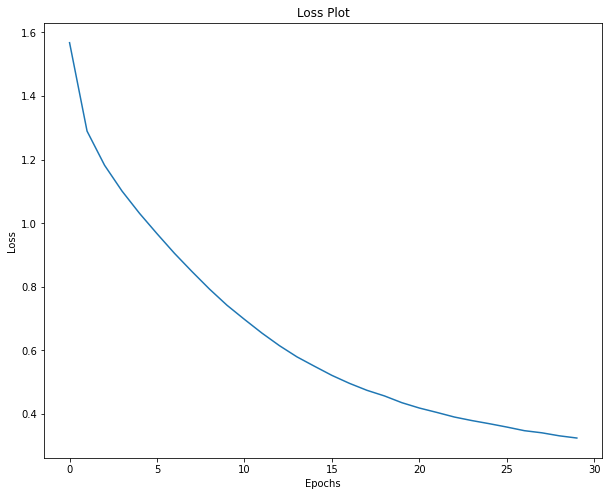

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Στη συνέχεια παραθέτουμε κάποια ενδεικτικά παραδείγματα προβλέψεων του μοντέλου αυτού.

<u>Εικόνα με id = 6646</u>:

For image with id = 6646
Real Caption 0: <start> a man pushing a food cart stands in front of a stone building and holds onto the bars covering a window <end>
Real Caption 1: <start> latino man hanging out a window cover trying to sell ice cream out of a street cart <end>
Real Caption 2: <start> man selling ice cream takes a break underneath a window <end>
Real Caption 3: <start> man with ice cream cart standing against a wall <end>
Real Caption 4: <start> a man in baggy clothing sells goods outdoors <end>
Prediction Caption: a man is standing in the dirt <end>
bleu score: 0.11545007579261411


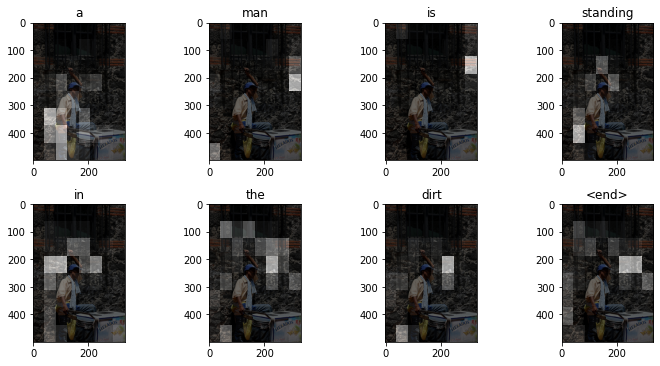

In [ ]:
show_validation(6646)

<u>Εικόνα με id = 4871</u>:

For image with id = 4871
Real Caption 0: <start> two beach volleyball players walk and talk together on the sand <end>
Real Caption 1: <start> two women wearing bikinis are walking on the sand <end>
Real Caption 2: <start> two women in bathing suits walks across the sand <end>
Real Caption 3: <start> two women stand in the sand in their bikinis <end>
Real Caption 4: <start> two women wearing bikinis on a sandy beach <end>
Prediction Caption: a group of women are all at the beach <end>
bleu score: 0.1147783417227578


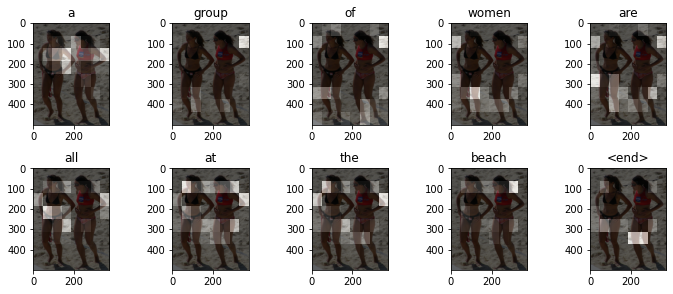

In [ ]:
show_validation(4871)

Τέλος, υπολογίζουμε το bleu score που επιτυγχάνει το μοντέλο στο πρώτο τέταρτο των δεδομένων του validation set.

In [ ]:
calculate_sentence_bleu(range(0, int(len(img_name_val)/4)), img_name_val)

0.11253682259432152

#### Δοκιμή 3: archtecture: CNN-Encoder: Xception - RNN-Decoder: 512 GRU Cells

Στην περίπτωση αυτή θα δοκιμάσουμε να χρησιμοποιήσουμε στη θέση του προεκπαιδευμένου συνελικτικού δικτύου InceptionV3, το προεκπαιδευμένο συνελτικτικό δίκτυο Xception (επιλέγουμε το μοντέλο αυτό καθώς 94 mod 4 = 2). Για να χρησιμοποιήσουμε το μοντέλο αυτό θα πρέπει να προεπεξεργαστούμε τις εικόνες μας κατάλληλα, όπως προσδιορίζουν οι απαιτήσεις του μοντέλου αυτού. Για το σκοπό αυτό τροποποιούμε τη συνάρτηση load, όπως φαίνεται ακολούθως. 

In [ ]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.keras.layers.Resizing(299, 299)(img)
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path

Στη συνέχεια, φορτώνουμε το μοντέλο Xception εκπαιδευμένο και πάλι πάνω στο Imagenet, κατά αντιστοιχία με τον τρόπο που φορτώσαμε το μοντέλο InceptionV3, όπως φαίνεται παρακάτω.

In [ ]:
image_model = tf.keras.applications.Xception(include_top = False, weights = 'imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

2022-03-06 23:02:46.010927: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-06 23:02:46.182342: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-06 23:02:46.183443: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-06 23:02:46.185788: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

83697664/83683744 [==============================] - 3s 0us/step


Στην περίπτωση αυτή απαιτείται να δημιουργούμε εκ νέου τα χαρακτηριστικά των εικόνων όπως αυτά εξάγονται για την εκάστοτε εικόνα μέσω του δικτύου Xception, οπότε και δημιουργούμε τα αντίστοιχα .npy αρχεία. Προκειμένου, να μην κατασκευάζουμε εξαρχής τα αρχεία αυτά κάθε φορά που θέλουμε να χρησιμοποιήσουμε αυτό το συνελικτικό δίκτυο, αφού δημιουργήσουμε τα αρχεία τα φορτώνουμε και πάλι ως dataset στο kaggle notebook με όνομα create-xception-data-n-lab3 έτσι ώστε να τα έχουμε άμεσα διαθέσιμα (στην πραγματικότητα το dataset αυτό περιέχει αρχεία χαρακτηριστικών για 25000 εικόνες, καθώς κατά τη δημιουργία των .npy αρχείων ο διαθέσιμος χώρος στο working space - 20MB δεν επαρκούσε για την αποθήκευση περισσότερων εξ' αυτών). Με τον τρόπο αυτό, κάθε φορά που θέλουμε να χρησιμοποιήσουμε το Xception συνελιτκικό δίκτυο, αντί του InceptionV3, αρκεί να τροποποιούμε τη συνάρηση `map_func` (που αντιστοιχίζει τα .jpg αρχεία των εικόνων στα αντίστοιχα αρχεία χαρακτηριστικών τους .npy) ως εξής:

In [ ]:
def map_func(img_name, cap):
    img_tensor = np.load('../input/create-xception-data-nn-lab3/image_dir/' + img_name.decode('utf-8').split('/')[-1]+'.npy')
    return img_tensor, cap

Παράλληλα, η έξοδος του τελευταίου layer του δικτύου Xception έχει διαστάσεις 100 x 2048 (σε αντίθεση με το InceptionV3 που είχε διαστάσεις 64 x 100), οπότε για τη χρήση του δικτύου αυτού, κατά τη δημιουργία του train dataset αλλάζουμε την τιμή της παραμέτρου attention_features_shape σε 100. Ακολούθως, δοκιμάζουμε να εκπαδεύσουμε το μοντέλο αυτό που χρησιμοποιεί ως encoder το δίκτυο Xception (με την υπόλοιπη αρχιτεκτονική να παραμένει ίδια) στο υποσύνολο <b>10000 δεδομένων</b> του train datatset για <b>30 εποχές</b>, με τα αποτελέσματα που προκύπτουν παρουσιάζονται παρακάτω. 

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 36, min_length = 3, vocabulary_size = 10000, samples = 10000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 50, units = 512, features_shape = 2048, attention_features_shape = 100))

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(39890, 39890, 9964, 9964)

In [ ]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size())

In [ ]:
EPOCHS = 30

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 1 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

2022-03-09 10:36:35.305940: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Epoch 1 Batch 0 Loss 3.0396
Epoch 1 Batch 100 Loss 2.1747
Epoch 1 Batch 200 Loss 1.5651
Epoch 1 Batch 300 Loss 1.4874
Epoch 1 Batch 400 Loss 1.4739
Epoch 1 Batch 500 Loss 1.5056
Epoch 1 Batch 600 Loss 1.3896
Epoch 1 Loss 1.650570
Time taken for 1 epoch 245.11 sec

Epoch 2 Batch 0 Loss 1.2833
Epoch 2 Batch 100 Loss 1.4611
Epoch 2 Batch 200 Loss 1.3913
Epoch 2 Batch 300 Loss 1.3535
Epoch 2 Batch 400 Loss 1.4485
Epoch 2 Batch 500 Loss 1.1052
Epoch 2 Batch 600 Loss 1.1887
Epoch 2 Loss 1.321678
Time taken for 1 epoch 98.06 sec

Epoch 3 Batch 0 Loss 1.2420
Epoch 3 Batch 100 Loss 1.2897
Epoch 3 Batch 200 Loss 1.1383
Epoch 3 Batch 300 Loss 1.1332
Epoch 3 Batch 400 Loss 1.1466
Epoch 3 Batch 500 Loss 1.1683
Epoch 3 Batch 600 Loss 1.2458
Epoch 3 Loss 1.203346
Time taken for 1 epoch 97.81 sec

Epoch 4 Batch 0 Loss 1.1433
Epoch 4 Batch 100 Loss 1.1470
Epoch 4 Batch 200 Loss 1.1010
Epoch 4 Batch 300 Loss 1.1181
Epoch 4 Batch 400 Loss 1.1846
Epoch 4 Batch 500 Loss 1.0503
Epoch 4 Batch 600 Loss 1.2013

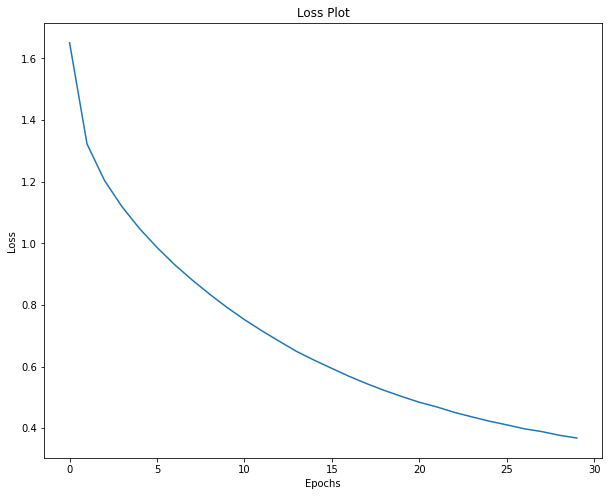

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Στη συνέχεια παραθέτουμε κάποια ενδεικτικά παραδείγματα προβλέψεων του μοντέλου αυτού.

<u>Εικόνα με id = 9084</u>:

For image with id = 9084
Real Caption 0: <start> a neatly lined group of military men has weapons held to their chest <end>
Real Caption 1: <start> a group of men are standing in lines with their guns on their side <end>
Real Caption 2: <start> here is a picture of an army standing in one row and on an island <end>
Real Caption 3: <start> soldiers lined up outside near palm trees with guns raised <end>
Real Caption 4: <start> military men standing in a line <end>
Prediction Caption: a group of soldiers dressed in formation <end>
bleu score: 0.2892523137172855


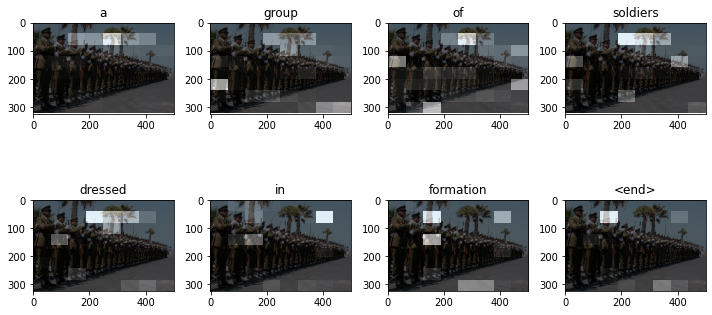

In [ ]:
show_validation(9084)

<u>Εικόνα με id = 8165</u>:

For image with id = 8165
Real Caption 0: <start> a man prepares food at an outdoor event before a table spread with multiple fresh vegetables <end>
Real Caption 1: <start> a man with a white shirt and blue pants cooking a healthy meal with vegetables <end>
Real Caption 2: <start> a man is preparing fancy shaped vegetables at a presentation booth outside <end>
Real Caption 3: <start> a man slicing vegetables outside of a warehouse setting <end>
Real Caption 4: <start> man slicing vegetables with a mandolin <end>
Prediction Caption: a man selling fruit <end>
bleu score: 0.11079969454019564


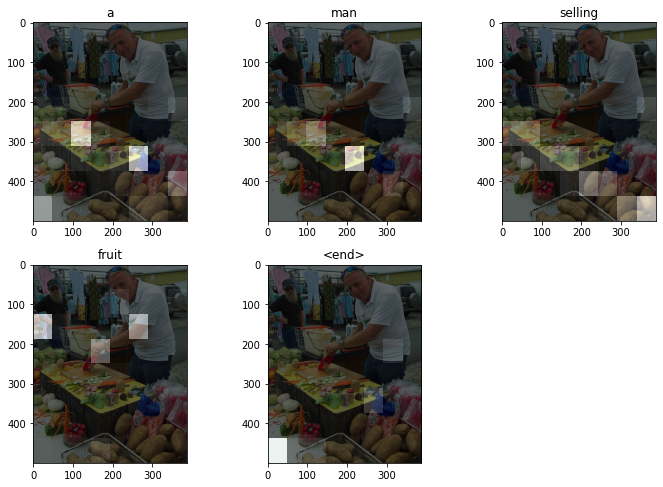

In [ ]:
show_validation(8165)

Τέλος, υπολογίζουμε το bleu score που επιτυγχάνει το μοντέλο στο πρώτο τέταρτο των δεδομένων του validation set.

In [ ]:
calculate_sentense_blue(range(0, int(len(img_name_val)/4)), img_name_val)

0.11514842564240818

#### Δοκιμή 4: Προσθήκη Dropout σε CNN-Encoder και RNN_Decoder 

Στην περίπτωση αυτή δοκιμάζουμε να προσθέσουμε στην default αρχιτεκτονική δύο επίπεδα dropout, ένα στον CNN-Encoder μετά το fully-connected dense layer, και ένα στον RNN-Decoder μεταξύ των δύο fully-connected dense layers αυτού. Προκειμένου να έχουμε τη δυνατότητα να επιλέγουμε ή όχι εάν θα χρησιμοποιήσουμε dropout, τροποποιούμε τους κώδικες που υλοποιούν τις κλάσεις του CNN_Encoder και RNN_Decoder, όπως φαίνεται παρακάτω. 

In [ ]:
class CNN_Encoder(tf.keras.Model):
    def __init__(self, embedding_dim, dropout_flag = False):
        super(CNN_Encoder, self).__init__()
        self.dropout_flag = dropout_flag
        self.fc = tf.keras.layers.Dense(embedding_dim)
        self.dropout = tf.keras.layers.Dropout(0.05)

    def call(self, x):
        x = self.fc(x)
        if self.dropout_flag:
          x = self.dropout(x)

        x = tf.nn.relu(x)
        return x

In [ ]:
class RNN_Decoder(tf.keras.Model):
    def __init__(self, embedding_dim, units, vocab_size, embedding_flag = False, embedding_matrix = None, lstm_flag = False, bidirectional = False, dropout_flag = False):
        super(RNN_Decoder, self).__init__()
        self.dropout_flag = dropout_flag
        self.units = units
        self.lstm_flag = lstm_flag
        self.bidirectional = bidirectional

        if embedding_flag:
          self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim,
                                                    embeddings_initializer=tf.keras.initializers.Constant(embedding_matrix), 
                                                    trainable = False)
        else:
          self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        
        if lstm_flag:
          if bidirectional:
            self.gru_lstm = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(self.units, return_sequences=True, return_state=True, recurrent_initializer='glorot_uniform'))
          else:
            self.gru_lstm = tf.keras.layers.LSTM(self.units, return_sequences=True, return_state=True, recurrent_initializer='glorot_uniform')
        else:
          if bidirectional:
            self.gru_lstm = tf.keras.layers.Bidirectional(tf.keras.layers.GRU(self.units, return_sequences=True, return_state=True, recurrent_initializer='glorot_uniform'))
          else:
            self.gru_lstm = tf.keras.layers.GRU(self.units, return_sequences=True, return_state=True, recurrent_initializer='glorot_uniform')
        
        self.fc1 = tf.keras.layers.Dense(self.units)
        self.fc2 = tf.keras.layers.Dense(vocab_size)

        self.attention = BahdanauAttention(self.units)
        self.dropout = tf.keras.layers.Dropout(0.1)
 
    def call(self, x, features, hidden):
        context_vector, attention_weights = self.attention(features, hidden)

        x = self.embedding(x)
        x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

        if self.lstm_flag:
          if self.bidirectional:
            output, state_f, _, state_b = self.gru_lstm(x)
            state = tf.concat([state_f, state_b], axis = 1)
          else:
            output, state, _ = self.gru_lstm(x)
        else:
          if self.bidirectional:
            output, state_f, state_b = self.gru_lstm(x)
            state = tf.concat([state_f, state_b], axis = 1)
          else:
            output, state = self.gru_lstm(x)
        
        x = self.fc1(output)
        if self.dropout_flag:
          x = self.dropout(x)
        x = tf.reshape(x, (-1, x.shape[2]))
        x = self.fc2(x)

        return x, state, attention_weights
    
    def reset_state(self, batch_size):
        if self.bidirectional:
          return tf.zeros((batch_size, 2 * self.units))
        else:
          return tf.zeros((batch_size, self.units))

Εκπαιδεύουμε το μοντέλο αυτό στο υποσύνολο <b>10000 δεδομένων</b> του training set για <b>30 εποχές</b>, οπότε έχουμε:

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 36, min_length = 3, vocabulary_size = 10000, samples = 10000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 50, units = 512, features_shape = 2048, attention_features_shape = 100))

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(39890, 39890, 9964, 9964)

In [ ]:
encoder = CNN_Encoder(embedding_dim, dropout_flag = True)
decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size(), dropout_flag = True)

In [ ]:
EPOCHS = 30

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 1 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

2022-03-09 02:46:51.868951: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Epoch 1 Batch 0 Loss 3.5031
Epoch 1 Batch 100 Loss 1.9644
Epoch 1 Batch 200 Loss 1.5621
Epoch 1 Batch 300 Loss 1.5778
Epoch 1 Batch 400 Loss 1.4256
Epoch 1 Batch 500 Loss 1.5838
Epoch 1 Batch 600 Loss 1.3790
Epoch 1 Loss 1.648206
Time taken for 1 epoch 206.51 sec

Epoch 2 Batch 0 Loss 1.5810
Epoch 2 Batch 100 Loss 1.5215
Epoch 2 Batch 200 Loss 1.4359
Epoch 2 Batch 300 Loss 1.4559
Epoch 2 Batch 400 Loss 1.3133
Epoch 2 Batch 500 Loss 1.1752
Epoch 2 Batch 600 Loss 1.2581
Epoch 2 Loss 1.327956
Time taken for 1 epoch 85.43 sec

Epoch 3 Batch 0 Loss 1.1966
Epoch 3 Batch 100 Loss 1.1922
Epoch 3 Batch 200 Loss 1.3083
Epoch 3 Batch 300 Loss 1.2077
Epoch 3 Batch 400 Loss 1.1319
Epoch 3 Batch 500 Loss 1.2410
Epoch 3 Batch 600 Loss 1.1844
Epoch 3 Loss 1.217939
Time taken for 1 epoch 86.01 sec

Epoch 4 Batch 0 Loss 1.1894
Epoch 4 Batch 100 Loss 1.1547
Epoch 4 Batch 200 Loss 1.2413
Epoch 4 Batch 300 Loss 1.1388
Epoch 4 Batch 400 Loss 1.0309
Epoch 4 Batch 500 Loss 1.2219
Epoch 4 Batch 600 Loss 1.1726

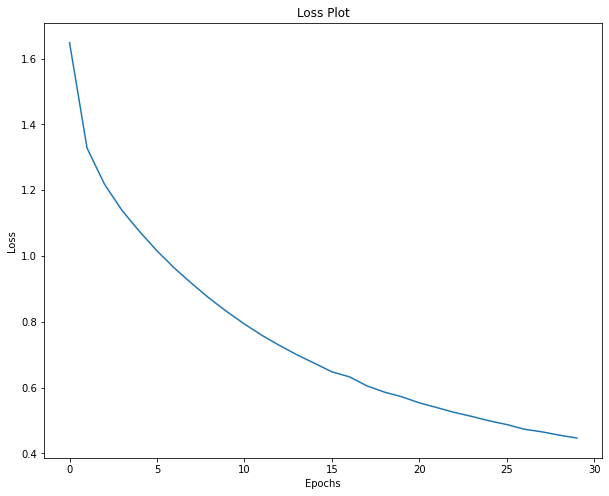

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Στη συνέχεια παρουσιάζουμε ενδεικτικά παραδείγματα προβλέψεων του μοντέλου.

<u>Εικόνα με id = 1923</u>:

For image with id = 1923
Real Caption 0: <start> two men dressed in black capes and carrying duffel bags pass a group of young women on the street <end>
Real Caption 1: <start> two black men in black coats walk down the street with women looking at them <end>
Real Caption 2: <start> two men wearing [UNK] walking down the street carrying luggage <end>
Real Caption 3: <start> two men are walking on a street past a group of young women <end>
Real Caption 4: <start> two men in dark raincoats walk past some women <end>
Prediction Caption: some people walking down the sidewalk <end>
bleu score: 0.17792793315714084


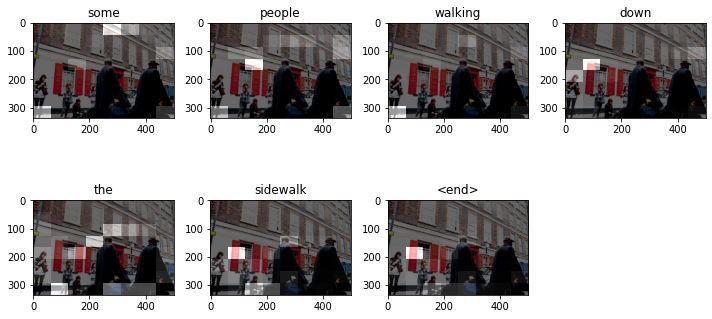

In [ ]:
show_validation(1923)

<u>Εικόνα με id = 7570</u>:

For image with id = 7570
Real Caption 0: <start> a man with a red fleece jacket is snowboarding while he casts a dark shadow on snow covered ground <end>
Real Caption 1: <start> a snowboarder is grinding on a rail in a snowy mountainous area <end>
Real Caption 2: <start> a snowboarder is sliding along balanced on a yellow beam <end>
Real Caption 3: <start> a snowboarder in red and black grinds a yellow rail <end>
Real Caption 4: <start> a snowboarder is grinding on a rail <end>
Prediction Caption: a man is going up a hill <end>
bleu score: 0.12162098997721381


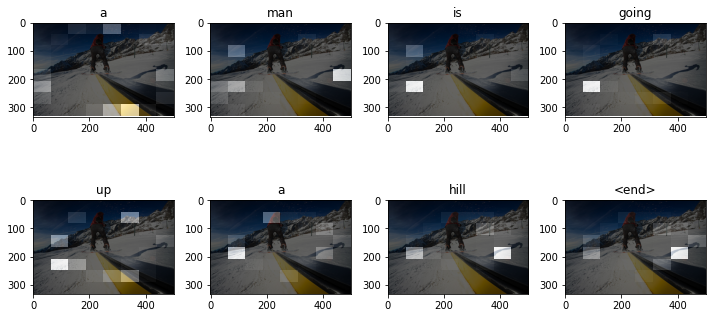

In [ ]:
show_validation(7570)

Τέλος, υπολογίζουμε το bleu score που επιτυγχάνει το μοντέλο στο πρώτο τέταρτο των δεδομένων του validation set.

In [ ]:
calculate_sentence_bleu(range(0, int(len(img_name_val)/4)), img_name_val)

0.10408579033350865

#### Δοκιμή 5: architecture: CNN-Encoder: InceptionV3 - RNN-Decoder: 256 GRU Cells

Στη συγκεκριμένη περίπτωση δοκιμάζουμε και πάλι να τοποθετήσουμε στη default αρχιτεκτονική 256 GRU Cells στη θέση των 512 GRU Cells που αυτή περιείχε. Εκπαιδεύουμε το μοντέλο που ακολουθεί την αρχιτεκτονινική αυτή στο υποσύνολο <b>10000 δεδομένων</b> του training set για <b>30 εποχές</b>, οπότε και προκύπτουν τα ακόλουθα αποτελέσματα.

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 36, min_length = 3, vocabulary_size = 10000, samples = 10000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 50, units = 256, features_shape = 2048, attention_features_shape = 100))

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(39890, 39890, 9964, 9964)

In [ ]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size())

In [ ]:
EPOCHS = 30

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 1 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

2022-03-09 12:43:46.781086: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Epoch 1 Batch 0 Loss 3.3191
Epoch 1 Batch 100 Loss 2.2032
Epoch 1 Batch 200 Loss 1.9726
Epoch 1 Batch 300 Loss 1.9220
Epoch 1 Batch 400 Loss 1.5560
Epoch 1 Batch 500 Loss 1.6656
Epoch 1 Batch 600 Loss 1.4778
Epoch 1 Loss 1.807679
Time taken for 1 epoch 233.01 sec

Epoch 2 Batch 0 Loss 1.6278
Epoch 2 Batch 100 Loss 1.5530
Epoch 2 Batch 200 Loss 1.4147
Epoch 2 Batch 300 Loss 1.2772
Epoch 2 Batch 400 Loss 1.3145
Epoch 2 Batch 500 Loss 1.3233
Epoch 2 Batch 600 Loss 1.4750
Epoch 2 Loss 1.439825
Time taken for 1 epoch 95.27 sec

Epoch 3 Batch 0 Loss 1.3972
Epoch 3 Batch 100 Loss 1.3184
Epoch 3 Batch 200 Loss 1.5292
Epoch 3 Batch 300 Loss 1.2967
Epoch 3 Batch 400 Loss 1.1944
Epoch 3 Batch 500 Loss 1.3671
Epoch 3 Batch 600 Loss 1.1835
Epoch 3 Loss 1.310650
Time taken for 1 epoch 95.16 sec

Epoch 4 Batch 0 Loss 1.1561
Epoch 4 Batch 100 Loss 1.3608
Epoch 4 Batch 200 Loss 1.1420
Epoch 4 Batch 300 Loss 1.1046
Epoch 4 Batch 400 Loss 1.1821
Epoch 4 Batch 500 Loss 1.1487
Epoch 4 Batch 600 Loss 1.3053

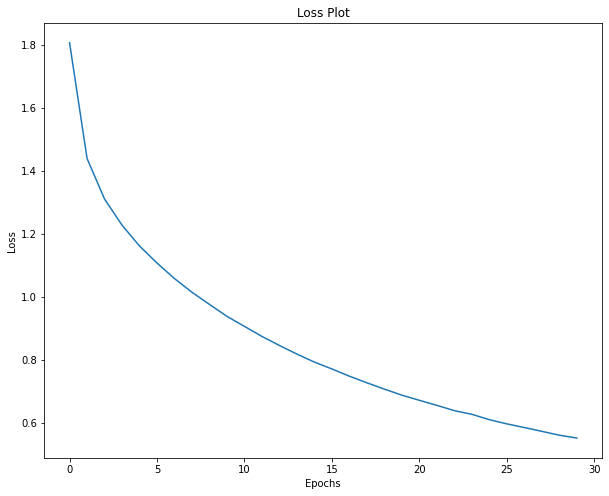

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Στη συνέχεια παρουσιάζουμε κάποια ενδεικτικά παραδείγματα προβλέψεων του μοντέλου.

<u>Εικόνα με id = 1393</u>:

For image with id = 1393
Real Caption 0: <start> many people are practicing in a field and a woman in a black tank top is watching a man do a high kick in the air <end>
Real Caption 1: <start> a young man shows off his karate moves to his friend <end>
Real Caption 2: <start> a boy in a white shirt is doing a kick in the air <end>
Real Caption 3: <start> a boy and a girl practicing karate in the park <end>
Real Caption 4: <start> guy doing fighting moves <end>
Prediction Caption: a child stands in the grass <end>
bleu score: 0.14768602632172342


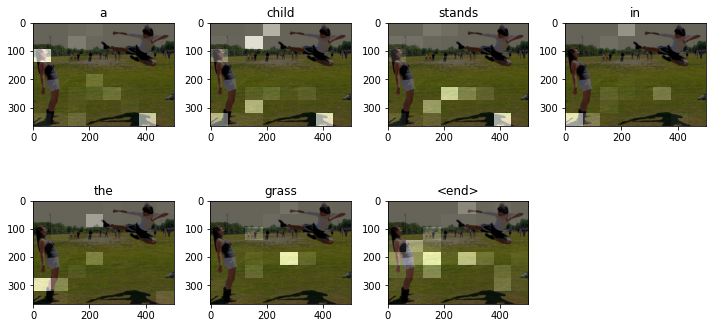

In [ ]:
show_validation(1393)

<u>Εικόνα με id = 6457</u>:

For image with id = 6457
Real Caption 0: <start> the surfer rides a blue board on a bright blue wave <end>
Real Caption 1: <start> a surfer rides a large wave on a blue board <end>
Real Caption 2: <start> a man surfs the foam right behind him <end>
Real Caption 3: <start> a person in a wetsuit surfs a big wave <end>
Real Caption 4: <start> a man surfing a wave <end>
Prediction Caption: a surfer is surfing a big white surfboard covering her way through the air <end>
bleu score: 0.10869107472494866


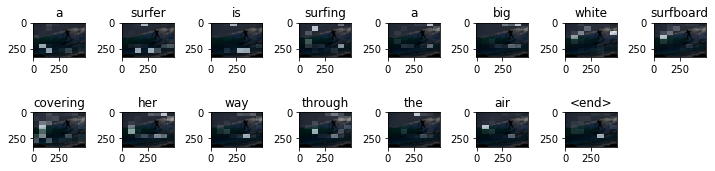

In [ ]:
show_validation(6457)

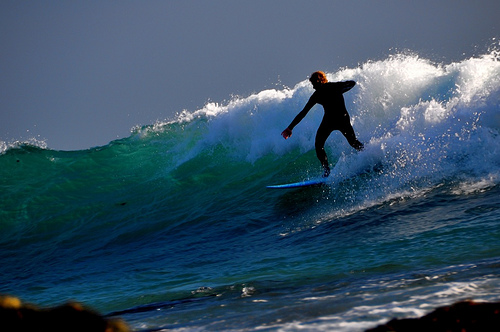

In [ ]:
Image.open(img_name_val[6457])

Τέλος, υπολογίζουμε το bleu score που επιτυγχάνει το μοντέλο στο πρώτο τέταρτο των δεδομένων του validation set.

In [ ]:
calculate_sentence_bleu(range(0, int(len(img_name_val)/4)), img_name_val)

0.09546739702278709

#### Δοκιμή 6: architecture: CNN-Encoder: InceptionV3 - RNN-Decoder: 1024 GRU Cells

Στη συγκεκριμένη περίπτωση δοκιμάζουμε και πάλι να τοποθετήσουμε στη default αρχιτεκτονική 1024 GRU Cells στη θέση των 512 GRU Cells που αυτή περιείχε. Εκπαιδεύουμε το μοντέλο που ακολουθεί την αρχιτεκτονινική αυτή στο υποσύνολο <b>10000 δεδομένων</b> του training set για <b>30 εποχές</b>, οπότε και προκύπτουν τα ακόλουθα αποτελέσματα.

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 36, min_length = 3, vocabulary_size = 10000, samples = 10000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 50, units = 1024, features_shape = 2048, attention_features_shape = 100))

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(39890, 39890, 9964, 9964)

In [ ]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size())

In [ ]:
EPOCHS = 30

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 1 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

2022-03-09 12:39:40.317671: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Epoch 1 Batch 0 Loss 3.4576
Epoch 1 Batch 100 Loss 2.0037
Epoch 1 Batch 200 Loss 1.5645
Epoch 1 Batch 300 Loss 1.4042
Epoch 1 Batch 400 Loss 1.4394
Epoch 1 Batch 500 Loss 1.3600
Epoch 1 Batch 600 Loss 1.3215
Epoch 1 Loss 1.622163
Time taken for 1 epoch 256.61 sec

Epoch 2 Batch 0 Loss 1.4456
Epoch 2 Batch 100 Loss 1.2716
Epoch 2 Batch 200 Loss 1.3981
Epoch 2 Batch 300 Loss 1.2318
Epoch 2 Batch 400 Loss 1.3956
Epoch 2 Batch 500 Loss 1.4059
Epoch 2 Batch 600 Loss 1.3070
Epoch 2 Loss 1.319574
Time taken for 1 epoch 127.94 sec

Epoch 3 Batch 0 Loss 1.2574
Epoch 3 Batch 100 Loss 1.3350
Epoch 3 Batch 200 Loss 1.1190
Epoch 3 Batch 300 Loss 1.2910
Epoch 3 Batch 400 Loss 1.2490
Epoch 3 Batch 500 Loss 1.1850
Epoch 3 Batch 600 Loss 1.1545
Epoch 3 Loss 1.211633
Time taken for 1 epoch 128.22 sec

Epoch 4 Batch 0 Loss 1.2189
Epoch 4 Batch 100 Loss 1.1409
Epoch 4 Batch 200 Loss 1.1817
Epoch 4 Batch 300 Loss 1.2000
Epoch 4 Batch 400 Loss 1.1442
Epoch 4 Batch 500 Loss 1.1354
Epoch 4 Batch 600 Loss 1.11

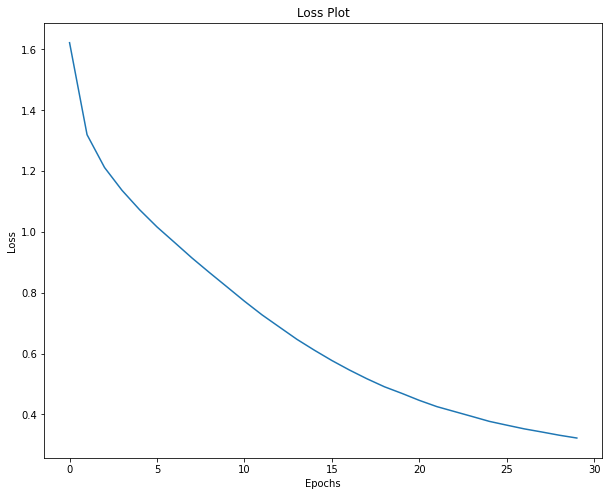

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Στη συνέχεια παρουσιάζουμε κάποια ενδεικτικά παραδείγματα προβλέψεων του μοντέλου.

<u>Εικόνα με id = 7783</u>:

For image with id = 7783
Real Caption 0: <start> blond haired woman pulling apart a watermelon sitting atop a marble table <end>
Real Caption 1: <start> a female with blond hair is cutting a watermelon on a marble countertop <end>
Real Caption 2: <start> a woman in a light blue shirt with white sleeves cuts a watermelon <end>
Real Caption 3: <start> waitress working in a restaurant cutting watermelon <end>
Real Caption 4: <start> a female cutting into a watermelon <end>
Prediction Caption: a woman working a bowl of coffee <end>
bleu score: 0.1378146366531358


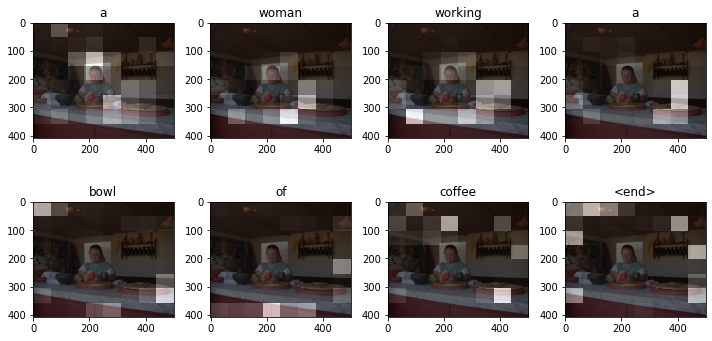

In [ ]:
show_validation(7783)

<u>Εικόνα με id = 5228</u>:

For image with id = 5228
Real Caption 0: <start> an old man in a striped shirt is glaring away from the other person on the bench most likely due to [UNK] <end>
Real Caption 1: <start> two older men sitting on a bench one is reading and one has his hand on some soda <end>
Real Caption 2: <start> two men sit at opposite ends of a bench waiting for the bus <end>
Real Caption 3: <start> two older men are sitting on opposite ends of a bench <end>
Real Caption 4: <start> two old men sit on opposite ends of a park bench <end>
Prediction Caption: a man and a woman sitting and are sitting on a sidewalk <end>
bleu score: 0.2310847786276272


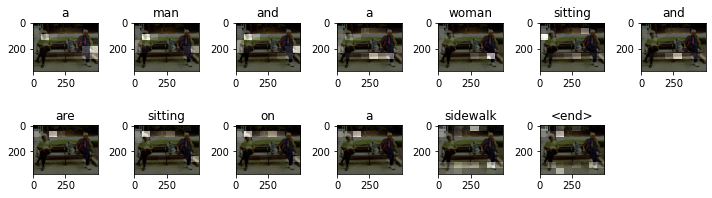

In [ ]:
show_validation(5228)

Τέλος, υπολογίζουμε το bleu score που επιτυγχάνει το μοντέλο στο πρώτο τέταρτο των δεδομένων του validation set.

In [ ]:
calculate_sentence_bleu(range(int(len(img_name_val)/4)), img_name_val)

0.11157734109458427

#### Σύνοψη

Στον ακόλουθο πίνακα συνοψίζουμε τα αποτελέσματα που προέκυψαν από τις παραπάνω δοκιμές.

| model | epochs | time per epoch | final train loss | val bleu score | 
| ----------- | ----------- | ----------- | ----------- | ----------- | 
| default arcitecture | 30 | ~84 sec | 0.415086 | 0.1137 |
| 1st trial  (LSTM cell)| 30 | ~86 sec | 0.404066 | 0.11712 |
| 2nd trial (Bidirectional GRU)| 30 | ~112 sec | 0.324647 | 0.1125 |
| 3rd trial (Xception) | 30 | ~96 sec | 0.368047 | 0.115148 | 
| 4th trial (Dropout)| 30 | ~85 sec | 0.446836 | 0.104085 |
| 5th trial (256 GRU Cells)| 30 | ~90 sec | 0.551323 | 0.095467 |
| 6th trial (1024 GRU Cells)| 30 | ~128 sec | 0.322094 | 0.111577 |

<u>Παρατηρήσεις</u>:

- Παρατηρούμε, αρχικά, από τις δοκιμές 5 και 6 ότι η μεταβολή των μονάδων GRU που απαρτίζουν τον RNN-Decoder δεν έχει θετική επίδραση στη συμπεριφορά του μοντέλου. Η χρήση 256 μονάδων μειώνει αρκετά το bleu score που επιτυγχάνει το μοντέλο στο validation set, ενώ αντίθετα η χρήση 1024 μονάδων GRU αυξάνει αρκετά το χρόνο εκπαίδευσης, και παρότι μειώνει το train loss δε λέπουμε αντίστοιχη μείωση και στο bleu score του validation set, γεγονός που μας οδηγεί στο συμπέρασμα ότι πιθανώς το μοντέλο αυτό (με 1024 μονάδες GRU παρουσιάζει overfitting).

- Επιπλέον, παρατηρούμε ότι η χρήση του συνελικτικού δικτύου Xception, αντί του InceptionV3 βελτιώνει την απόδοση του δικτύου, αυξάνοντας (λίγο) το bleu score που αυτό επιτυγχάνει στο validation set, ενώ παράλληλα παρατηρούμε ότι τα captions που προβλέπει συγκριτκά με το InceptionV3 έχουν μεγαλύτερη νοηματική συνοχή. Το γεγονός αυτό πιθανώς οφείλεται στο ότι το Xception δίκτυο καταφέρνει να εξάγει πιο αντιπροσωπευτικά χαρακτηριστικά για τις εικόνες συγκριτκά με το InceptionV3. Την άποψη αυτή ενισχύει και το διάγραμμα plot_attention στο οποίο βλέπουμε "καλυτερες" αντιστοιχίσεις μεταξύ λέξεων και σημείων της εικόνας στα οποία δίνεται έμφαση για την πρόβλεψη αυτών. Χαρακτηριστικό παράδειγμα αυτού αποτελεί η εικόνα με id =  8165 (παρουσιάζεται παραπάνω) για τις λέξεις "selling" και "fruit".

- Τέλος, παρατηρούμε βελτίωση στην απόδοση του μοτέλου, με μικρή αύξηση του bleu score για το validation set, με τη χρήση LSTM cell στη θέση του GRU cell. 

- Όσον αφορά τη χρήση dropout, παρατηρούμε ότι στην περίπτωση αυτή αυξάνεται το train loss, κάτι το οποίο είναι αναμενόμενο, δεδομένου ότι η τεχνική αυτή χρησιμοποιείται για περιορισμό του overfitting, μηδενίζοντας με τυχαία επιλογή βάρη που έχουν εκπαιδευτεί μέχρι εκείνη τη στιγμή. Ωστόσο, δεν παρατηρούμε κάποια ιδιαίτερη συνεισφορά σην απόδοση του μοντέλου κρίνοντας από το score που επιτυγχάνει στο validation test. Το γεγονός αυτό βέβαια μπορεί να οφείλεται και στο σχετικά περιορισμένο πλήθος training δεδομένων πο χρησιμοποιούμε για εξοικονόμηση χρόνου.

### Τελική αξιολόγηση των καλύτερων μοντέλων - Διαφορετικοί Sentence Generators

Επιλέγουμε να υλοποιήσουμε τρία μοντέλα που προκύπτουν ως συνδυασμός κάποιων εκ των παραπάνω δοκιμών και να τα εκπαιδεύσουμε πάνω στο σύνολο όλων των δοθέντων δεδομένων, προκειμένου να δούμε την τελική απόδοση τους. Και στα τρία μοντέλα θα χρησιμοποιήσουμε τα προεκπαιδευμένα wiki-gigaword-300 embeddings σε συνδυασμό με το συνελικτικό δίκτυο Xcception για την εξαγωγή χαρακτηριστικών από τις εικόνες, καθώς και οι δύο αυτές τεχνικές παρουσίασαν βελτιωμένα αποτελέσματα συγκριτικά με τη default αρχιτεκτονική.

Στα μοντέλα αυτά, ως τελευταίο στάδιο βελτίωσης θα δοκιμάσουμε να χρησιμοποιήσουμε και διαφορετικούς Sentence Generators. Οι Sentence Generators που θα χρησιμοποιήσουμε είναι:
- Ο default που χρησιμοποιούσαμε μέχρι τώρα. Αυτός χρησιμοποιεί την tf.random.categorical για να επιλέξει την επόμενη λέξη. Πιο αναλυτικά, επιλέγει την επόμενη λέξη τυχαία μεταξύ όλων των υποψήφιων λέξεων που περιλαμβάνονται στο λεξιλόγιο του tokenizer αντιστοιχίζοντας σε κάθε λέξη πιθανότητα επιλογής ίση με αυτήν που προέβλεψε η έξοδος του decoder του εκάστοτε μοντέλου για αυτή.
- O Greedy Sentence Generator, ο οποίος επιλέγει την επόμενη λέξη εφαρμόζοντας greedy search. Με άλλα λόγια, δηλαδή, επιλέγει ως επόμενη λέξη απευθείας τη λέξη που αντιστοιχεί στη μεγαλύτερη πιθανότητα από αυτές που προέβλεψε ο decoder του μοντέλου.
- O Beam Search Sentence Generator, ο οποίος επιλέγει την επόμενη λέξη εφαρμόζοντας Greedy Search. Πιο αναλυτικά, για να διαλέξει την επόμενη λέξη ξεκινάει από την αρχή της πρότασης και κρατάει τις b τo πλήθος καλύτερες (πιθανότερες) λέξεις για το επόμενο βήμα. Με τον τρόπο αυτό δημιουργούνται b κλαδιά. Για το επόμενο βήμα υπολογίζει τις πιθανότητες των επόμενων λέξεων για όλα τα κλαδιά και κρατάει τις b πιθανότερες κ.ο.κ. Στο τέλος καταλήγει να έχει b πιθανές προτάσεις και διαλέγει αυτή με τις καλύτερες πιθανότητες συνολικά (δηλαδή αυτή που αντιστοιχεί στο μεγαλύτερο άθροισμα λογαρίθμων πιθανοτήτων εάν αυτό διαιρεθεί με το μήκος της εκάστοτε πρότασης). 

Όσον αφορά την υλοποίηση των παραπάνω Sentence Generators , κατασκευάζουμε επιπλέον της συνάρτησης `evaluate`, τις συναρτήσεις `greedy_evaluate` και `beam_evaluate`, όπως φαίνεται παρακάτω.

In [ ]:
def greedy_evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([word_to_index(['<start>'])][0], 0)
    result = []
    for i in range(max_length):

        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
        predicted_id = tf.math.argmax(predicitons).numpy()
        predicted_word = tf.compat.as_text(index_to_word([predicted_id])[0].numpy())
        result.append(predicted_word)

        if predicted_word == '<end>':
            return result, attention_plot
        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

In [ ]:
def beam_one_step(dec_input, features, hidden):    
    """ Perform the model update and output for one step"""
    predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
    return predictions, hidden

In [ ]:
def beam_evaluate(image, beam_depth = 5, beam_width = 3, ignore_blank = True):
    
    def recursive_fn(dec_input, hidden, features, sequence, log_prob, i):
        
        if i == beam_depth or tf.compat.as_text(index_to_word(dec_input).numpy()[0][0]) == '<end>':
            results.append((list(sequence), hidden, np.exp(log_prob)))
            return sequence, log_prob, hidden
        else:
            predictions, new_hidden = beam_one_step(dec_input, features, hidden)
            
            top_probs, top_ids = tf.nn.top_k(predictions, k=beam_width)
            top_probs, top_ids = top_probs.numpy().ravel(), top_ids.numpy().ravel()
            
            for p, wid in zip(top_probs, top_ids):
                new_log_prob = log_prob + np.log(p)
                
                if len(sequence)>0 and wid == sequence[-1]:
                    new_log_prob = new_log_prob + np.log(1e-1)
                    
                sequence.append(wid)
                _ = recursive_fn(
                    np.array([[wid]]), new_hidden, features, sequence, new_log_prob, i+1
                )                                         
                sequence.pop()
        
        
    hidden = decoder.reset_state(batch_size = 1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))
    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([word_to_index(['<start>'])][0], 0) 

    results = []
    sequence = []
    log_prob = 0.0
    recursive_fn(dec_input, hidden, features, sequence, log_prob, 0)
    results = sorted(results, key=lambda x: x[2], reverse=True)
    
    maximum = - np.inf
    maximum_result = []
    for x in results:
        if tf.math.reduce_sum(x[1]).numpy() > maximum:
            maximum = tf.math.reduce_sum(x[1]).numpy()
            maximum_result = x[0]
    
    return maximum_result

Στη συνέχεια τροποοποιούμε τις συναρτήσεις `show_validation` και `calculate_sentence_blue` που χρησιμοιούνται αντίστοιχα στην αξιολόγηση των μοντέλων σε επίπεδο εικόνας και dataset, με τρόπο ώστε να μπορούμε να επιλέγουμε κάθε φορά τον εκάστοτε Sentence Generator που θέλουμε να χρησιμοποιήσουμε.

In [ ]:
def show_validation(rid, sentence_generator = 'default', beam_depth = 5, beam_width = 3):
    ###
    #sentence_generator: 'default' / 'greedy' / 'beam'
    ###
    
    print('For image with id =', rid)
    image = img_name_val[rid]
    l = [i for i in range(0, len(img_name_val)) if img_name_val[i] == image]
    references = []
    for r in l:
        references.append([tf.compat.as_text(index_to_word(i).numpy()) for i in cap_val[r] if i not in [0]])

    if sentence_generator == 'default':
      result, attention_plot = evaluate(image)
    elif sentence_generator == 'greedy':
      result, attention_plot = greedy_evaluate(image)
    elif sentence_generator == 'beam':
      result = beam_evaluate(image, beam_depth = 5, beam_width = 3) 

    for reference in references:
        print('Real Caption:', ' '.join(reference))
    print('Prediction Caption:', ' '.join(result))
    print('blue score:', sentence_bleu(references, result ,weights=(0.4, 0.3, 0.2, 0.1),smoothing_function=SmoothingFunction().method1))
    if not (sentence_generator == 'beam'):
      plot_attention(image, result, attention_plot)   

In [ ]:
def calculate_sentense_blue(imgs, img_name_val, sentence_generator = 'default', beam_depth = 5, beam_width = 3):
    hypothesis = []
    list_of_references = []
    for img in imgs:
        image = img_name_val[img]
        if sentence_generator = 'default':
          result, _ = evaluate(image) 
        elif sentence_generator = 'greedy':
          result, _ = greedy_evaluate(image) 
        else:
          result, _ = beam_evaluate(image, beam_depth = 5, beam_width = 3) 
        hypothesis.append(result)
        l = [i for i in range(0, len(img_name_val)) if img_name_val[i] == image]
        references = []
        for rid in l:
            references.append([tf.compat.as_text(index_to_word(i).numpy())
                             for i in cap_val[rid] if i not in [0]])
        list_of_references.append(references)
        
    return corpus_bleu(list_of_references, hypothesis, weights=(0.4, 0.3, 0.2, 0.1),smoothing_function = SmoothingFunction().method1)

<u>Παρατήρηση</u>:

Σύμφωνα με τα παραπάνω, αναμένουμε οι Sentence Generators Greedy και Beam, όπως και συμβαίνει, να καταλήγουν πάντα στην ίδια πρόβλεψη (caption) για μια συγκεκριμένη εικόνα, ενώ ανίθετα ο defautlt (random categorical) κάθε φορά που καλείται προτείνει και διαφορετικό caption, λόγω ακριβώς της πιθανοτικής χρήσης του.

Τα μοντέλα που θα χρησιμοποιήσουμε είναι:

#### Μοντέλο 1:

Το μοντέλο που υλοποιούμε πρώτο αποτελείται από τα ακόλουθα:

- min_length = 3, max_length = 30, vocabulary_size = 9000
- wiki-gigaword-300 pretrained embeddings
- CNN-Endcoder: Xception with dropout
- RNN-Decoder: 512 Bidirectional GRU Cells with dropout

Εκπαιδεύουμε το μοντέλο αυτό χρησιμοποιώντας ως train set <b>25000 εικόνες</b> (ο μέγιστος αριθμός εικόνων για τις οποίες έχουμε διαθέσιμα τα Xception χαρακτηριστικά) για <b>40 εποχές</b>, οπότε και λαμβάνουμε τα ακόλουθα αποτελέσματα. 

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 30, min_length = 3, vocabulary_size = 9000, samples = 25000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 300, units = 512)

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(99163, 99163, 24792, 24792)

In [ ]:
import gensim.downloader

glove_embeddings = gensim.downloader.load("glove-wiki-gigaword-300")

[===============================================---] 95.7% 360.0/376.1MB downloaded

In [ ]:
embedding_matrix = CreateEmbeddingMatrix(glove_embeddings, embedding_dim = 300, vocabulary_size = 9000, index_to_word)

Converted 8940 words (60 misses)


In [ ]:
encoder = CNN_Encoder(embedding_dim, dropout_flag = True)
decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size(), embedding_flag = True, embedding_matrix = embedding_matrix, lstm_flag = False, bidirectional = True, dropout_flag = True)

In [ ]:
EPOCHS = 40

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

2022-03-09 09:37:09.694738: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Epoch 1 Batch 0 Loss 3.9941
Epoch 1 Batch 100 Loss 2.0890
Epoch 1 Batch 200 Loss 1.8646
Epoch 1 Batch 300 Loss 1.7320
Epoch 1 Batch 400 Loss 1.7496
Epoch 1 Batch 500 Loss 1.5797
Epoch 1 Batch 600 Loss 1.6476
Epoch 1 Batch 700 Loss 1.5543
Epoch 1 Batch 800 Loss 1.5317
Epoch 1 Batch 900 Loss 1.6400
Epoch 1 Batch 1000 Loss 1.7029
Epoch 1 Batch 1100 Loss 1.6373
Epoch 1 Batch 1200 Loss 1.3744
Epoch 1 Batch 1300 Loss 1.4788
Epoch 1 Batch 1400 Loss 1.3809
Epoch 1 Batch 1500 Loss 1.3449
Epoch 1 Loss 1.651385
Time taken for 1 epoch 575.49 sec

Epoch 2 Batch 0 Loss 1.5616
Epoch 2 Batch 100 Loss 1.5139
Epoch 2 Batch 200 Loss 1.3492
Epoch 2 Batch 300 Loss 1.5621
Epoch 2 Batch 400 Loss 1.3889
Epoch 2 Batch 500 Loss 1.3380
Epoch 2 Batch 600 Loss 1.4583
Epoch 2 Batch 700 Loss 1.3060
Epoch 2 Batch 800 Loss 1.4470
Epoch 2 Batch 900 Loss 1.3118
Epoch 2 Batch 1000 Loss 1.4062
Epoch 2 Batch 1100 Loss 1.3322
Epoch 2 Batch 1200 Loss 1.3137
Epoch 2 Batch 1300 Loss 1.3272
Epoch 2 Batch 1400 Loss 1.3221
Epoch 

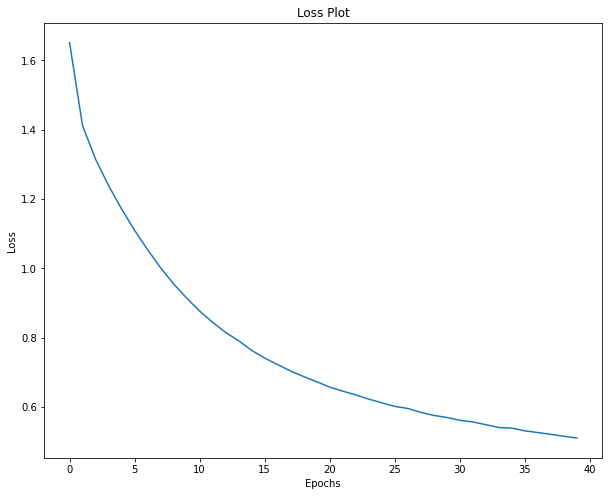

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Στη συνέχεια παρουσιάζουμε κάποια ενδεικτικά παραδείγματα προβλέψεων του μοντέλου αυτού στο validation set, χρησιμοποιώντας κάθε φορά διαφορετικό Sentence Generator.

<u>Εικόνα με id = 23193</u>:

For image with id = 23193
Real Caption: <start> a man in a wetsuit is surfing on a green surfboard <end>
Real Caption: <start> a man in a full wetsuit surfs a crashing wave <end>
Real Caption: <start> a man surfs in the curl of the wave <end>
Real Caption: <start> a surfer rides out a wave <end>
Real Caption: <start> a person surfing a wave <end>
Prediction Caption: there is a wetsuit play on a high wave <end>
blue score: 0.15358386408518024


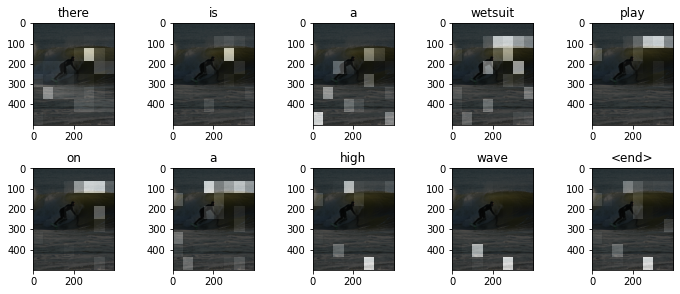

In [ ]:
show_validation(23193, sentence_generator = 'greedy')

<u>Εικόνα με id = 4314</u>:

For image with id = 4314
Real Caption: <start> a woman in a white bikini rides a bicycle people walk and cycle behind her <end>
Real Caption: <start> a tanned woman is riding a bicycle while wearing a white bikini <end>
Real Caption: <start> a young woman riding a bike wearing a white bikini <end>
Real Caption: <start> a tan woman riding her bike next to the beach <end>
Real Caption: <start> a woman in a white bikini riding a bike <end>
Prediction Caption: a young girl in a bike with her bike in a bike <end>
blue score: 0.24735275070339385


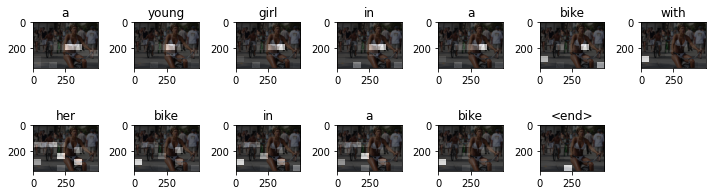

In [ ]:
show_validation(4314, sentence_generator = 'greedy')

<u>Εικόνα με id = 8137</u>:

For image with id = 8137
Real Caption: <start> a woman getting ready to play a musical instrument <end>
Real Caption: <start> asian woman plays music inside of a subway station <end>
Real Caption: <start> a woman is playing an instrument in a bus station <end>
Real Caption: <start> a woman is sitting and playing music <end>
Real Caption: <start> the old woman is opening her bag <end>
Prediction Caption: an older woman is standing in the garage <end>
blue score: 0.12936052434034728


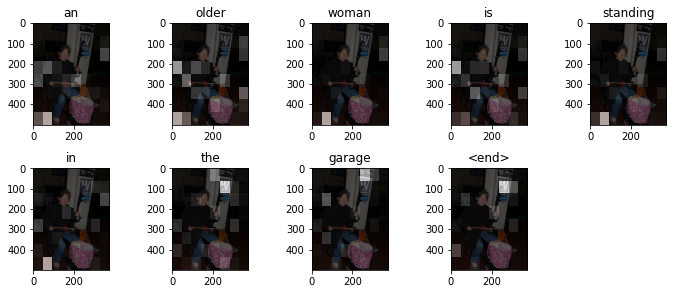

In [ ]:
show_validation(8137, sentence_generator = 'greedy')

<u>Εικόνα με id = 20525</u>:

For image with id = 20525
Real Caption: <start> one african american male in a white and red t shirt is using an electric [UNK] to shave another seated african american male s head <end>
Real Caption: <start> black male wearing run [UNK] t shirt giving another black male a haircut <end>
Real Caption: <start> a dark colored man does a head shave for another dark colored man <end>
Real Caption: <start> a man is getting his haircut by another man with a razor <end>
Real Caption: <start> one black boy giving another a buzzed haircut <end>
Prediction Caption: a man getting his haircut <end>
blue score: 0.25898416906519145


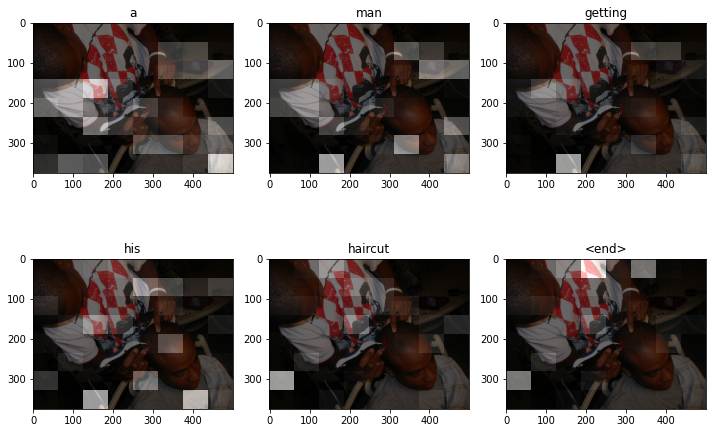

In [ ]:
show_validation(20525, sentence_generator = 'greedy')

<u>Εικόνα με id = 4029</u>:

For image with id = 4029
Real Caption: <start> a man is drinking a beer with two young children who are drinking water on his lap <end>
Real Caption: <start> a man is drinking a beer while two children sit on his lap drinking water <end>
Real Caption: <start> a man and two children all enjoying a drink water soda and beer <end>
Real Caption: <start> two toddlers and a younger man enjoy their bottles <end>
Real Caption: <start> a man and two children take a drink <end>
Prediction Caption: a man examines something with his camera <end>
blue score: 0.1073301469441633


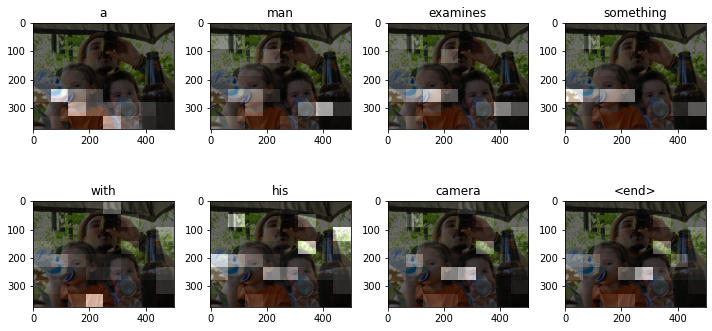

In [ ]:
show_validation(4029, sentence_generator = 'default')

<u>Εικόνα με id = 9074</u>:

For image with id = 9074
Real Caption: <start> an elderly man pushes a cart with a loved one s memorial picture down the street <end>
Real Caption: <start> a man is pushing a three wheeled cart down a sidewalk with a piece of art on top <end>
Real Caption: <start> the man is pushing a cart full of art <end>
Real Caption: <start> old man is pushing an antique card <end>
Real Caption: <start> old man pushing a cart in street <end>
Prediction Caption: a person wearing a white shirt is pushing a blue bike putting machine <end>
blue score: 0.15451112731797376


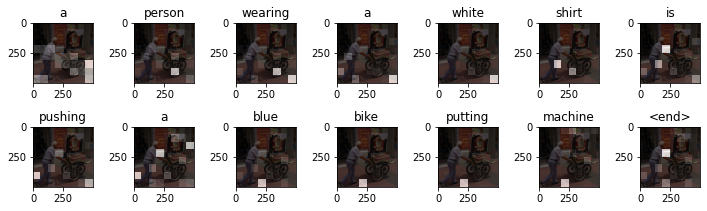

In [ ]:
show_validation(9074, sentence_generator = 'default')

<u>Εικόνα με id = 7246</u>:

For image with id = 7246
Real Caption: <start> a man with a baseball cap and black jacket stands in a bathroom while holding a coffee mug <end>
Real Caption: <start> a man is wearing a ball cap and holding a coffee cup between to [UNK] <end>
Real Caption: <start> a man is posing next to a urinal with a cup of coffee <end>
Real Caption: <start> a man holds a coffee cup while in the bathroom <end>
Real Caption: <start> a man standing at a urinal with a coffee cup <end>
Prediction Caption: a man is walking in a shower <end>
blue score: 0.198133074325961


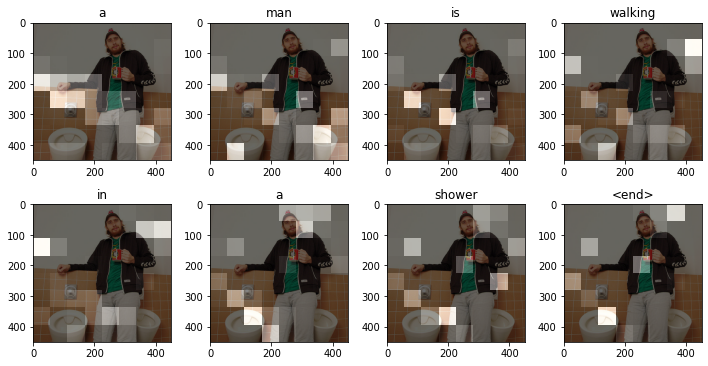

In [ ]:
show_validation(7246, sentence_generator = 'default')

<u>Εικόνα με id = 17909</u>:

For image with id = 17909
Real Caption: <start> a group of people wait in line in front of a counter <end>
Real Caption: <start> people waiting in line for their favorite beverage <end>
Real Caption: <start> several people are standing in line at a counter <end>
Real Caption: <start> a group of people in line at a music venue <end>
Real Caption: <start> customers wait in line at a store <end>
Prediction Caption: a group of people walking in a restaurant <end>
blue score: 0.4384528108764514


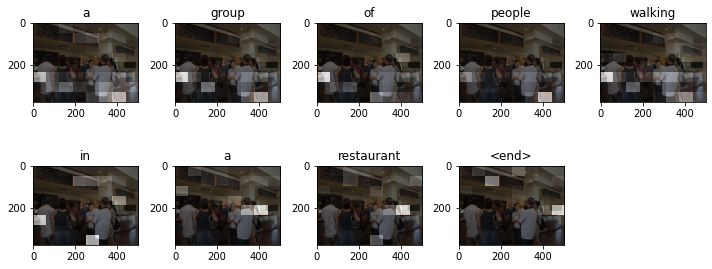

In [ ]:
show_validation(17909, sentence_generator = 'default')

Τέλος, υπολογίζουμε το bleu score που επιτυγχάνει το μοντέλο στα δεδομένα του validation set.

In [ ]:
calculate_sentence_bleu(range(len(img_name_val)), img_name_val, stentence_generator = 'greedy')

0.11774123283201827

In [ ]:
calculate_sentence_bleu(range(len(img_name_val)), img_name_val, stentence_generator = 'default')

0.11525784029878305

#### Μοντέλο 2:

Το μοντέλο που υλοποιούμε πρώτο αποτελείται από τα ακόλουθα:

- min_length = 3, max_length = 32, vocabulary_size = 9000
- wiki-gigaword-300 pretrained embeddings
- CNN-Endcoder: Xception with dropout
- RNN-Decoder: 512 LSTM Cells with dropout

Εκπαιδεύουμε το μοντέλο αυτό χρησιμοποιώντας και πάλι ως train set <b>25000 εικόνες</b> (ο μέγιστος αριθμός εικόνων για τις οποίες έχουμε διαθέσιμα τα Xception χαρακτηριστικά) για <b>40 εποχές</b>, οπότε και λαμβάνουμε τα ακόλουθα αποτελέσματα. 

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 30, min_length = 3, vocabulary_size = 9000, samples = 25000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 300, units = 512)

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(99418, 99418, 24858, 24858)

In [ ]:
import gensim.downloader

glove_embeddings = gensim.downloader.load("glove-wiki-gigaword-300")

[===============================================---] 95.7% 360.0/376.1MB downloaded

In [ ]:
embedding_matrix = CreateEmbeddingMatrix(glove_embeddings, embedding_dim = 300, vocabulary_size = 9000, index_to_word)

Converted 8940 words (60 misses)


In [ ]:
encoder = CNN_Encoder(embedding_dim, dropout_flag = True)
decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size(), embedding_flag = True, embedding_matrix = embedding_matrix, lstm_flag = True, bidirectional = False, dropout_flag = True)

In [ ]:
EPOCHS = 40

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

2022-03-09 20:34:25.037808: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Epoch 1 Batch 0 Loss 3.7387
Epoch 1 Batch 100 Loss 2.2654
Epoch 1 Batch 200 Loss 1.8505
Epoch 1 Batch 300 Loss 1.6240
Epoch 1 Batch 400 Loss 1.5682
Epoch 1 Batch 500 Loss 1.5799
Epoch 1 Batch 600 Loss 1.4508
Epoch 1 Batch 700 Loss 1.6960
Epoch 1 Batch 800 Loss 1.6150
Epoch 1 Batch 900 Loss 1.6760
Epoch 1 Batch 1000 Loss 1.5615
Epoch 1 Batch 1100 Loss 1.5847
Epoch 1 Batch 1200 Loss 1.6872
Epoch 1 Batch 1300 Loss 1.4179
Epoch 1 Batch 1400 Loss 1.5855
Epoch 1 Batch 1500 Loss 1.4872
Epoch 1 Loss 1.607646
Time taken for 1 epoch 491.17 sec

Epoch 2 Batch 0 Loss 1.3057
Epoch 2 Batch 100 Loss 1.2736
Epoch 2 Batch 200 Loss 1.2985
Epoch 2 Batch 300 Loss 1.4847
Epoch 2 Batch 400 Loss 1.4423
Epoch 2 Batch 500 Loss 1.3171
Epoch 2 Batch 600 Loss 1.2172
Epoch 2 Batch 700 Loss 1.3150
Epoch 2 Batch 800 Loss 1.2780
Epoch 2 Batch 900 Loss 1.2323
Epoch 2 Batch 1000 Loss 1.3214
Epoch 2 Batch 1100 Loss 1.3430
Epoch 2 Batch 1200 Loss 1.3119
Epoch 2 Batch 1300 Loss 1.2518
Epoch 2 Batch 1400 Loss 1.3725
Epoch 

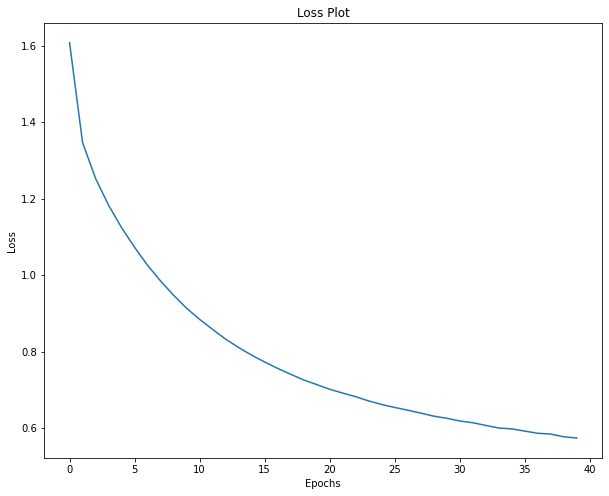

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Στη συνέχεια παρουσιάζουμε κάποια ενδεικτικά παραδείγματα προβλέψεων του μοντέλου αυτού στο validation set, χρησιμοποιώντας κάθε φορά διαφορετικό Sentence Generator.

<u>Εικόνα με id = 13555</u>:

For image with id = 13555
Real Caption: <start> a group of nine people viewing a city from an observation point while some take pictures <end>
Real Caption: <start> a group of young people are looking over a fence at a sprawling city <end>
Real Caption: <start> nine teenagers leaning over a railing looking at the view of a city <end>
Real Caption: <start> tourists experience a wonderful view overlooking a busy city <end>
Real Caption: <start> a group of students looking over a balcony on a senior trip <end>
Prediction Caption: a group of children in front of a park <end>
blue score: 0.21276215266182819


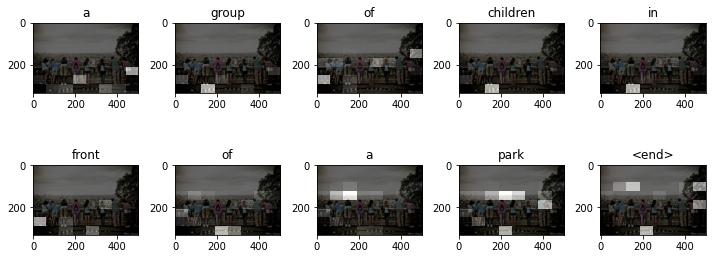

In [ ]:
show_validation(13555, sentence_generator = 'greedy')

<u>Εικόνα με id = 3918</u>:

For image with id = 3918
Real Caption: <start> a person with a helmet and [UNK] on is riding a motorcycle in the dirt <end>
Real Caption: <start> a rider in a yellow suits drives his dirt bike through the dirt <end>
Real Caption: <start> a person in yellow is riding a dirt bike on a dirt path <end>
Real Caption: <start> a motorcyclist is driving in a muddy pit <end>
Real Caption: <start> a person riding a dirt bike on mud <end>
Prediction Caption: a dirt bike rider in red is riding a dirt bike on a dirt road <end>
blue score: 0.5662802718531035


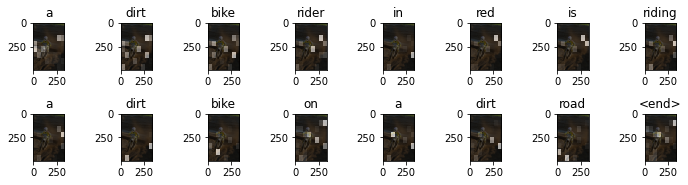

In [ ]:
show_validation(3918, sentence_generator = 'greedy')

<u>Εικόνα με id = 12520</u>:

For image with id = 12520
Real Caption: <start> a person in a wheelchair plays a netted sport with three players in green shirts while being coached by an older woman off to his left <end>
Real Caption: <start> a man in a wheelchair and a blond woman play badminton with three youths <end>
Real Caption: <start> people playing badminton in a gymnasium <end>
Real Caption: <start> people playing in a gym with a net <end>
Real Caption: <start> a crippled women playing a sport <end>
Prediction Caption: two men are practicing a sport fencing <end>
blue score: 0.11234554220248019


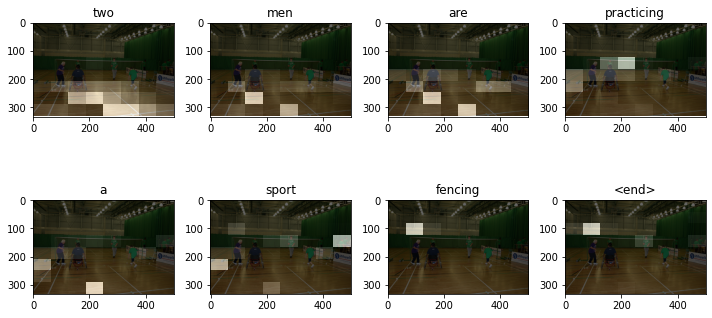

In [ ]:
show_validation(12520, sentence_generator = 'greedy')

<u>Εικόνα με id = 14434</u>:

For image with id = 14434
Real Caption: <start> three people are riding motocross bikes along a dirt path <end>
Real Caption: <start> three people racing on a dirt bike trail in a sandy area <end>
Real Caption: <start> three bikes riding on a trail during motocross run <end>
Real Caption: <start> three motor cross bike racers in a competition <end>
Real Caption: <start> three motorcyclists are racing on dirt bikes <end>
Prediction Caption: one person riding a motorbike down a dirt road on a dirt road <end>
blue score: 0.15451112731797376


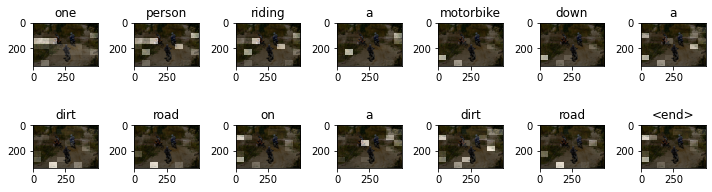

In [ ]:
show_validation(14434, sentence_generator = 'default')

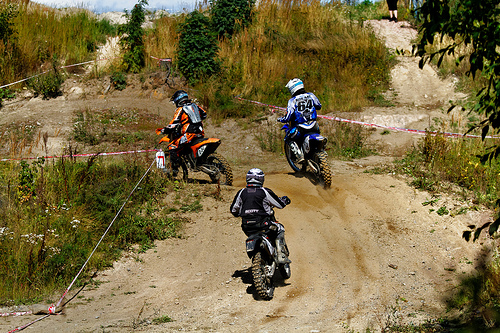

In [ ]:
Image.open(img_name_val[14434])

<u>Εικόνα με id = 9133</u>:

For image with id = 9133
Real Caption: <start> the man with pierced ears is wearing glasses and an orange hat <end>
Real Caption: <start> a man with glasses is wearing a beer can crocheted hat <end>
Real Caption: <start> a man with gauges and glasses is wearing a [UNK] hat <end>
Real Caption: <start> a man in an orange hat starring at something <end>
Real Caption: <start> a man wears an orange hat and glasses <end>
Prediction Caption: a man is wearing a black hat <end>
blue score: 0.29497888902833364


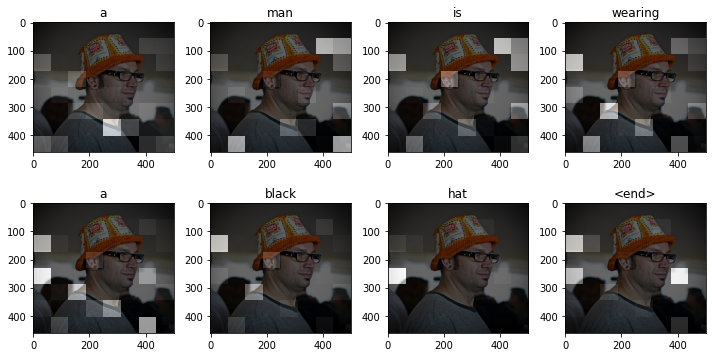

In [ ]:
show_validation(9133, sentence_generator = 'default')

<u>Εικόνα με id = 1601</u>:

For image with id = 1601
Real Caption: <start> the little girl in the pink shirt is running under a tree in the desert <end>
Real Caption: <start> the little girl in the pink top is running down the path <end>
Real Caption: <start> a girls wearing jeans and a pink shirt runs <end>
Real Caption: <start> young girl in jeans runs through desert <end>
Real Caption: <start> a girl is running on a desert path <end>
Prediction Caption: a young girl walking a trail <end>
blue score: 0.12134426988894406


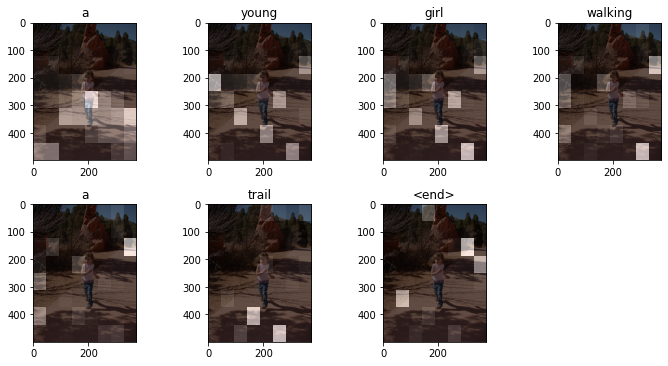

In [ ]:
show_validation(1601, sentence_generator = 'default')

Τέλος, υπολογίζουμε το bleu score που επιτυγχάνει το μοντέλο στα δεδομένα του validation set.

In [2]:
calculate_sentence_bleu(range(len(img_name_val)), img_name_val, stentence_generator = 'greedy')

0.12533679299161724


In [3]:
calculate_sentence_bleu(range(len(img_name_val)), img_name_val, stentence_generator = 'default')

0.11249295543697214


#### Μοντέλο 3:

Το μοντέλο που υλοποιούμε πρώτο αποτελείται από τα ακόλουθα:

- min_length = 3, max_length = 32, vocabulary_size = 9000
- wiki-gigaword-300 pretrained embeddings
- CNN-Endcoder: Xception with dropout
- RNN-Decoder: 512 Bidirectional LSTM Cells with dropout

Εκπαιδεύουμε το μοντέλο αυτό χρησιμοποιώντας και πάλι ως train set <b>25000 εικόνες</b> (ο μέγιστος αριθμός εικόνων για τις οποίες έχουμε διαθέσιμα τα Xception χαρακτηριστικά) για <b>30 εποχές</b>, οπότε και λαμβάνουμε τα ακόλουθα αποτελέσματα. 

In [ ]:
df = pd.read_csv("../input/create-data-nn-lab3/train_captions.csv" , sep = "|" , header = None)
img_name_train, cap_train, img_name_val, cap_val, word_to_index, index_to_word = CreateDataset(df, max_length = 30, min_length = 3, vocabulary_size = 9000, samples = 25000, seed = 20)
dataset = CreateTrainDataset(img_name_train, cap_train, BATCH_SIZE = 64, BUFFER_SIZE = 1000, embedding_dim = 300, units = 512)

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(99418, 99418, 24858, 24858)

In [ ]:
import gensim.downloader

glove_embeddings = gensim.downloader.load("glove-wiki-gigaword-300")

[===============================================---] 95.7% 360.0/376.1MB downloaded

In [ ]:
embedding_matrix = CreateEmbeddingMatrix(glove_embeddings, embedding_dim = 300, vocabulary_size = 9000, index_to_word)

Converted 8940 words (60 misses)


In [ ]:
encoder = CNN_Encoder(embedding_dim, dropout_flag = True)
decoder = RNN_Decoder(embedding_dim, units, tokenizer.vocabulary_size(), embedding_flag = True, embedding_matrix = embedding_matrix, lstm_flag = True, bidirectional = False, dropout_flag = True)

In [ ]:
EPOCHS = 30

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
        ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

2022-03-09 16:58:21.254937: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


Epoch 1 Batch 0 Loss 3.6011
Epoch 1 Batch 100 Loss 1.8106
Epoch 1 Batch 200 Loss 1.8125
Epoch 1 Batch 300 Loss 1.7356
Epoch 1 Batch 400 Loss 1.7144
Epoch 1 Batch 500 Loss 1.4874
Epoch 1 Batch 600 Loss 1.4393
Epoch 1 Batch 700 Loss 1.4843
Epoch 1 Batch 800 Loss 1.4678
Epoch 1 Batch 900 Loss 1.4797
Epoch 1 Batch 1000 Loss 1.5522
Epoch 1 Batch 1100 Loss 1.3178
Epoch 1 Batch 1200 Loss 1.4911
Epoch 1 Batch 1300 Loss 1.4978
Epoch 1 Batch 1400 Loss 1.3664
Epoch 1 Batch 1500 Loss 1.2517
Epoch 1 Loss 1.571342
Time taken for 1 epoch 561.88 sec

Epoch 2 Batch 0 Loss 1.4178
Epoch 2 Batch 100 Loss 1.4187
Epoch 2 Batch 200 Loss 1.2108
Epoch 2 Batch 300 Loss 1.3490
Epoch 2 Batch 400 Loss 1.2305
Epoch 2 Batch 500 Loss 1.3999
Epoch 2 Batch 600 Loss 1.3949
Epoch 2 Batch 700 Loss 1.3346
Epoch 2 Batch 800 Loss 1.2369
Epoch 2 Batch 900 Loss 1.3383
Epoch 2 Batch 1000 Loss 1.3962
Epoch 2 Batch 1100 Loss 1.4384
Epoch 2 Batch 1200 Loss 1.1831
Epoch 2 Batch 1300 Loss 1.2931
Epoch 2 Batch 1400 Loss 1.3301
Epoch 

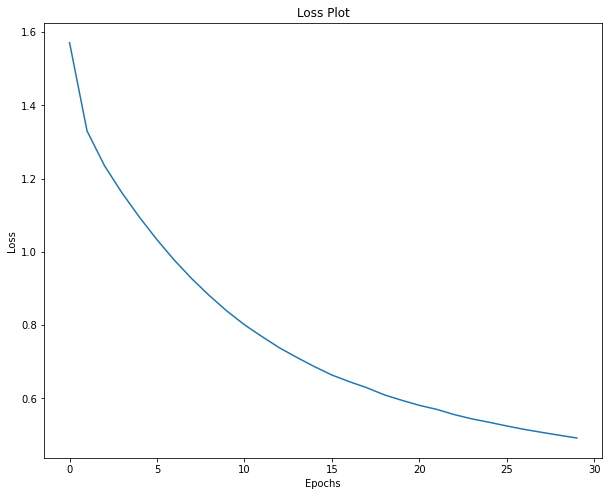

In [ ]:
plt.figure(figsize = (10, 8))
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

Στη συνέχεια παρουσιάζουμε κάποια ενδεικτικά παραδείγματα προβλέψεων του μοντέλου αυτού στο validation set, χρησιμοποιώντας κάθε φορά διαφορετικό Sentence Generator.

<u>Εικόνα με id = 7542</u>:

For image with id = 7542
Real Caption: <start> a person with a gray hood pulled over his or her face is reclining against a ladder <end>
Real Caption: <start> a person in a white sweatshirt sits on a ladder <end>
Real Caption: <start> a person in a gray hoodie sitting on a latter <end>
Real Caption: <start> a dark stage set is under construction <end>
Real Caption: <start> a warehouse under construction <end>
Prediction Caption: a person on a metal structure <end>
blue score: 0.19879818238263727


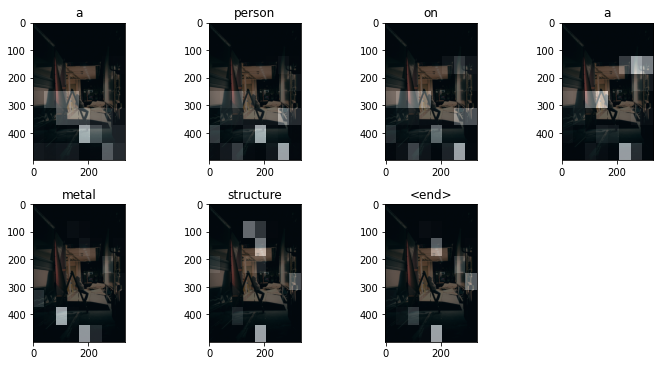

In [ ]:
show_validation(7542, sentence_generator = 'greedy')

<u>Εικόνα με id = 23979</u>:

For image with id = 23979
Real Caption: <start> a little boy wearing a light blue shirt is holding a red hammer <end>
Real Caption: <start> a child holding a red toy hammer in right hand <end>
Real Caption: <start> a little boy in a blue shirt holding a toy <end>
Real Caption: <start> a young child is holding a red toy hammer <end>
Real Caption: <start> a boy with a toy red hammer <end>
Prediction Caption: a little boy is holding a plastic bag <end>
blue score: 0.37966842407234547


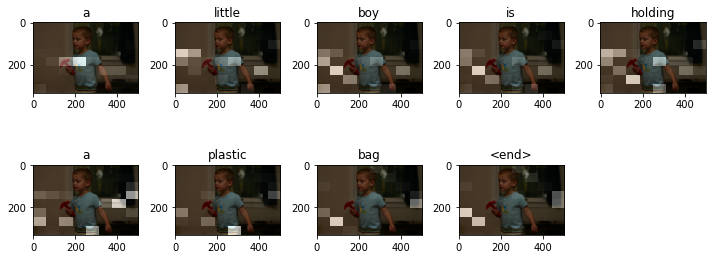

In [ ]:
show_validation(23979, sentence_generator = 'greedy')

<u>Εικόνα με id = 5490</u>:

For image with id = 5490
Real Caption: <start> a man in red with a satchel slung on his back walks on the tree lined sidewalk and is heading to the water <end>
Real Caption: <start> a man wearing sandal walking down a wood path toward water carrying a towel and a beach bag <end>
Real Caption: <start> a man walking down a lane to a beach on a sunny day <end>
Real Caption: <start> a boy in shorts walking down a pier to a beach <end>
Real Caption: <start> a man walking down a pathway [UNK] at a lake <end>
Prediction Caption: a man in a white t shirt is walking along a sidewalk <end>
blue score: 0.19696803427432394


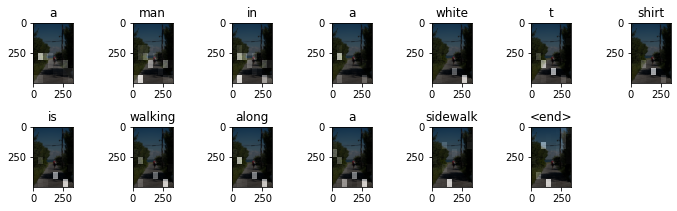

In [ ]:
show_validation(5490, sentence_generator = 'greedy')

<u>Εικόνα με id = 22782</u>:

For image with id = 22782
Real Caption: <start> children in flamboyant red white and gold costumes dancing in a parade <end>
Real Caption: <start> a small girl dancing in a parade wearing bright red and gold clothes <end>
Real Caption: <start> a girl in a red and white costume with onlookers behind her <end>
Real Caption: <start> a girl in a red and white costume standing on the street <end>
Real Caption: <start> a girl in a costume participates in a parade <end>
Prediction Caption: a little girl in a red plaid red are standing outside <end>
blue score: 0.3175901589533127


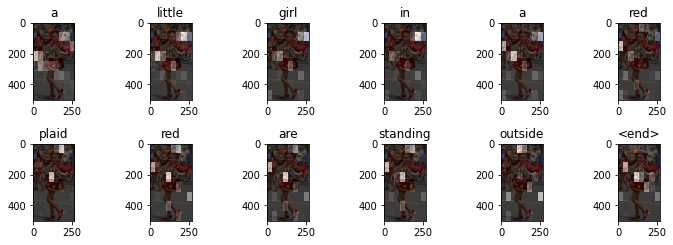

In [ ]:
show_validation(22782, sentence_generator = 'default')

<u>Εικόνα με id = 6133</u>:

For image with id = 6133
Real Caption: <start> a child in an orange shirt and blue jeans jumps from a play set while three other children look on in the background <end>
Real Caption: <start> a boy in orange shirt and blue jeans is jumping on the slide while others watches him <end>
Real Caption: <start> a boy is jumping off a playground slide as his friends watch <end>
Real Caption: <start> a young boy is jumping from the top on his swing set <end>
Real Caption: <start> a kid is jumping off of a play set <end>
Prediction Caption: a boy in a wide upside down from a jungle gym <end>
blue score: 0.2064820587143307


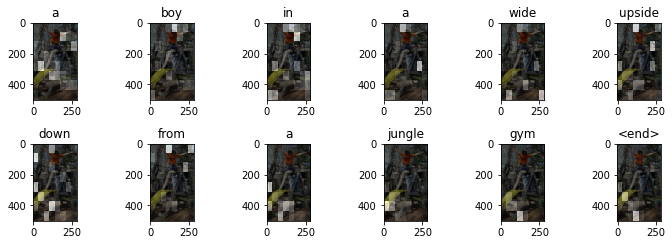

In [ ]:
show_validation(6133, sentence_generator = 'default')

<u>Εικόνα με id = 24451</u>:

For image with id = 24451
Real Caption: <start> the young man is performing a [UNK] in the air with a bicycle <end>
Real Caption: <start> a bmx biker is currently in midair doing a front flip <end>
Real Caption: <start> a man upside down while jumping a bicycle <end>
Real Caption: <start> a person is flipping on a trick bike <end>
Real Caption: <start> a bike rider performs a trick <end>
Prediction Caption: a bmx rider jumping a ramp <end>
blue score: 0.18537144651367826


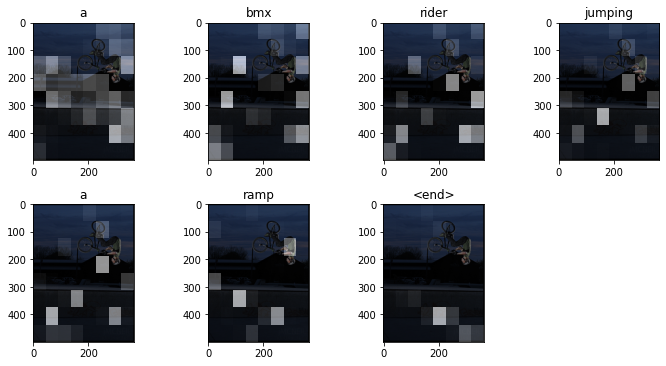

In [ ]:
show_validation(24451, sentence_generator = 'default')

Τέλος, υπολογίζουμε το bleu score που επιτυγχάνει το μοντέλο στα δεδομένα του validation set.

In [4]:
calculate_sentence_bleu(range(len(img_name_val)), img_name_val, stentence_generator = 'greedy')

0.1122437465446312


In [ ]:
calculate_sentence_bleu(range(len(img_name_val)), img_name_val, stentence_generator = 'default')

0.10012498387752991

<i><u>Σχόλιο</u>: Όσον αφορά τη χρήση του Beam Search Sentence Generator, τα αποτελέσματα αυτής δεν ήταν ιδιαίτερα ικανοποιητικά, οπότε και δεν παρουσιάζονται. Το γεγονός αυτό οφείλεται στον μεγάλο χρόνο που απιτεί για την εκτέλεσή του (αργή υλοποίηση), κάτι το οποίο μας οδήγησε να χρησιμοποιούμε beam_width το πολύ ίσο με 2, ενώ αναγκαστικά περιορίσαμε και το beam_depth μέχρι 8, δηλαδή δίναμε τη δυνατότητα πρόβλεψης captions, το πολύ μήκους 8. 

#### Σύνοψη

Στον ακόλουθο πίνακα συνοψίζουμε τα αποτελέσματα που προέκυψαν από τις παραπάνω τελικές δοκιμές.

| model | epochs | time per epoch | final train loss | val bleu score (greedy) | val bleu score (default) | test bleu score (greedy) |  test bleu score (default)
| ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | ----------- | 
| Model 1 | 40 | ~450 sec | 0.510170 | 0.1178 | 0.1152 | 0.17224 | 0.180859 |
| Model 2 | 40 | ~420 sec | 0.574013 | 0.1253 | 0.1125 | 0.20138 | 0.172456 |
| Model 3 | 30 | ~400 sec | 0.491679 | 0.1122 | 0.1001 | 0.18968 | 0.170656 |

<u>Συμπεράσματα</u>:

- Παρατηρούμε ότι και στα τρία μοντέλα η χρήση του Greedy Sentence Generator  επιτυγχάνει καλύτερα αποτελέσματα, συγκριτκά με τη χρήση του πιθανοτικού default Sentence Generator.
- Όσον αφορά τα captions που προβλέπονται, παρατηρούμε ότι εκπαιδεύοντας τα μοντέλα στο σύνολο των δεδομένων, έχουμε captions με μεγαλύτερη νοηματική και συντακτική συνάφεια. Υπάρχουν, βέβαια, και captions που είτε περιέχουν λέξεις σχετικές με το θέμα της εικόνας, τοποθετημένες όμως χωρίς συνοχή εντός της πρότασης, ακόμα και captions που δεν καταφέρνουν να προσεγγίσουν το θέμα της εικόνας, απλώς το πλήθος αυτών είναι μικρότερο. Παρατηρούμε, μάλιστα και παραδείγματα captions που καταφέρνουν να περιγράψουν καλά μόνο ένα μέρος της εικόνας. Χαρακτηριστικά παραδείγματα αυτών αποτελούν το caption της εικόνας με id =  23979, όπως αυτό προβλέπεται από το τρίτο μοντέλο ("a little boy is holding a plastic bag"), όπου απεικονίζεται ένα μικρό αγόρι να κρατά ένα πλαστικό παιχνίδι, και όχι μια πλαστική τσάντα, καθώς και το caption της εικόνας με id = 9133, προβλεπόμενο από το πρώτο μοντέλο ("a man is wearing a black hat"), όπου απεικονίνεται ένας άντρας με πορτοκαλί και όχι με μαύρο καπέλο. Σε κάθε περίπτωση πάντως υπάρχουν και αρκετά παραδείγματα επιτυχημένων captions, όπως αυτά των εικόνων με ids = 8137, 20525, 17909 (μοντέλο 1), 13555, 1601 (μοντέλο 2), 7542 και 24451 (μοντέλο 3).
- <b>Tο καλύτερο μοντέλο που υλοποιήσαμε για το συγκεκριμένο task του Image Captioning αντιστοιχεί στο μοντέλο 2</b>, ο CNΝ-Encoder του οποίου απαρτίζεται από το προεκπαιδευμένο συνελικτικό δίκτυο Xception σε σειρά με ένα fully-connected layer, ο RNN-Decoder αυτού από 512 LSTM Cells, ενώ ως Sentence Generator χρησιμοποιεί τον Greedy. Το μοντέλο αυτό, αν και αντιστοιχεί στο υψηλότερο train loss μετά το πέρας της εκπαίδευσής του, επιτυγχάνει το υψηλότερο bleu score τόσο στο validation, όσο και στο test set (οι τιμές του bleu score για το test set προκύπτουν μετά από υποβολή των αντίστοιχων αποτελεσμάτων στο διαγωνισμό). Το γεγονός αυτό μας οδηγεί στο συμπέρασμα ότι τα άλλα δύο μοντέλα παρουσιάζουν overfitting πάνω στα training δεδομένα, και για αυτό παρότι μειώνουν το train loss, αδυνατούν να επιτύχουν τόσο καλά scores σε δεδομένα εκτός αυτών (validation και tet set). 